In [1]:
import numpy as np
import pandas as pd
import pygeostat as gs
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import subprocess as sp
%pylab inline --no-import-all
from subprocess import check_output
import tensorflow as tf
from tensorflow.python import debug as tf_debug
import os
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans
from sklearn import preprocessing
import scipy.spatial as scs
import scipy as sc
import math
from scipy.spatial import distance
from sklearn.metrics import mean_squared_error
import time
from sklearn.metrics import r2_score
from random import randrange

Populating the interactive namespace from numpy and matplotlib


C:\ProgramData\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
plt_extent = 'Sensitivity_6'

In [3]:
griddef = gs.GridDef(gridfl='griddef.txt')
griddef

Pygeostat GridDef:
50 5.0 10.0 
50 5.0 10.0 
25 5.0 10.0

In [4]:
varmodelpar = '''                  Parameters for VARMODEL
                  ***********************
 
START OF PARAMETERS:
vargs/varmodel_{fold}.out                 -file for modeled variogram points output
3                            -number of directions to model points along
 90   0.0  1000   0.5      -  azm, dip, npoints, point separation
 0   0.0  1000   0.5      -  azm, dip, npoints, point separation
  0   90.0  1000   0.5      -  azm, dip, npoints, point separation
1    0.01                   -nst, nugget effect
3    0.99    0   0.0   0.0    -it,cc,azm,dip,tilt (ang1,ang2,ang3)
        200    150    150    -a_hmax, a_hmin, a_vert (ranges)
0   100000                   -fit model (0=no, 1=yes), maximum iterations
1.0                          -  variogram sill (can be fit, but not recommended in most cases)
1                            -  number of experimental files to use
vargs/varcalc_{fold}.out                  -    experimental output file 1
2   1   4                    -      # of variograms (<=0 for all), variogram #s
1   1   10                   -  # pairs weighting, inverse distance weighting, min pairs
0     10.0                   -  fix Hmax/Vert anis. (0=no, 1=yes)
0      1.0                   -  fix Hmin/Hmax anis. (0=no, 1=yes)
vargs/varmodelfit_{fold}.var              -  file to save fit variogram model
'''
varmodel= gs.Program(program='varmodel',parfile='varmodel.par')
for fold in range (1,2):
    varmodel.run(parstr=varmodelpar.format(omni= 75 + (fold)*125,
                                           fold = fold
                                          ))
# varmodelfl = gs.DataFile(flname='varmodel.out',
#                        readfl=True)
# print(varmodelfl.data.head())

Calling:  ['varmodel', 'varmodel.par']

varmodel version: 1.1.1

  output points file: vargs/varmodel_1.out
  number of directions to model points along:            3
  azm, dip, npoints, pointsep:    90.0000000000000       0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:   0.000000000000000E+000  0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:   0.000000000000000E+000   90.0000000000000     
        1000  0.500000000000000     
  nst =           1
 c0 constrained to  1.000000000000000E-002  1.000000000000000E-002
  fit model?            0      100000
  number of variogram files:            1
  variogram file: vargs/varcalc_1.out
  using variograms            1           4
  # pairs wt, inv dist wt, min pairs:            1           1          10
  fixhmaxvert,hmaxvert:            0   10.0000000000000     
  fixhminhmax,hminhmax:            0   1.00000000000000     
  variogram model output file: vargs

In [5]:
sgsimpar = '''                  Parameters for SGSIM
                  ********************

START OF PARAMETERS:
cluster.dat           -file with data
1  2  3  4  0  0              -  columns for X,Y,Z,vr,wt,sec.var.
-1.0       1.0e21             -  trimming limits
0                             -transform the data (0=no, 1=yes)
sgsim.trn                     -  file for output trans table
0                             -  consider ref. dist (0=no, 1=yes)
histsmth.out                  -  file with ref. dist distribution
1  2                          -  columns for vr and wt
0.0    15.0                   -  zmin,zmax(tail extrapolation)
1       0.0                   -  lower tail option, parameter
1      15.0                   -  upper tail option, parameter
1                             -debugging level: 0,1,2,3
sgsim.dbg                     -file for debugging output
sgsim/sgsim_{fold}.out                     -file for simulation output
1                             -number of realizations to generate
{grid}
69069                         -random number seed
0     8                       -min and max original data for sim
48                            -number of simulated nodes to use
1                             -assign data to nodes (0=no, 1=yes)
1     3                       -multiple grid search (0=no, 1=yes),num
0                             -maximum data per octant (0=not used)
250  250.0  150.0              -maximum search radii (hmax,hmin,vert)
 0.0   0.0   0.0              -angles for search ellipsoid
51    51    11                -size of covariance lookup table
0     0.60   1.0              -ktype: 0=SK,1=OK,2=LVM,3=EXDR,4=COLC
../data/ydata.dat             -  file with LVM, EXDR, or COLC variable
4                             -  column for secondary variable
{varg}

'''
sgsim= gs.Program(program='sgsim',parfile='sgsim.par')
for fold in range(1,2):
    varg = ("1    0.01                   -nst, nugget effect\n\
        3    0.99   90   0.0   0.0    -it,cc,azm,dip,tilt (ang1,ang2,ang3)\n\
        200    150    150    -a_hmax, a_hmin, a_vert (ranges)".format(75 + (fold)*125))
    sgsim.run(parstr=sgsimpar.format(varg = varg,
                                 grid = griddef,
                                 fold = fold 
                                ))
# sgsimfl = gs.DataFile(flname='sgsim.out', griddef = griddef,
#                        readfl=True)
# print(sgsimfl.data.head())

Calling:  ['sgsim', 'sgsim.par']

 SGSIM Version: 4.000

  data file = cluster.dat                             
  input columns =            1           2           3           4           0
           0
  trimming limits =   -1.000000      1.0000000E+21
  transformation flag =            0
  transformation file = sgsim.trn                               
  consider smoothed distribution (1=yes) =            0
  file with smoothed distribution = histsmth.out                            
  columns =            1           2
  data limits (tails) =   0.0000000E+00   15.00000    
  lower tail =            1  0.0000000E+00
  upper tail =            1   15.00000    
  debugging level =            1
  debugging file = sgsim.dbg                               
  output file sgsim/sgsim_1.out                       
  number of realizations =            1
  X grid specification =           50   5.000000       10.00000    
  Y grid specification =           50   5.000000       10.00000    
  Z grid

In [6]:
lognpar = """              Convert to logn
             *********************************

START OF PARAMETERS:
{datafl}                           - data file
1   {std}                                 - mean and standard deviation you want
logn/logn_{fold}.out                          - output file with lognormal data
"""

In [7]:
logn = gs.Program('logn')
for fold in range (1,11):
    sgsimfl = gs.DataFile('sgsim/sgsim_1.out'.format(fold))
    logn.run(parstr=lognpar.format(datafl = sgsimfl,
                                  std =  0.5,
                                  fold = fold))

Calling:  ['logn', 'temp']

 LOGNORM Version:          1.1000

  data file = sgsim/sgsim_1.out                       
  mean and stdev you want =    1.00000000000000       0.500000000000000     
  file for output = logn/logn_1.out                         

Finished converting    62500 values
 ERROR in parameter file
Calling:  ['logn', 'temp']

 LOGNORM Version:          1.1000

  data file = sgsim/sgsim_1.out                       
  mean and stdev you want =    1.00000000000000       0.500000000000000     
  file for output = logn/logn_2.out                         

Finished converting    62500 values
 ERROR in parameter file
Calling:  ['logn', 'temp']

 LOGNORM Version:          1.1000

  data file = sgsim/sgsim_1.out                       
  mean and stdev you want =    1.00000000000000       0.500000000000000     
  file for output = logn/logn_3.out                         

Finished converting    62500 values
 ERROR in parameter file
Calling:  ['logn', 'temp']

 LOGNORM Version: 

In [8]:
addcoordpar = '''                  Parameters for ADDCOORD
                  ***********************

START OF PARAMETERS:
{datafl}                         -file with data
logn/addcoord_{fold}.out                      -file for output
1                                 -realization number
{grid}
3 3 6                            -decimals for x, y, z (-1=exclude)
'''

addcoord= gs.Program(program='addcoord',parfile='addcoord.par')
for fold in range (1,11):
    logn = gs.DataFile('logn/logn_{}.out'.format(fold),griddef=griddef)
    addcoord.run(parstr=addcoordpar.format(datafl=logn.flname
                                    ,grid = griddef,
                                    fold = fold       
                                    ))

Calling:  ['addcoord', 'addcoord.par']

 ADDCOORD VERSION: 4.1.0

 Data File = logn/logn_1.out                         
 Output File = logn/addcoord_1.out                     
 Realization number =            1
 X grid size =           50   5.00000000000000        10.0000000000000     
 Y grid size =           50   5.00000000000000        10.0000000000000     
 Z grid size =           25   5.00000000000000        10.0000000000000     
 decimals =            3           3           6
 
 Format: (f07.03,x,f07.03,x,f10.06,x,a)      

 ADDCOORD: 4.1.0 Finished

Calling:  ['addcoord', 'addcoord.par']

 ADDCOORD VERSION: 4.1.0

 Data File = logn/logn_2.out                         
 Output File = logn/addcoord_2.out                     
 Realization number =            1
 X grid size =           50   5.00000000000000        10.0000000000000     
 Y grid size =           50   5.00000000000000        10.0000000000000     
 Z grid size =           25   5.00000000000000        10.0000000000000   

In [9]:
maketrend = gs.Program('maketrend')

maketrendpar = """              Parameters for MAKETREND
              ************************

START OF PARAMETERS:
{datafl}               -file with data
{xyzcol}                         -   columns for X, Y, Z coordinates
1  {varcol}                         -   number of variables,column numbers
-99     99                -   trimming limits
2                                 -trend type: 0 - vertical; 1 - aerial; 2 - 3D
1 50.0 1000                       -   calibrate 3D trend with vertical trend, 1=yes, and radius, num neighbors
0                                 -type of averaging volume: 0 - sphere, 1 - cube
150.0 {vert_range} 25.0                  -search radii
0.0 0.0                           -azimuth and dip
50                                -nearest neighbors to use (0 for all)
1000                               -distance cutoff
0                                 -weighting function: 0 - equal, 1 - Gaussian
0 3                               -apply post processing filter: 1 - yes, number of iterations
51 51 5                             -filter size: nx, ny, nz
0                                 -filter weighting function: 0 - equal, 1 - Gaussian
1                                 -ensure sum to 1 for compositional trends: 1 - yes
maketrend/trend_{fold}.out                         -file for trend output
{griddef}
1                                 -output count and radius info, 1=yes



Additional Options/Notes
 - for vertical trends, a 2D/3D model is output if nx and/or ny are > 1
 - for aerial trends, a 3D model is output if nz > 1
 - ensuring a sum to 1 is only applied for multiple variables
"""

for fold in range(1,11):
    lognfl = gs.DataFile('logn/addcoord_{}.out'.format(fold))
    maketrend.run(parstr=maketrendpar.format(datafl=lognfl.flname,
                                        griddef = griddef,
                                        fold = fold,
                                        varcol=lognfl.gscol('value'),
                                        xyzcol= lognfl.gscol(lognfl.xyz),
                                        vert_range = 250*(fold)*2     
                                        ))

Calling:  ['maketrend', 'temp']

 MAKETRENDS Version: 1.000

 data file = logn/addcoord_1.out
 columns for x,y,z =    1   2   3
 number of variables =   1
 variable columns =    4
 trimmming limits =  -99.00   99.00
 trend type = 3D
 3D trend calibration option, radius, NN =  1  50.00 1000
 volume type =  0
 search radii =  150.00  500.00   25.00
 azimuth and dip =    0.00    0.00
 nearest neighbors =     50
 distance cutoff =    1000.00
 weighting function = equal
 filter option and iterations =  0  3
 filter size in x,y,z blocks =   51  51   5
 filter weighting function = equal
 ensure sum constraint =   1
 output file = maketrend/trend_1.out
 grid spec in x =   50        5.00   10.00
 grid spec in y =   50        5.00   10.00
 grid spec in z =   25        5.00   10.00
 count and radius output option =   1
   Reading in the data
 Found    0 duplicates in the data
 computing vertical trend

    working on slice       2
    working on slice       4
    working on slice       6
    work

   Reading in the data
 Found    0 duplicates in the data
 computing vertical trend

    working on slice       2
    working on slice       4
    working on slice       6
    working on slice       8
    working on slice      10
    working on slice      12
    working on slice      14
    working on slice      16
    working on slice      18
    working on slice      20
    working on slice      22
    working on slice      24
 finished vertical trend

 working on node    3125
 working on node    6250
 working on node    9375
 working on node   12500
 working on node   15625
 working on node   18750
 working on node   21875
 working on node   25000
 working on node   28125
 working on node   31250
 working on node   34375
 working on node   37500
 working on node   40625
 working on node   43750
 working on node   46875
 working on node   50000
 working on node   53125
 working on node   56250
 working on node   59375
 working on node   62500

 Calibrating 3d trend with vertical tren

 working on node   34375
 working on node   37500
 working on node   40625
 working on node   43750
 working on node   46875
 working on node   50000
 working on node   53125
 working on node   56250
 working on node   59375
 working on node   62500

 Calibrating 3d trend with vertical trend
    calibrating layer   1
    calibrating layer   2
    calibrating layer   3
    calibrating layer   4
    calibrating layer   5
    calibrating layer   6
    calibrating layer   7
    calibrating layer   8
    calibrating layer   9
    calibrating layer  10
    calibrating layer  11
    calibrating layer  12
    calibrating layer  13
    calibrating layer  14
    calibrating layer  15
    calibrating layer  16
    calibrating layer  17
    calibrating layer  18
    calibrating layer  19
    calibrating layer  20
    calibrating layer  21
    calibrating layer  22
    calibrating layer  23
    calibrating layer  24
    calibrating layer  25

 generating output file

 MERGETRENDS 1.000 FINISHED

Ca


 MERGETRENDS 1.000 FINISHED



In [10]:
gsamplepar = '''       Parameters for gsample V2.000
     *********************************
       
START OF PARAMETERS:
1                            - Number of files to sample
{datafl}            - File with first grid
1  {varcol1}                        - Number of variables and columns
1                            - Realization to sample
{griddef}
0                            - Sampling spacing option (0=regular, 1=random)
125  125                      -  If 0, spacing in X, Y
65  65                    -  If 0, collar of the first sample, X and Y (inside sampling grid)
100  69069                    -  If 1, number of drill holes and seed number
0  90                        - Azimuth and dip
10                            - Sample spacing downhole
1                          - Starting drill hole ID for new drills
2                            - Number of decimal places (coordinates precision, up to 6)
5   495                       - Sampling grid: xmin, xmax
5   495                       -                ymin, ymax
5   245                       -                zmin, zmax
dhs_{fold}.out        - Output file with new drill holes
0                            - Output keyout file? (0=no, 1=yes)
0                            -  If keyout (0=input grid inside sampling grid, 1=input blocks with assays)
keyout.out         - Keyout file
'''
for fold in range (1,11):
    sgsimfl = gs.DataFile('maketrend/trend_{}.out'.format(fold),griddef=griddef)
    gsample= gs.Program(program='gsample',parfile='gsample.par')
    gsample.run(parstr=gsamplepar.format(datafl=sgsimfl.flname,
                                           varcol1=sgsimfl.gscol('variable 1'),
                                           griddef=griddef,
                                           fold=fold
                                           ))

Calling:  ['gsample', 'gsample.par']

GSAMPLE Version: 1.000

PARAMETER FILE                  = gsample.par                                                                                                                                                                                                                                                     
-----------------------------------------------------------------------------

INPUT PARAMETERS 

Number of grids to sample       =   1
Total number of variables       =   1
 
Data file  1                    = 
maketrend/trend_1.out
Variable columns                =   1
 
Sample realization number       =   1
 
Input grid 
Input grid in X                 =   50        5.00   10.00
Input grid in Y                 =   50        5.00   10.00
Input grid in Z                 =   25        5.00   10.00
 
Sample option                   =   0
 
Consider regular spacing 

 
Spacing in X                    =    125.    
Spacing in Y                

Calling:  ['gsample', 'gsample.par']

GSAMPLE Version: 1.000

PARAMETER FILE                  = gsample.par                                                                                                                                                                                                                                                     
-----------------------------------------------------------------------------

INPUT PARAMETERS 

Number of grids to sample       =   1
Total number of variables       =   1
 
Data file  1                    = 
maketrend/trend_5.out
Variable columns                =   1
 
Sample realization number       =   1
 
Input grid 
Input grid in X                 =   50        5.00   10.00
Input grid in Y                 =   50        5.00   10.00
Input grid in Z                 =   25        5.00   10.00
 
Sample option                   =   0
 
Consider regular spacing 

 
Spacing in X                    =    125.    
Spacing in Y                

-----------------------------------------------------------------------------

Allocating memory 

Finding block indices 

Sampling from grid 

Number of drill holes successfully created =   16
-----------------------------------------------------------------------------

END

Total execution time 0.150 seconds.
Calling:  ['gsample', 'gsample.par']

GSAMPLE Version: 1.000

PARAMETER FILE                  = gsample.par                                                                                                                                                                                                                                                     
-----------------------------------------------------------------------------

INPUT PARAMETERS 

Number of grids to sample       =   1
Total number of variables       =   1
 
Data file  1                    = 
maketrend/trend_9.out
Variable columns                =   1
 
Sample realization number       =   1
 
Input grid 
Input gr

In [11]:
varsim = gs.Program('varsim')
varsimparstr = """                 Parameters for VarSim
                 *********************

START OF PARAMETERS:
../data/lithology.dat        -file with lithology information
0   7                        -   lithology column (0=not used), code
{datafl}             -file with data
1   1                -   number of variables, column numbers
-1.0e21     1.0e21    -   trimming limits
./vargs/varsim_reals_{fold}.out      -output file for variograms of realizations
./vargs/varsim_avg_{fold}.out        -output file for average variogram
{griddef}
1                  -number of realizations
3  50                 -number of directions, number of lags
1  0  0              -ixd(1),iyd(1),izd(1)
0  1  0              -ixd(2),iyd(2),izd(2)
0  0  1              -ixd(2),iyd(2),izd(2)
1                     -standardize sill? (0=no, 1=yes)
1                     -number of variograms
1   1   1             -tail variable, head variable, variogram type
"""

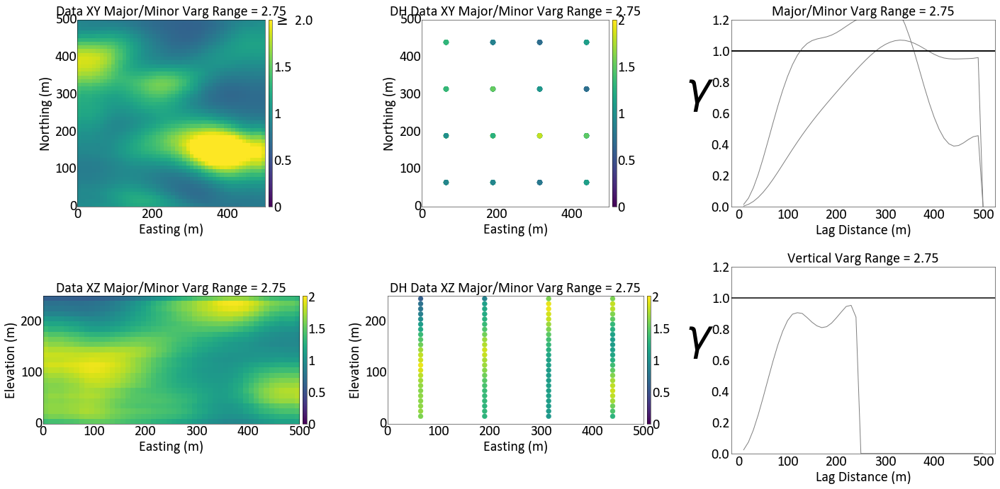

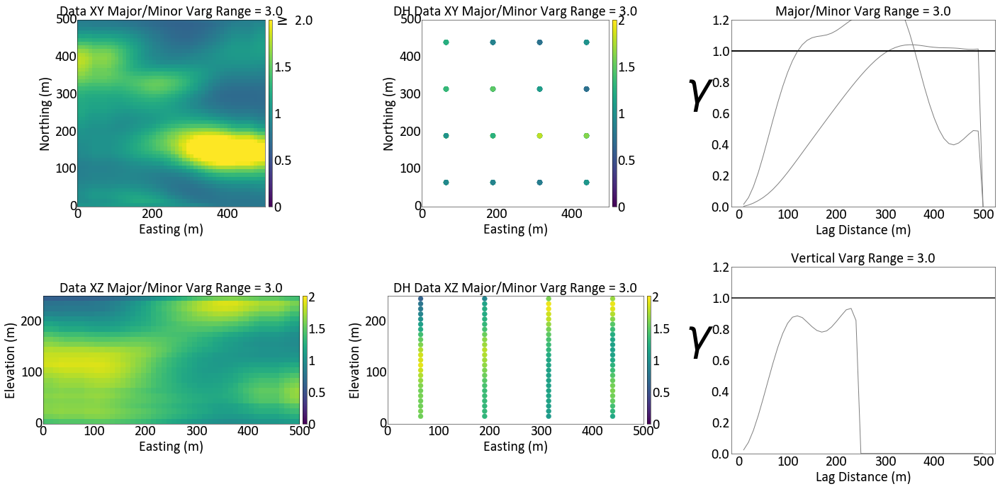

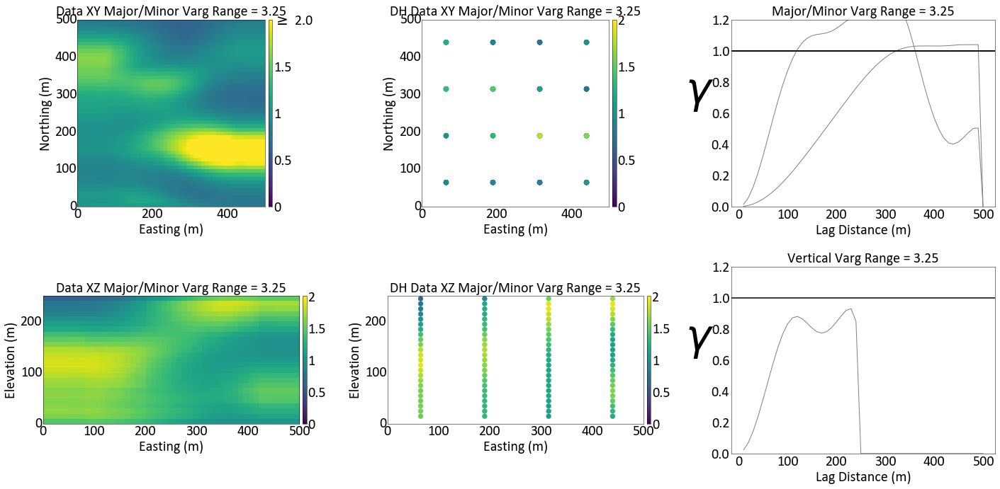

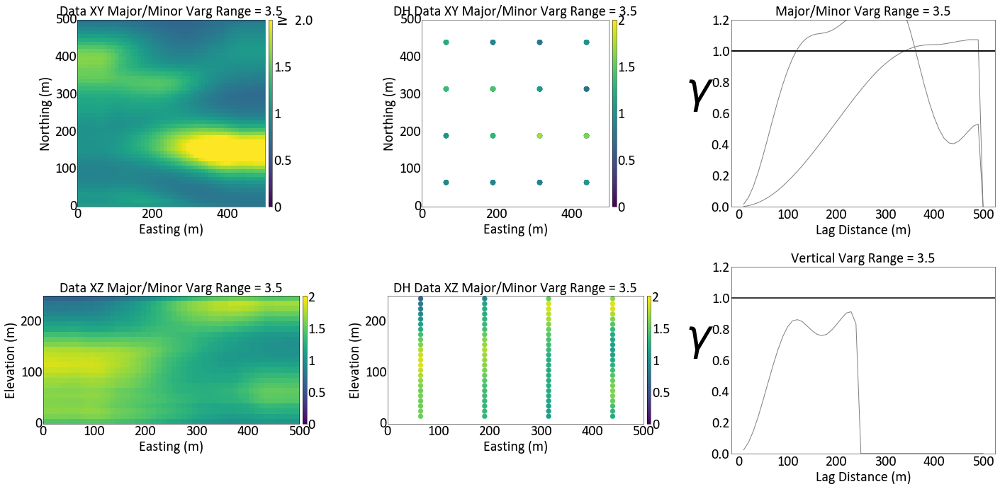

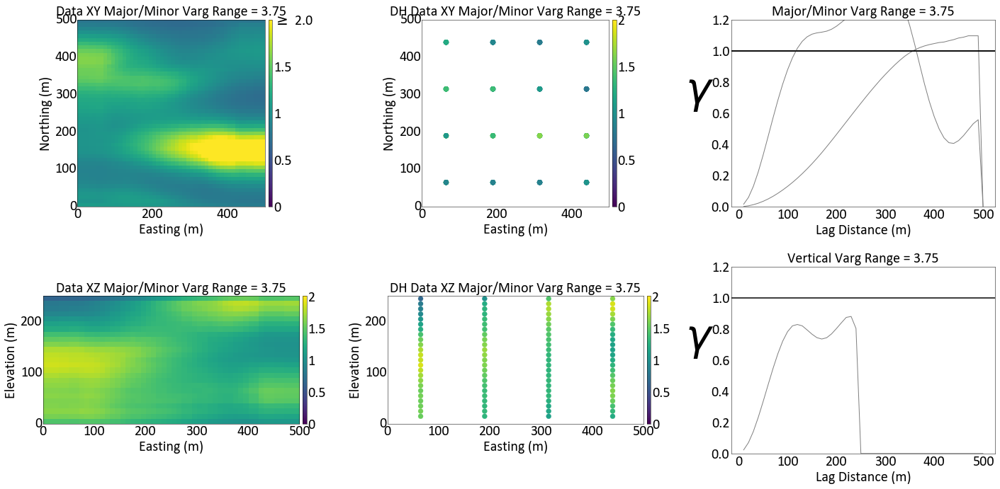

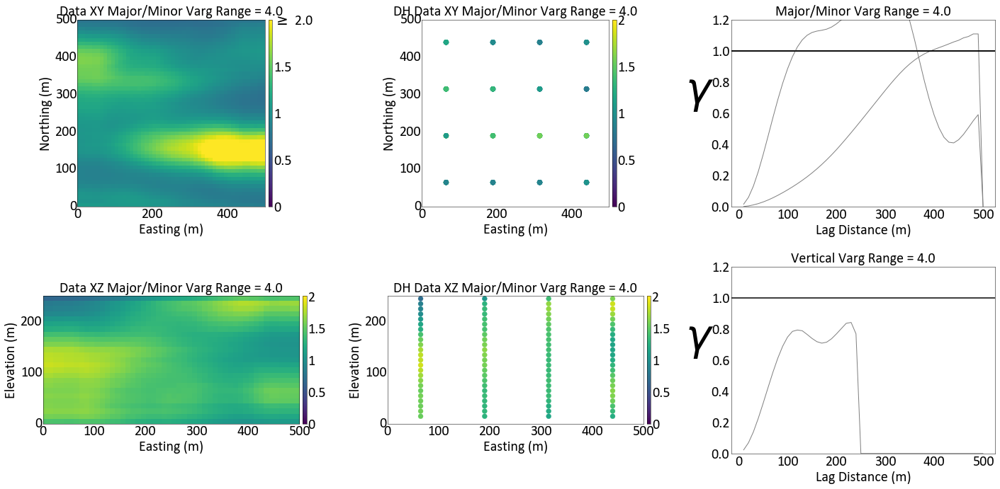

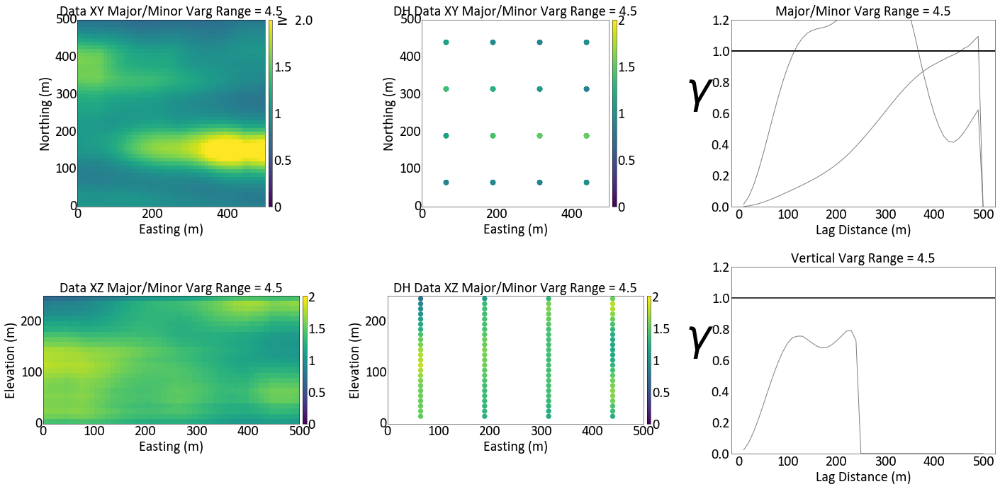

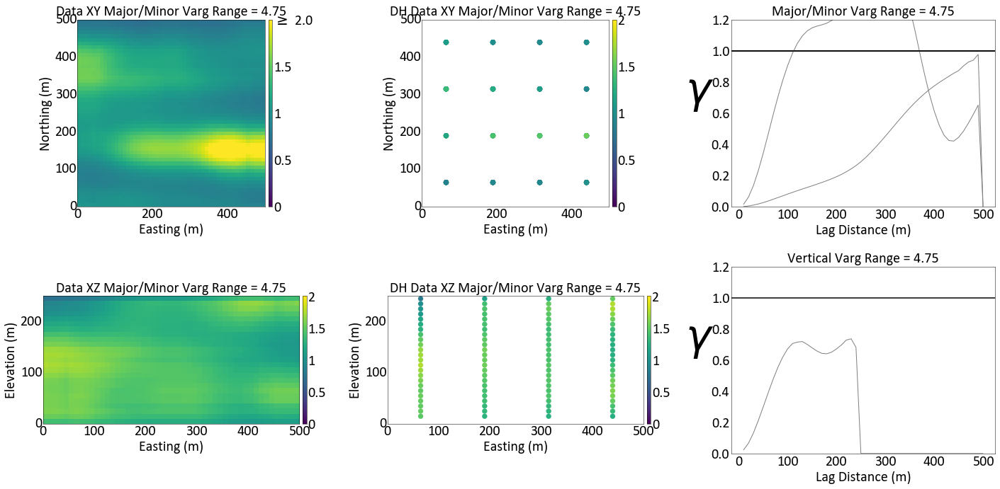

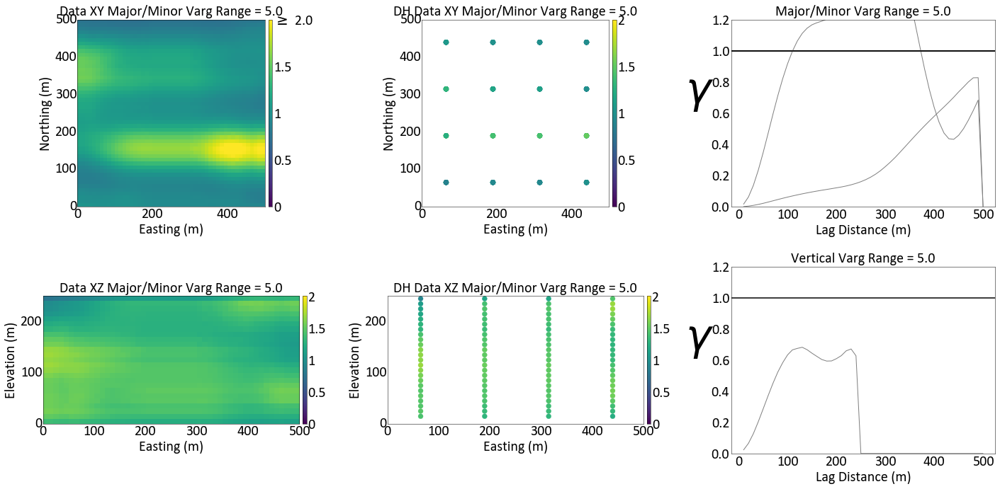

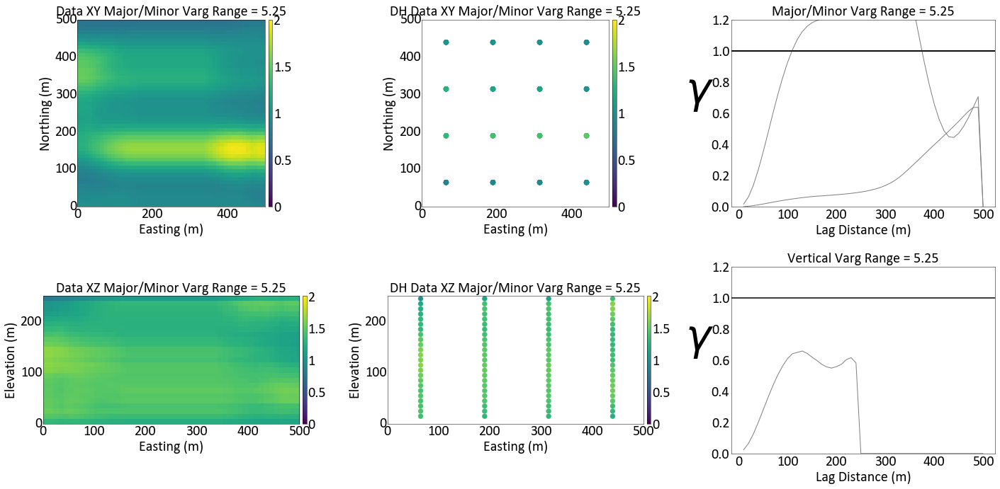

In [51]:
vlim = (0,2.0)
gs.set_style('pt20')
sliceno = 15

for fold in range (1,11):
    f, axes = plt.subplots(2, 3, figsize=(20, 10)) 
    dataflpoints = gs.DataFile(flname='dhs_{}.out'.format(fold), x='X',y='Y',z='Z', griddef = griddef,
                           readfl=True)
    sgsimfl = gs.DataFile('maketrend/trend_{}.out'.format(fold),griddef=griddef)
    
    varsim.run(varsimparstr.format(datafl = sgsimfl,
                               fold = fold,
                               griddef = griddef),quiet=True,liveoutput=False)
    vargplt_data =  gs.DataFile('./vargs/varsim_reals_{}.out'.format(fold))
    
    if fold <= 6:
        std = 2.50+(fold)*.25
    else:
        std = 2.50+(fold)*.25+.25
        
    std = float("{0:.3f}".format(std))
    gs.pixelplt(sgsimfl,var='variable 1',sliceno= 20, ax = axes[0,0],title = ('Data XY Major/Minor Varg Range = {}').format(std),vlim=vlim)
    gs.pixelplt(sgsimfl,var='variable 1',orient='xz',sliceno= 20, ax = axes[1,0],title = ('Data XZ Major/Minor Varg Range = {}').format(std),vlim=vlim)
    gs.locmap(dataflpoints,var = 'variable 1',orient='xy', ax = axes[0,1],sliceno= 15,title = ('DH Data XY Major/Minor Varg Range = {}').format(std),vlim=vlim)
    gs.locmap(dataflpoints,var = 'variable 1',orient='xz', ax = axes[1,1],sliceno= 15,title = ('DH Data XZ Major/Minor Varg Range = {}').format(std),vlim=vlim)
    gs.varplt(vargplt_data,index = 1,experimental=False,label = 'Major', title = ('Major/Minor Varg Range = {}').format(std),ax = axes[0,2])
    gs.varplt(vargplt_data,index = 2,experimental=False,label = 'Minor', title = ('Major/Minor Varg Range = {}').format(std),ax = axes[0,2])
    gs.varplt(vargplt_data,index = 3,experimental=False,label = 'Vertical', title = ('Vertical Varg Range = {}').format(std),ax = axes[1,2])
    plt.tight_layout()
    plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Data_Drill_{}_{}.png'.format(fold,plt_extent),vlim=vlim)


In [4]:
if 'session' in locals() and session is not None:
    print('Close interactive session')
    session.close()
    tf.InteractiveSession.close(sess)
    sess.close()

0.5669
1.9345
1
Working on Node 5 fold 1 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmph04tbxdn', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D1AD91208>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
Instructions for updating:
Queue-based input pipelines have b

Epoch: 800/5000 err = 0.014217406045645475
Cost_test : 0.014046892
R^2:0.7877950668334961
Epoch: 900/5000 err = 0.014844447374343872
Cost_test : 0.013557578
R^2:0.7726837992668152
Epoch: 1000/5000 err = 0.012154698837548494
Cost_test : 0.012037278
R^2:0.8219233751296997
Epoch: 1100/5000 err = 0.012782002333551645
Cost_test : 0.011486919
R^2:0.8106526136398315
Epoch: 1200/5000 err = 0.01007838360965252
Cost_test : 0.010881564
R^2:0.8486915528774261
Epoch: 1300/5000 err = 0.00859479559585452
Cost_test : 0.009732804
R^2:0.8527003526687622
Epoch: 1400/5000 err = 0.008279856760054827
Cost_test : 0.0095313415
R^2:0.8842571377754211
Epoch: 1500/5000 err = 0.00739922234788537
Cost_test : 0.0090651205
R^2:0.8956386148929596
Epoch: 1600/5000 err = 0.006803123978897929
Cost_test : 0.008048774
R^2:0.90376415848732
Epoch: 1700/5000 err = 0.006383627420291305
Cost_test : 0.007806418
R^2:0.9063193500041962
Epoch: 1800/5000 err = 0.006667126435786486
Cost_test : 0.007602542
R^2:0.8939445912837982
Epoc

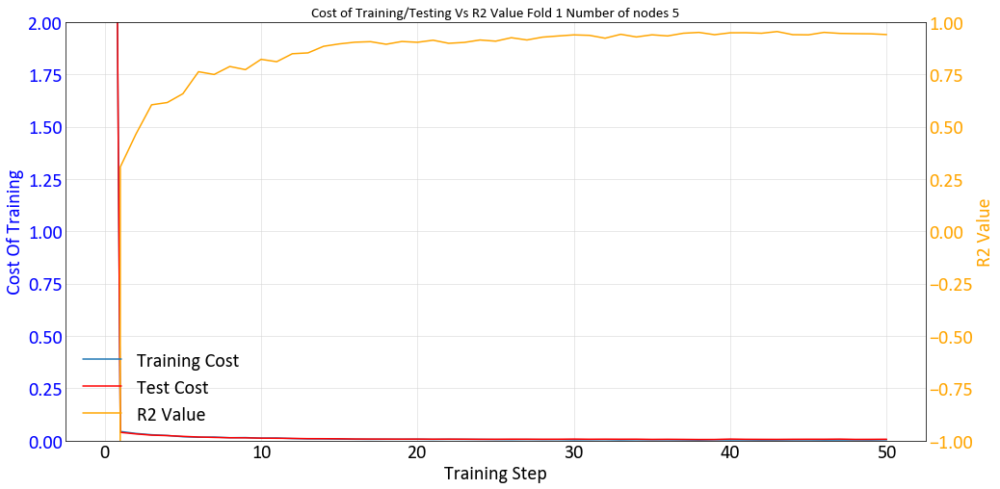

Working on Node 8 fold 1 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmptpg1xlx6', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D81ECD278>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

Epoch: 1100/5000 err = 0.00998705206438899
Cost_test : 0.01063997
R^2:0.8476536273956299
Epoch: 1200/5000 err = 0.008359046187251806
Cost_test : 0.009892164
R^2:0.8745238482952118
Epoch: 1300/5000 err = 0.007478472078219056
Cost_test : 0.009027172
R^2:0.8892428576946259
Epoch: 1400/5000 err = 0.007053306559100747
Cost_test : 0.008305804
R^2:0.8951306343078613
Epoch: 1500/5000 err = 0.005881087156012654
Cost_test : 0.0070959763
R^2:0.9133783280849457
Epoch: 1600/5000 err = 0.00526638375595212
Cost_test : 0.0069908462
R^2:0.9189089238643646
Epoch: 1700/5000 err = 0.0046405731700360775
Cost_test : 0.0059888056
R^2:0.930839866399765
Epoch: 1800/5000 err = 0.0042014895007014275
Cost_test : 0.0064446055
R^2:0.9393733739852905
Epoch: 1900/5000 err = 0.003894893336109817
Cost_test : 0.005385839
R^2:0.9382268786430359
Epoch: 2000/5000 err = 0.003371779923327267
Cost_test : 0.0056347623
R^2:0.9491866230964661
Epoch: 2100/5000 err = 0.002779872971586883
Cost_test : 0.006205193
R^2:0.9600450098514

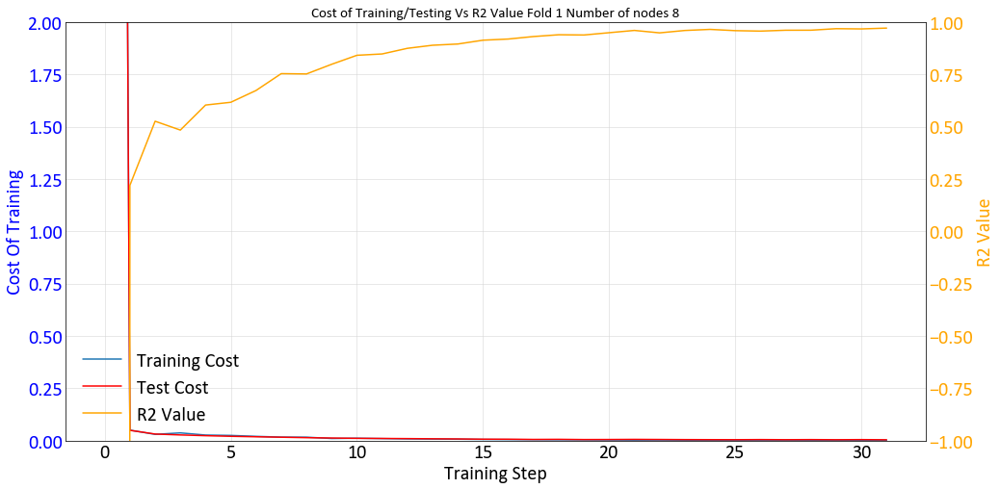

Working on Node 10 fold 1 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmph_6kl4qk', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D70DCF0F0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.007273375988006592
Cost_test : 0.011191293
R^2:0.889385312795639
Epoch: 1200/5000 err = 0.004881466506049037
Cost_test : 0.010236073
R^2:0.9253570735454559
Epoch: 1300/5000 err = 0.0053119047079235315
Cost_test : 0.009160804
R^2:0.9190852046012878
Epoch: 1400/5000 err = 0.005517974495887756
Cost_test : 0.008881741
R^2:0.9182446002960205
Epoch: 1500/5000 err = 0.004647127585485578
Cost_test : 0.008295056
R^2:0.9340671300888062
Epoch: 1600/5000 err = 0.0045941832941025496
Cost_test : 0.007761897
R^2:0.9275426864624023
Epoch: 1700/5000 err = 0.004120636265724897
Cost_test : 0.006940304
R^2:0.9376786053180695
Epoch: 1800/5000 err = 0.003876935923472047
Cost_test : 0.0069539244
R^2:0.9366648197174072
Epoch: 1900/5000 err = 0.003332953085191548
Cost_test : 0.006793736
R^2:0.94948410987854
Epoch: 2000/5000 err = 0.003264520433731377
Cost_test : 0.006261237
R^2:0.9496072232723236
Epoch: 2100/5000 err = 0.0025028593372553587
Cost_test : 0.006283048
R^2:0.963195443153381

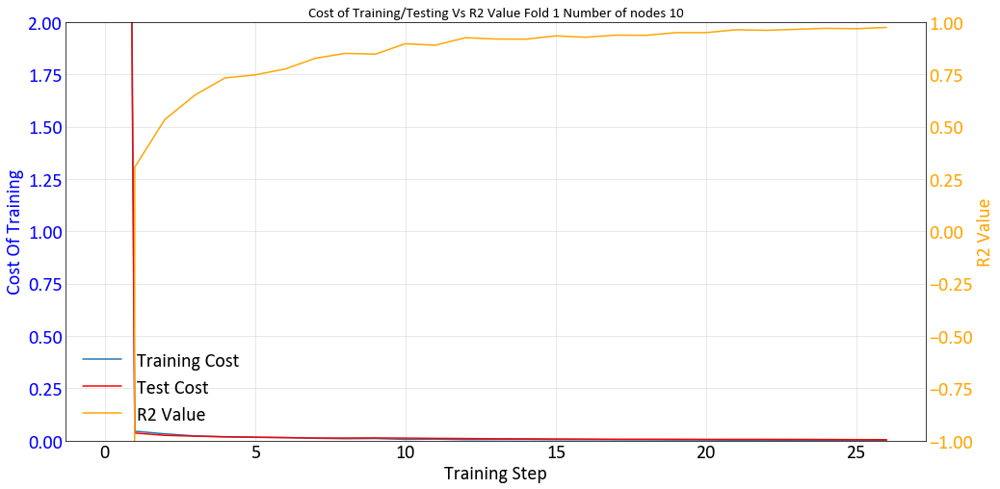

Working on Node 12 fold 1 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmptp_7bxzi', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D1755BF28>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.008115027332678437
Cost_test : 0.008622545
R^2:0.883463054895401
Epoch: 1200/5000 err = 0.007093062391504645
Cost_test : 0.008339836
R^2:0.895336925983429
Epoch: 1300/5000 err = 0.0060605856124311686
Cost_test : 0.008142294
R^2:0.919515073299408
Epoch: 1400/5000 err = 0.005943050142377615
Cost_test : 0.007902788
R^2:0.9178857803344727
Epoch: 1500/5000 err = 0.004966438980773091
Cost_test : 0.007819778
R^2:0.919983446598053
Epoch: 1600/5000 err = 0.004263178096152842
Cost_test : 0.007612764
R^2:0.9299083948135376
Epoch: 1700/5000 err = 0.004467406310141087
Cost_test : 0.0075034522
R^2:0.9340163469314575
Epoch: 1800/5000 err = 0.0034857229329645634
Cost_test : 0.0075956937
R^2:0.9494525194168091
Epoch: 1900/5000 err = 0.003826587344519794
Cost_test : 0.007525262
R^2:0.9486259520053864
Epoch: 2000/5000 err = 0.003386456402949989
Cost_test : 0.0068882117
R^2:0.9454673826694489
Epoch: 2100/5000 err = 0.003236852237023413
Cost_test : 0.0062549235
R^2:0.95375695824623

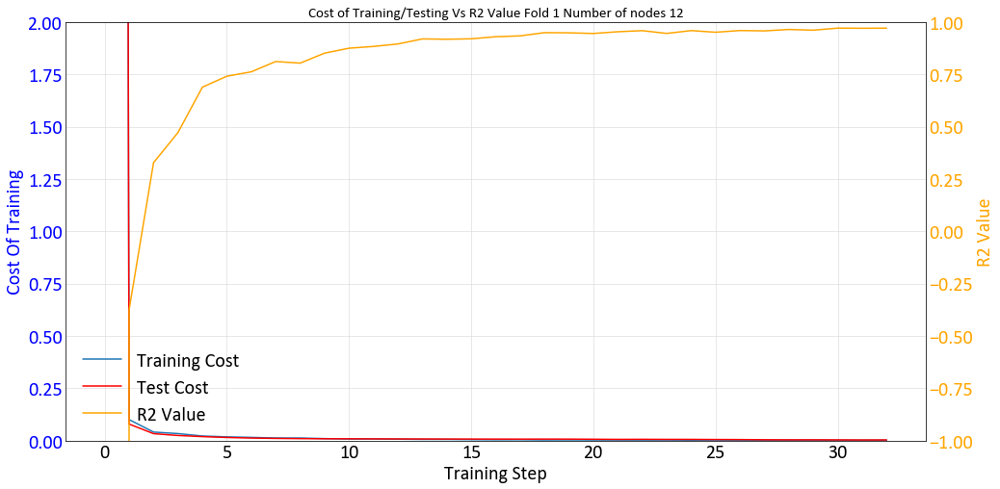

0.5922
1.9432
2
Working on Node 5 fold 2 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpm0fwpeo5', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D8961FDA0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done callin

Epoch: 1100/5000 err = 0.010938695631921291
Cost_test : 0.014135379
R^2:0.8191266059875488
Epoch: 1200/5000 err = 0.008212397573515773
Cost_test : 0.013793031
R^2:0.8506783246994019
Epoch: 1300/5000 err = 0.009569625835865736
Cost_test : 0.012240971
R^2:0.8553200662136078
Epoch: 1400/5000 err = 0.008143667597323656
Cost_test : 0.012565827
R^2:0.8692769706249237
Epoch: 1500/5000 err = 0.0070105057675391436
Cost_test : 0.01154951
R^2:0.879129946231842
Epoch: 1600/5000 err = 0.007250162540003657
Cost_test : 0.010653118
R^2:0.8719218373298645
Epoch: 1700/5000 err = 0.007550787413492799
Cost_test : 0.010732252
R^2:0.8570182025432587
Epoch: 1800/5000 err = 0.006489520659670234
Cost_test : 0.010853297
R^2:0.886322557926178
Epoch: 1900/5000 err = 0.006486633792519569
Cost_test : 0.010406055
R^2:0.8907793462276459
Epoch: 2000/5000 err = 0.005649581551551819
Cost_test : 0.010851929
R^2:0.8972319066524506
Epoch: 2100/5000 err = 0.007184936432167888
Cost_test : 0.009744508
R^2:0.8773169815540314
E

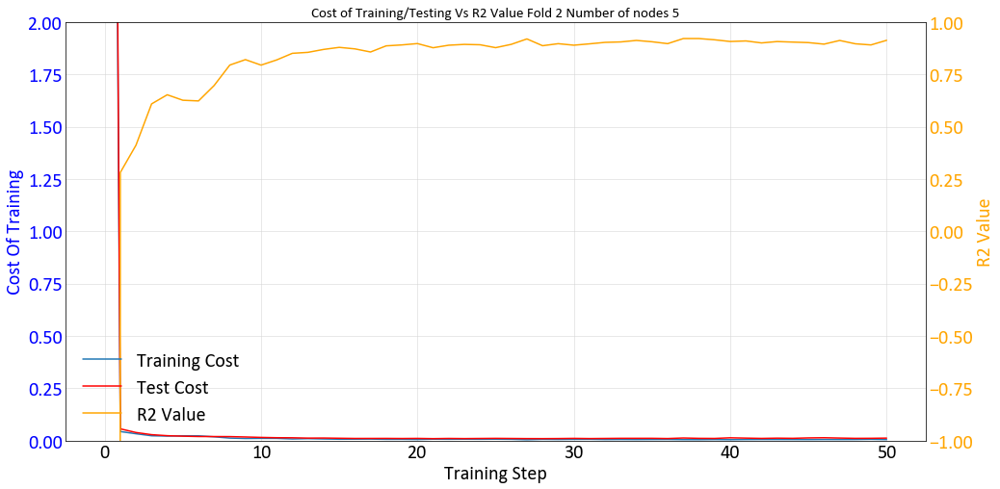

Working on Node 8 fold 2 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpihkw_x2n', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D1B16C9E8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

Epoch: 1100/5000 err = 0.0077214299235492945
Cost_test : 0.009680393
R^2:0.8727431297302246
Epoch: 1200/5000 err = 0.008203900186344981
Cost_test : 0.009015854
R^2:0.8654783964157104
Epoch: 1300/5000 err = 0.006371812662109733
Cost_test : 0.008388477
R^2:0.8882448375225067
Epoch: 1400/5000 err = 0.006348832976073027
Cost_test : 0.008043231
R^2:0.8949495255947113
Epoch: 1500/5000 err = 0.004984825616702437
Cost_test : 0.007876186
R^2:0.9133655726909637
Epoch: 1600/5000 err = 0.004672364564612508
Cost_test : 0.0072743203
R^2:0.9131247401237488
Epoch: 1700/5000 err = 0.0050069286953657866
Cost_test : 0.0071320347
R^2:0.9177854061126709
Epoch: 1800/5000 err = 0.004225567914545536
Cost_test : 0.0068843854
R^2:0.9349877536296844
Epoch: 1900/5000 err = 0.0035355379804968834
Cost_test : 0.006605998
R^2:0.9424739480018616
Epoch: 2000/5000 err = 0.0045749840792268515
Cost_test : 0.0064683845
R^2:0.9321783185005188
Epoch: 2100/5000 err = 0.0032658774871379137
Cost_test : 0.006134295
R^2:0.9466301

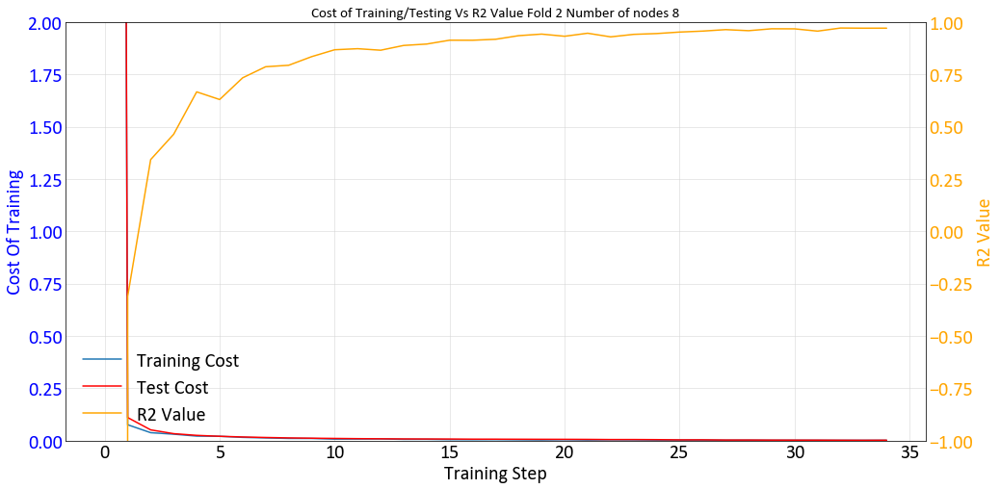

Working on Node 10 fold 2 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmprurldpln', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D17AF75C0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.007524380460381508
Cost_test : 0.01094964
R^2:0.8799545168876648
Epoch: 1200/5000 err = 0.005483171436935663
Cost_test : 0.010007247
R^2:0.9036696553230286
Epoch: 1300/5000 err = 0.0062969038262963295
Cost_test : 0.008663742
R^2:0.8993009030818939
Epoch: 1400/5000 err = 0.004617065191268921
Cost_test : 0.007979366
R^2:0.920451432466507
Epoch: 1500/5000 err = 0.004974274896085262
Cost_test : 0.007169171
R^2:0.9184353649616241
Epoch: 1600/5000 err = 0.003913239692337811
Cost_test : 0.0062406636
R^2:0.9322996735572815
Epoch: 1700/5000 err = 0.003396919695660472
Cost_test : 0.0055573164
R^2:0.9443694651126862
Epoch: 1800/5000 err = 0.003483193344436586
Cost_test : 0.005076711
R^2:0.9409521818161011
Epoch: 1900/5000 err = 0.002587151015177369
Cost_test : 0.004720272
R^2:0.9583750367164612
Epoch: 2000/5000 err = 0.0023205606266856194
Cost_test : 0.004413056
R^2:0.9604953527450562
Epoch: 2100/5000 err = 0.002161778451409191
Cost_test : 0.004182637
R^2:0.96137356758117

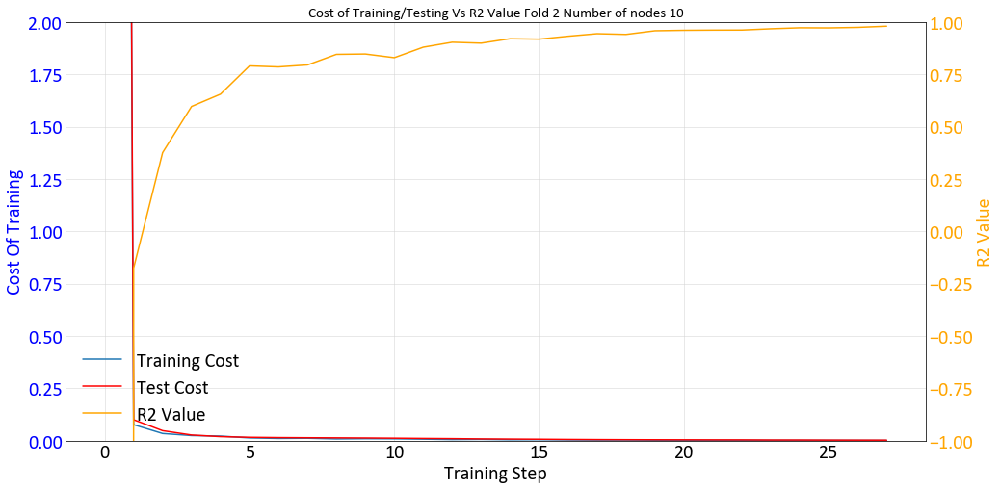

Working on Node 12 fold 2 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpk5pcj592', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D17575C50>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.007751869736239314
Cost_test : 0.01014251
R^2:0.872772604227066
Epoch: 1200/5000 err = 0.007194465724751353
Cost_test : 0.00889648
R^2:0.8900469541549683
Epoch: 1300/5000 err = 0.0059873745776712894
Cost_test : 0.008031057
R^2:0.897970974445343
Epoch: 1400/5000 err = 0.005612812004983425
Cost_test : 0.006920021
R^2:0.9113612174987793
Epoch: 1500/5000 err = 0.004346864297986031
Cost_test : 0.0064672586
R^2:0.9302530288696289
Epoch: 1600/5000 err = 0.004108373308554292
Cost_test : 0.005749677
R^2:0.9248688817024231
Epoch: 1700/5000 err = 0.0040534635772928596
Cost_test : 0.005359597
R^2:0.933506190776825
Epoch: 1800/5000 err = 0.003468925249762833
Cost_test : 0.00503389
R^2:0.9417418539524078
Epoch: 1900/5000 err = 0.0036314185708761215
Cost_test : 0.0048063127
R^2:0.9401803910732269
Epoch: 2000/5000 err = 0.0034827044000849128
Cost_test : 0.0043507684
R^2:0.9418619871139526
Epoch: 2100/5000 err = 0.0021249628625810146
Cost_test : 0.0045139985
R^2:0.9665650725364

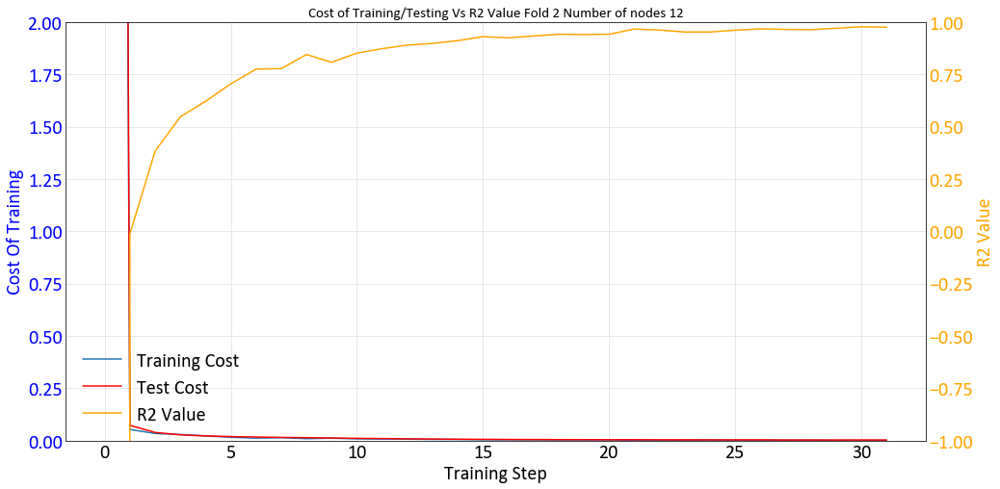

0.5971
1.925
3
Working on Node 5 fold 3 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpx04o9e2l', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D1B1896A0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling

Epoch: 1100/5000 err = 0.009147015633061528
Cost_test : 0.01801935
R^2:0.8421091139316559
Epoch: 1200/5000 err = 0.009302330669015646
Cost_test : 0.01680993
R^2:0.8395911455154419
Epoch: 1300/5000 err = 0.009595053736120462
Cost_test : 0.017192204
R^2:0.8301423192024231
Epoch: 1400/5000 err = 0.008072161115705967
Cost_test : 0.018307948
R^2:0.8698409795761108
Epoch: 1500/5000 err = 0.00791396968998015
Cost_test : 0.017055498
R^2:0.8635173141956329
Epoch: 1600/5000 err = 0.0086838249117136
Cost_test : 0.017018607
R^2:0.8497198224067688
Epoch: 1700/5000 err = 0.006512485444545746
Cost_test : 0.017800923
R^2:0.8892467319965363
Epoch: 1800/5000 err = 0.00821743719279766
Cost_test : 0.016848179
R^2:0.8724021017551422
Epoch: 1900/5000 err = 0.0074220837559551
Cost_test : 0.016197188
R^2:0.8838185667991638
Epoch: 2000/5000 err = 0.006881656125187874
Cost_test : 0.017100142
R^2:0.8702852725982666
Epoch: 2100/5000 err = 0.007572344271466136
Cost_test : 0.015641868
R^2:0.8660767078399658
Epoch: 

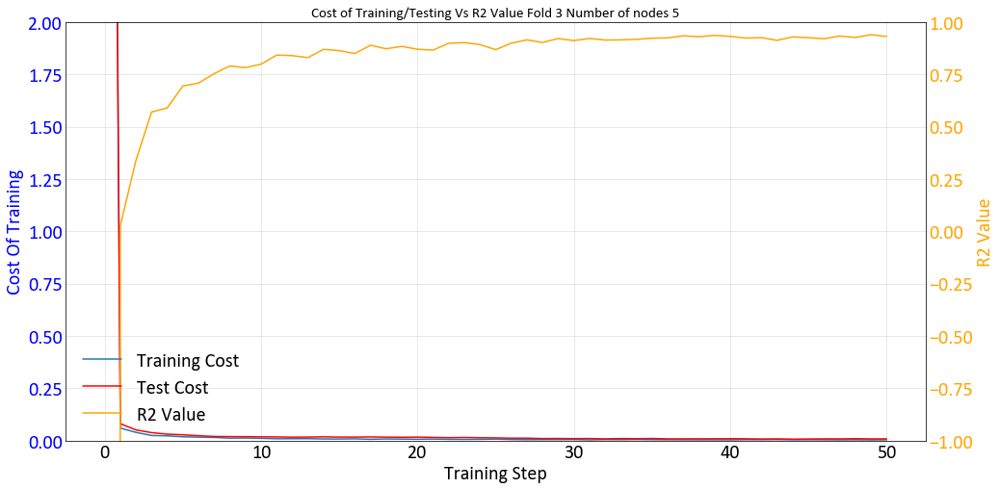

Working on Node 8 fold 3 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpbblewdh6', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D1758CC18>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

Epoch: 1100/5000 err = 0.008783167693763971
Cost_test : 0.014116738
R^2:0.8572587966918945
Epoch: 1200/5000 err = 0.008037260733544827
Cost_test : 0.013243962
R^2:0.8743630349636078
Epoch: 1300/5000 err = 0.007582235615700483
Cost_test : 0.012708512
R^2:0.8755670785903931
Epoch: 1400/5000 err = 0.006149320863187313
Cost_test : 0.012373571
R^2:0.8934446275234222
Epoch: 1500/5000 err = 0.0055021545849740505
Cost_test : 0.01116822
R^2:0.8887907564640045
Epoch: 1600/5000 err = 0.006378787336871028
Cost_test : 0.009433882
R^2:0.8890390992164612
Epoch: 1700/5000 err = 0.00393032340798527
Cost_test : 0.008761529
R^2:0.9274651408195496
Epoch: 1800/5000 err = 0.0049971595872193575
Cost_test : 0.008032017
R^2:0.9176985919475555
Epoch: 1900/5000 err = 0.004606081871315837
Cost_test : 0.007639656
R^2:0.9266287088394165
Epoch: 2000/5000 err = 0.003801697166636586
Cost_test : 0.0070222723
R^2:0.924817681312561
Epoch: 2100/5000 err = 0.002944796229712665
Cost_test : 0.006189837
R^2:0.9549782872200012

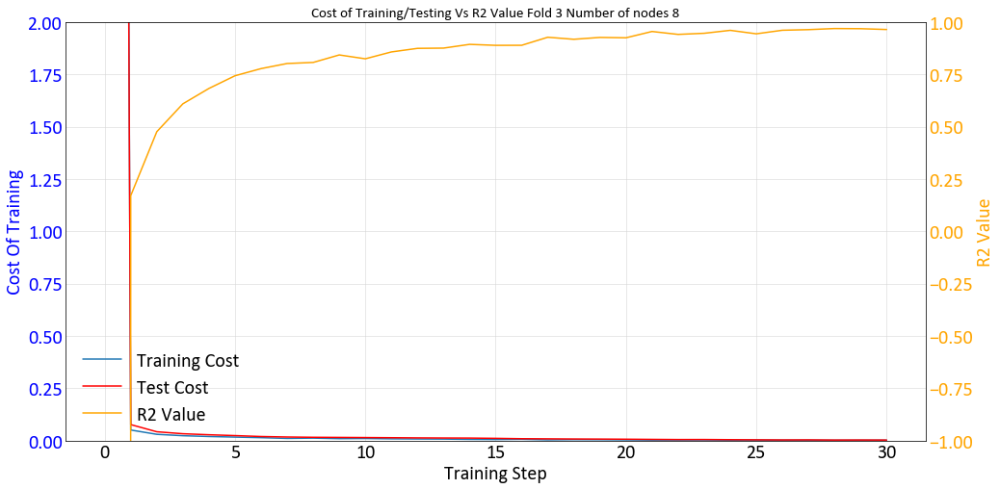

Working on Node 10 fold 3 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpd4qghy8w', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D89B7C898>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.007564345840364695
Cost_test : 0.014178522
R^2:0.8712965846061707
Epoch: 1200/5000 err = 0.00795711949467659
Cost_test : 0.013432042
R^2:0.8753841519355774
Epoch: 1300/5000 err = 0.006885005859658122
Cost_test : 0.012059882
R^2:0.8904669284820557
Epoch: 1400/5000 err = 0.006740242475643754
Cost_test : 0.011965947
R^2:0.8765363693237305
Epoch: 1500/5000 err = 0.006174401147291064
Cost_test : 0.01132222
R^2:0.8917743563652039
Epoch: 1600/5000 err = 0.006681183818727732
Cost_test : 0.010224034
R^2:0.8787754774093628
Epoch: 1700/5000 err = 0.00429625203832984
Cost_test : 0.00983958
R^2:0.9229810833930969
Epoch: 1800/5000 err = 0.005560083081945777
Cost_test : 0.00931552
R^2:0.9030526578426361
Epoch: 1900/5000 err = 0.005164098925888538
Cost_test : 0.008455952
R^2:0.9188979268074036
Epoch: 2000/5000 err = 0.004685666644945741
Cost_test : 0.007984817
R^2:0.9277841448783875
Epoch: 2100/5000 err = 0.004557140404358506
Cost_test : 0.0072555942
R^2:0.9244955778121948
Epo

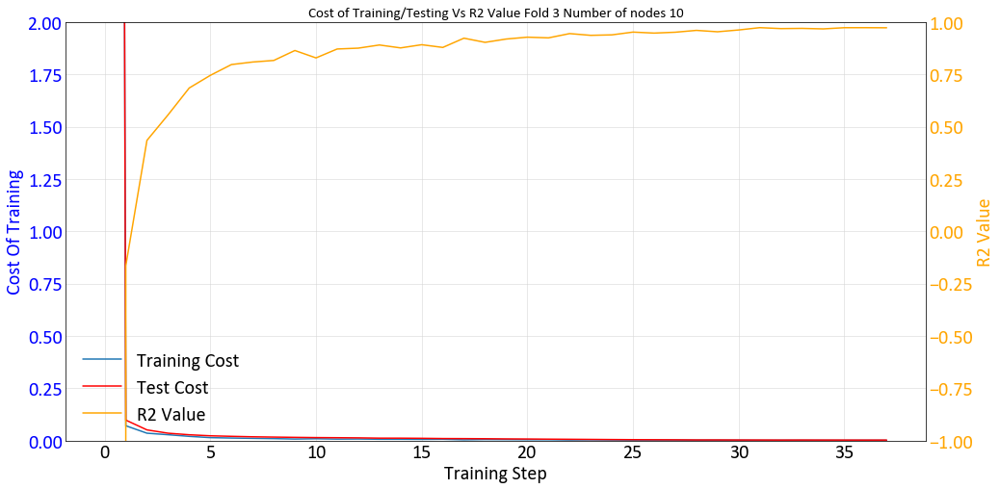

Working on Node 12 fold 3 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp9l8ti9t2', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D8221BCC0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

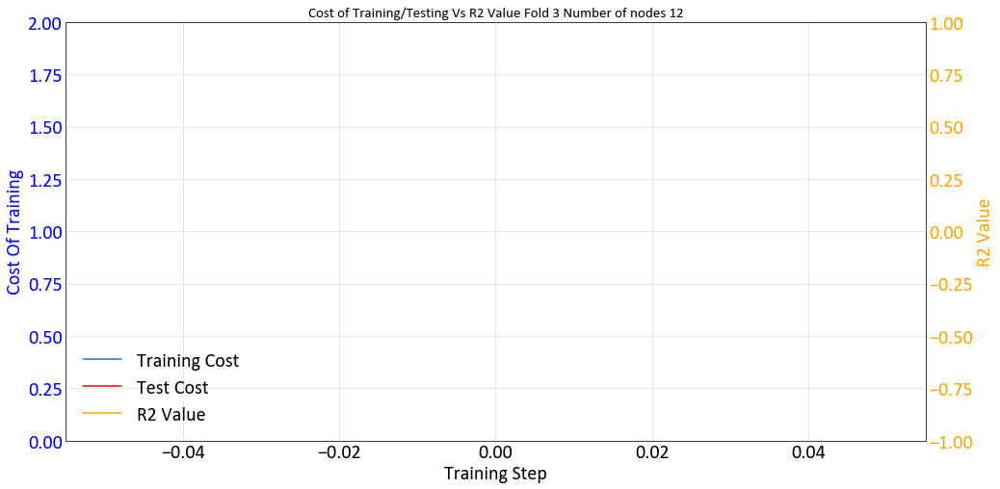

0.6061
1.905
4
Working on Node 5 fold 4 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpp9zxg35_', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D175D2320>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling

Epoch: 1100/5000 err = 0.007444080663844943
Cost_test : 0.012284808
R^2:0.8733883798122406
Epoch: 1200/5000 err = 0.007218734594061971
Cost_test : 0.011717541
R^2:0.8885859549045563
Epoch: 1300/5000 err = 0.007854377385228872
Cost_test : 0.011113559
R^2:0.8689461946487427
Epoch: 1400/5000 err = 0.008779944851994514
Cost_test : 0.011011575
R^2:0.8655128180980682
Epoch: 1500/5000 err = 0.006162359844893217
Cost_test : 0.01111681
R^2:0.9039864242076874
Epoch: 1600/5000 err = 0.007092014653608203
Cost_test : 0.011046763
R^2:0.8937110006809235
Epoch: 1700/5000 err = 0.006358293816447258
Cost_test : 0.010398995
R^2:0.8936132192611694
Epoch: 1800/5000 err = 0.006256959401071072
Cost_test : 0.0104518905
R^2:0.9027523994445801
Epoch: 1900/5000 err = 0.00540829892270267
Cost_test : 0.010307544
R^2:0.9172756373882294
Epoch: 2000/5000 err = 0.0057337230537086725
Cost_test : 0.010333053
R^2:0.8999873101711273
Epoch: 2100/5000 err = 0.0049204532988369465
Cost_test : 0.009278641
R^2:0.914701700210571

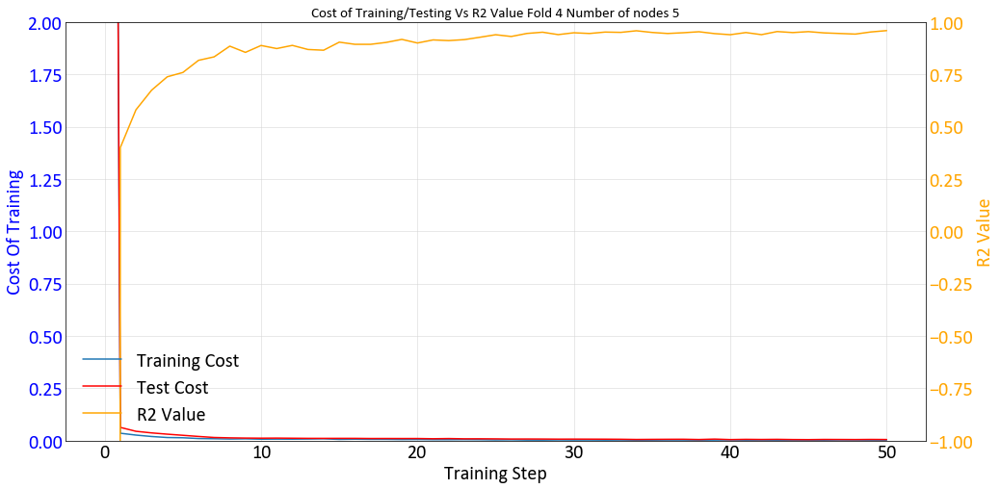

Working on Node 8 fold 4 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpnqr61gjl', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D8AF59198>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

Epoch: 1100/5000 err = 0.00849681906402111
Cost_test : 0.021248663
R^2:0.8619757294654846
Epoch: 1200/5000 err = 0.00842859735712409
Cost_test : 0.020034475
R^2:0.8587930202484131
Epoch: 1300/5000 err = 0.00900740036740899
Cost_test : 0.018932994
R^2:0.8527724742889404
Epoch: 1400/5000 err = 0.008121905848383904
Cost_test : 0.017302454
R^2:0.868760496377945
Epoch: 1500/5000 err = 0.006491098087280989
Cost_test : 0.016057681
R^2:0.896192729473114
Epoch: 1600/5000 err = 0.0060676035936921835
Cost_test : 0.013698984
R^2:0.9041753709316254
Epoch: 1700/5000 err = 0.006292047444730997
Cost_test : 0.013025994
R^2:0.8915730714797974
Epoch: 1800/5000 err = 0.004978799261152744
Cost_test : 0.011487697
R^2:0.9228154122829437
Epoch: 1900/5000 err = 0.005819373298436403
Cost_test : 0.01057952
R^2:0.8971562087535858
Epoch: 2000/5000 err = 0.004521152237430215
Cost_test : 0.010030929
R^2:0.9219311773777008
Epoch: 2100/5000 err = 0.0039529415080323815
Cost_test : 0.009661901
R^2:0.9271412491798401
Epo

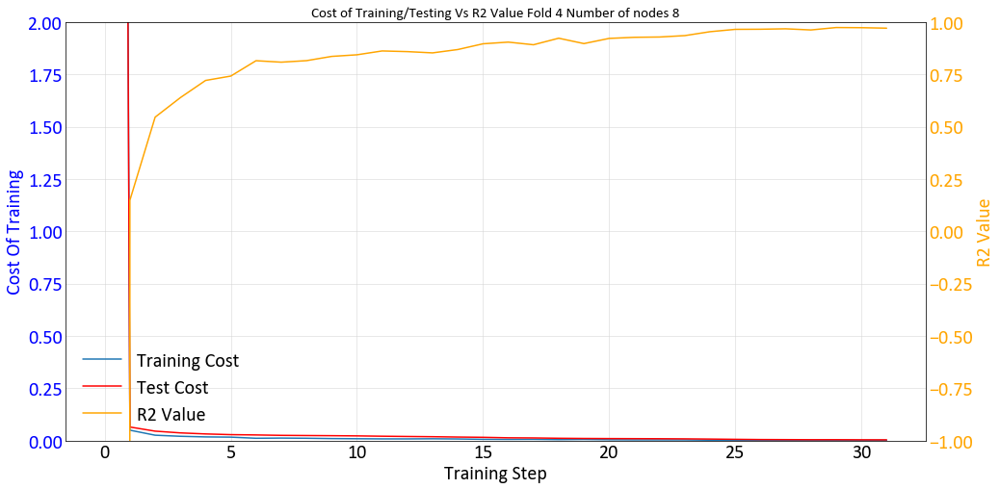

Working on Node 10 fold 4 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpfh4nak3_', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D1B0263C8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.010140652302652597
Cost_test : 0.024221826
R^2:0.8229385614395142
Epoch: 1200/5000 err = 0.010770335793495178
Cost_test : 0.023085617
R^2:0.8058897852897644
Epoch: 1300/5000 err = 0.008400239516049623
Cost_test : 0.022101076
R^2:0.8593372702598572
Epoch: 1400/5000 err = 0.00855084415525198
Cost_test : 0.02033337
R^2:0.8403688371181488
Epoch: 1500/5000 err = 0.008424344938248396
Cost_test : 0.018907534
R^2:0.8662747442722321
Epoch: 1600/5000 err = 0.00724860280752182
Cost_test : 0.017219212
R^2:0.8794477880001068
Epoch: 1700/5000 err = 0.006428173277527094
Cost_test : 0.015140702
R^2:0.8989167511463165
Epoch: 1800/5000 err = 0.0073477274272590876
Cost_test : 0.013257225
R^2:0.8746540546417236
Epoch: 1900/5000 err = 0.00457776291295886
Cost_test : 0.012261389
R^2:0.9270254671573639
Epoch: 2000/5000 err = 0.00377466285135597
Cost_test : 0.0109853195
R^2:0.9281425774097443
Epoch: 2100/5000 err = 0.004120587953366339
Cost_test : 0.010009965
R^2:0.9191516935825348
Ep

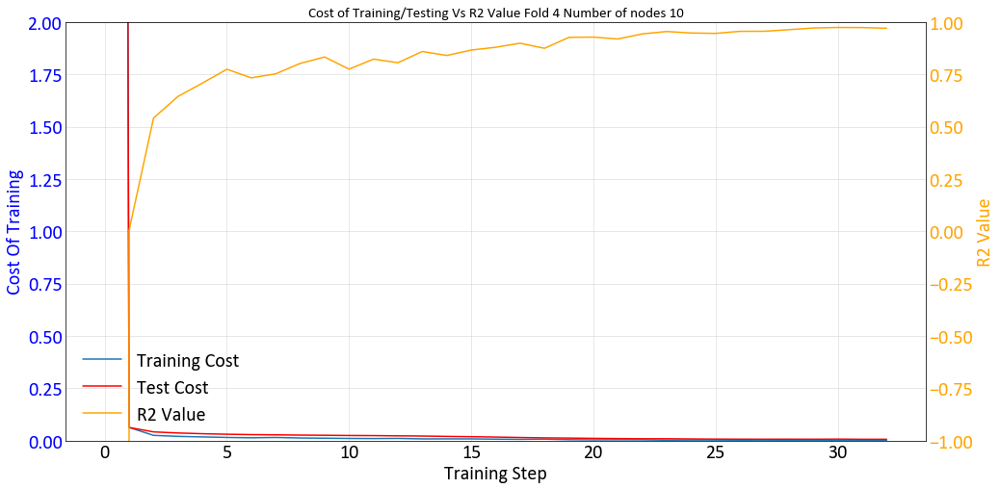

Working on Node 12 fold 4 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmphxul0dji', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D821464E0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.008595038671046495
Cost_test : 0.017870506
R^2:0.8658909797668457
Epoch: 1200/5000 err = 0.006634499877691269
Cost_test : 0.016372146
R^2:0.8884908258914948
Epoch: 1300/5000 err = 0.004857125226408243
Cost_test : 0.0149958385
R^2:0.9151792824268341
Epoch: 1400/5000 err = 0.006383712403476238
Cost_test : 0.013398294
R^2:0.8871359527111053
Epoch: 1500/5000 err = 0.005033370107412338
Cost_test : 0.012739412
R^2:0.9224341809749603
Epoch: 1600/5000 err = 0.004507027100771666
Cost_test : 0.011270807
R^2:0.9282203614711761
Epoch: 1700/5000 err = 0.004579885862767696
Cost_test : 0.010209947
R^2:0.9155579805374146
Epoch: 1800/5000 err = 0.004522337112575769
Cost_test : 0.009062824
R^2:0.9282395541667938
Epoch: 1900/5000 err = 0.0036736757028847933
Cost_test : 0.007854906
R^2:0.9392924010753632
Epoch: 2000/5000 err = 0.003558956435881555
Cost_test : 0.007466405
R^2:0.9381355047225952
Epoch: 2100/5000 err = 0.0038210427155718207
Cost_test : 0.006731994
R^2:0.9318342506885

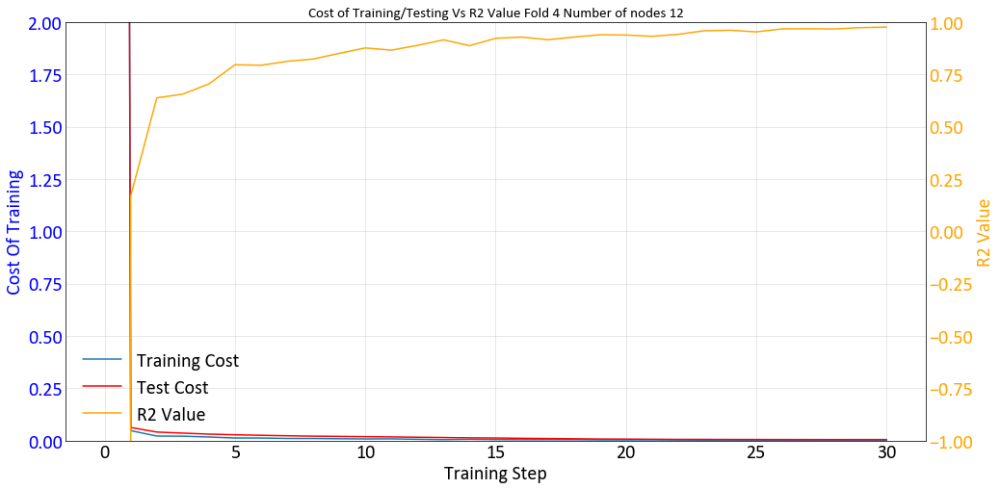

0.613
1.8792
5
Working on Node 5 fold 5 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpcwqy6qlx', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D1BAF7CC0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling

Epoch: 1100/5000 err = 0.005850909743458033
Cost_test : 0.009607549
R^2:0.9082419574260712
Epoch: 1200/5000 err = 0.006851250072941184
Cost_test : 0.01011255
R^2:0.8808363378047943
Epoch: 1300/5000 err = 0.006178440293297172
Cost_test : 0.00935231
R^2:0.8858333230018616
Epoch: 1400/5000 err = 0.0058031894732266665
Cost_test : 0.00922252
R^2:0.8966149091720581
Epoch: 1500/5000 err = 0.0058641822542995214
Cost_test : 0.008823389
R^2:0.887910008430481
Epoch: 1600/5000 err = 0.005009277490898967
Cost_test : 0.0086353
R^2:0.9061343669891357
Epoch: 1700/5000 err = 0.0053708599880337715
Cost_test : 0.0084122075
R^2:0.8995985090732574
Epoch: 1800/5000 err = 0.0043506205547600985
Cost_test : 0.008716614
R^2:0.9234954118728638
Epoch: 1900/5000 err = 0.004755592904984951
Cost_test : 0.00857226
R^2:0.9127932190895081
Epoch: 2000/5000 err = 0.005526954308152199
Cost_test : 0.008226861
R^2:0.893846184015274
Epoch: 2100/5000 err = 0.004429310094565153
Cost_test : 0.008239611
R^2:0.9093413949012756
Ep

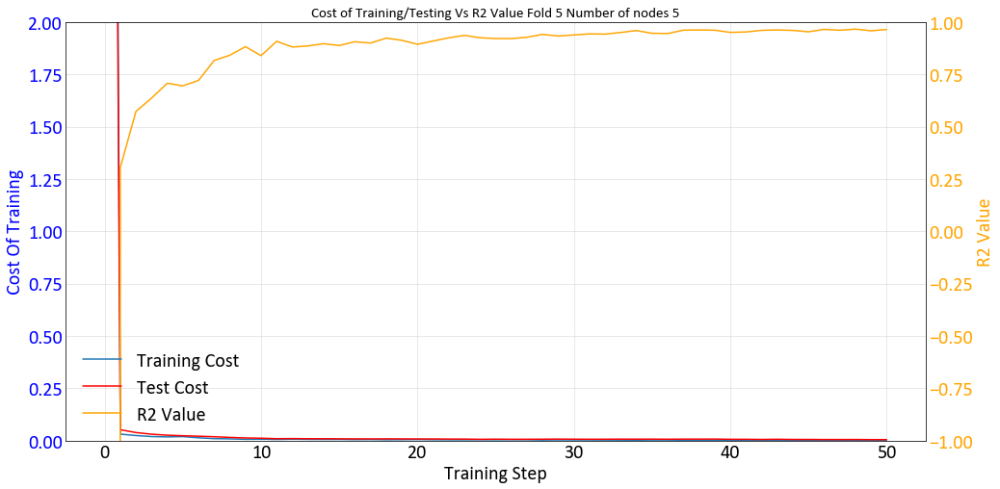

Working on Node 8 fold 5 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmprdtj6vxj', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D89C5C668>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

Epoch: 1100/5000 err = 0.007495781173929572
Cost_test : 0.013529829
R^2:0.8654061257839203
Epoch: 1200/5000 err = 0.007843723986297846
Cost_test : 0.0147234015
R^2:0.8625842034816742
Epoch: 1300/5000 err = 0.0059583967085927725
Cost_test : 0.014817659
R^2:0.9026217460632324
Epoch: 1400/5000 err = 0.006179783958941698
Cost_test : 0.014225729
R^2:0.8845842778682709
Epoch: 1500/5000 err = 0.006550556980073452
Cost_test : 0.01512159
R^2:0.8960082232952118
Epoch: 1600/5000 err = 0.004963197512552142
Cost_test : 0.013870856
R^2:0.9150762259960175
Epoch: 1700/5000 err = 0.0054800985381007195
Cost_test : 0.0135889035
R^2:0.8813489973545074
Epoch: 1800/5000 err = 0.004944647196680307
Cost_test : 0.0132779395
R^2:0.908844381570816
Epoch: 1900/5000 err = 0.005117337219417095
Cost_test : 0.012510382
R^2:0.8971788883209229
Epoch: 2000/5000 err = 0.003928678575903177
Cost_test : 0.011813825
R^2:0.9278813302516937
Epoch: 2100/5000 err = 0.004028261639177799
Cost_test : 0.011622619
R^2:0.9318706095218

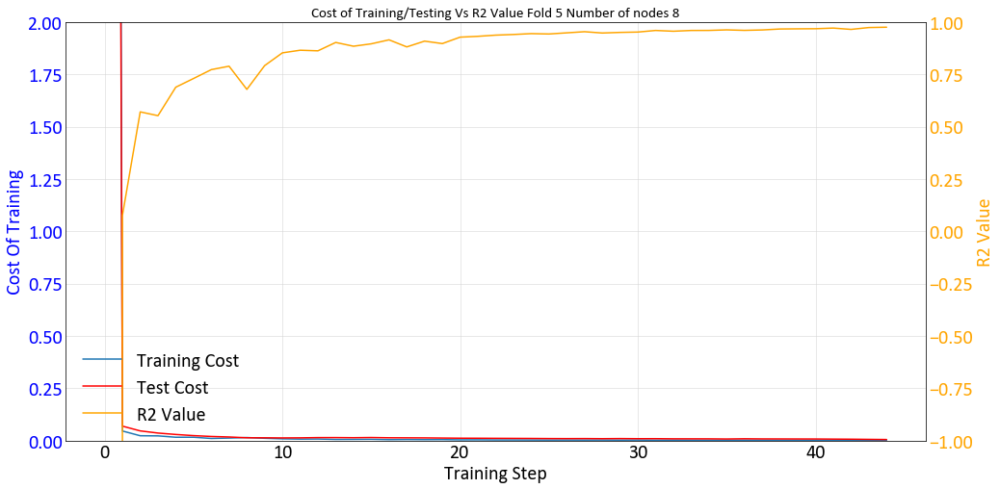

Working on Node 10 fold 5 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpl0ut7pbw', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D1BB42AC8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.008575452025979757
Cost_test : 0.020862462
R^2:0.8151132762432098
Epoch: 1200/5000 err = 0.008009535958990455
Cost_test : 0.01971178
R^2:0.868497908115387
Epoch: 1300/5000 err = 0.009630301967263222
Cost_test : 0.019546429
R^2:0.836727112531662
Epoch: 1400/5000 err = 0.006892116041854024
Cost_test : 0.018672215
R^2:0.863181471824646
Epoch: 1500/5000 err = 0.008742418140172958
Cost_test : 0.018403837
R^2:0.8513080775737762
Epoch: 1600/5000 err = 0.005559040233492851
Cost_test : 0.01840349
R^2:0.9020234644412994
Epoch: 1700/5000 err = 0.006458957446739078
Cost_test : 0.017262155
R^2:0.8929715156555176
Epoch: 1800/5000 err = 0.0064413719810545444
Cost_test : 0.01563003
R^2:0.8874009847640991
Epoch: 1900/5000 err = 0.005859085591509938
Cost_test : 0.014818732
R^2:0.8917997181415558
Epoch: 2000/5000 err = 0.004623661749064922
Cost_test : 0.014444524
R^2:0.9133956730365753
Epoch: 2100/5000 err = 0.004602506756782532
Cost_test : 0.013746434
R^2:0.9215919971466064
Epoc

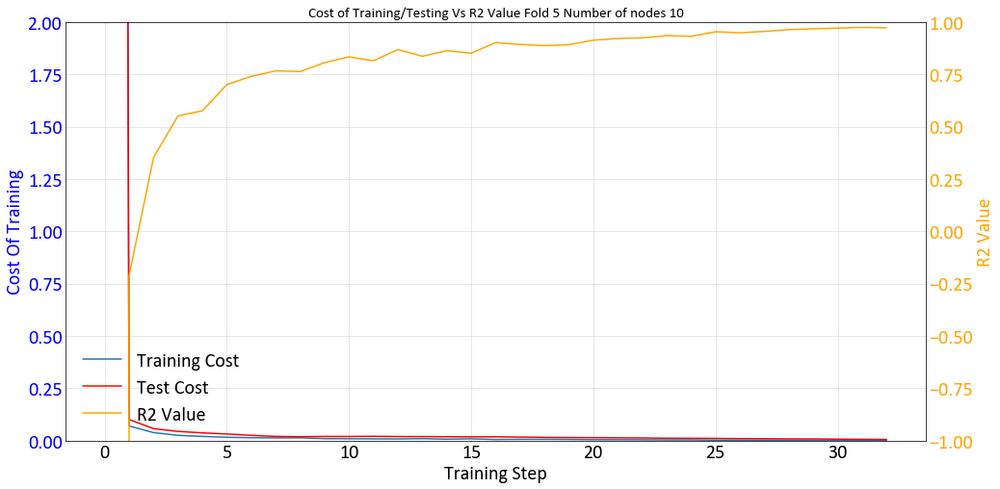

Working on Node 12 fold 5 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmppkf3vx8m', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D89C9AD68>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.007255366072058678
Cost_test : 0.010991425
R^2:0.8672430515289307
Epoch: 1200/5000 err = 0.0073852448258548975
Cost_test : 0.010628702
R^2:0.86453777551651
Epoch: 1300/5000 err = 0.005945934914052486
Cost_test : 0.0107197
R^2:0.9029084742069244
Epoch: 1400/5000 err = 0.004928112728521228
Cost_test : 0.010558094
R^2:0.9075872898101807
Epoch: 1500/5000 err = 0.005825455533340573
Cost_test : 0.010302843
R^2:0.9000410437583923
Epoch: 1600/5000 err = 0.004238135647028685
Cost_test : 0.009103865
R^2:0.9171299934387207
Epoch: 1700/5000 err = 0.004115728894248605
Cost_test : 0.009821098
R^2:0.9275552332401276
Epoch: 1800/5000 err = 0.0038588023744523525
Cost_test : 0.009332599
R^2:0.9311507940292358
Epoch: 1900/5000 err = 0.004162001772783697
Cost_test : 0.009495957
R^2:0.9166916012763977
Epoch: 2000/5000 err = 0.003513515810482204
Cost_test : 0.008751615
R^2:0.9389087557792664
Epoch: 2100/5000 err = 0.003937075496651232
Cost_test : 0.008780306
R^2:0.9300306439399719
E

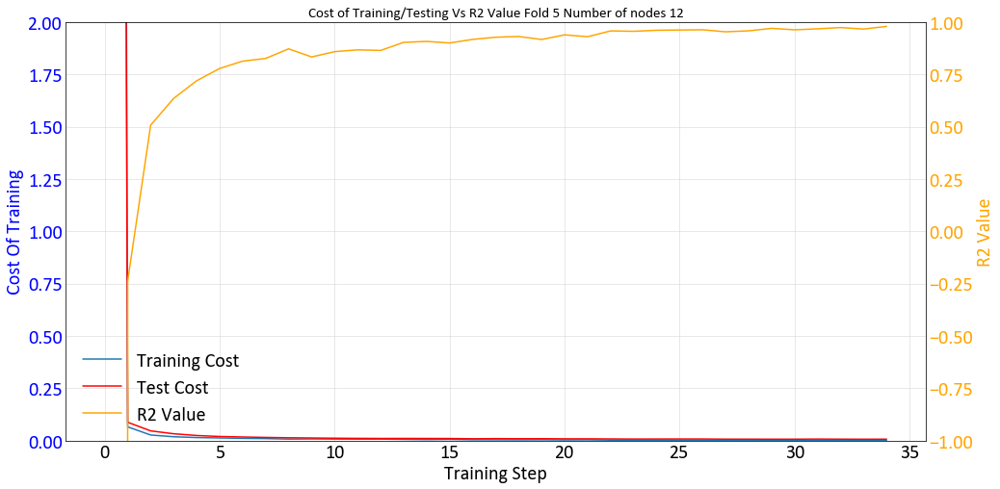

0.6196
1.8571
6
Working on Node 5 fold 6 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp28d6a_9t', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D1B5C3B00>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done callin

Epoch: 1100/5000 err = 0.008153643691912293
Cost_test : 0.012859724
R^2:0.83671435713768
Epoch: 1200/5000 err = 0.009119291789829731
Cost_test : 0.011903757
R^2:0.8392612338066101
Epoch: 1300/5000 err = 0.008426613174378872
Cost_test : 0.010899776
R^2:0.8458240032196045
Epoch: 1400/5000 err = 0.007713138358667493
Cost_test : 0.010057842
R^2:0.8607264161109924
Epoch: 1500/5000 err = 0.0067686166148632765
Cost_test : 0.01002234
R^2:0.8699402809143066
Epoch: 1600/5000 err = 0.0077777705155313015
Cost_test : 0.0097109685
R^2:0.8619710505008698
Epoch: 1700/5000 err = 0.006051716860383749
Cost_test : 0.009850646
R^2:0.8926022946834564
Epoch: 1800/5000 err = 0.008185171522200108
Cost_test : 0.009456967
R^2:0.8678862750530243
Epoch: 1900/5000 err = 0.006830885075032711
Cost_test : 0.009497759
R^2:0.8939155340194702
Epoch: 2000/5000 err = 0.006454149493947625
Cost_test : 0.0092216795
R^2:0.8713213503360748
Epoch: 2100/5000 err = 0.005867763655260205
Cost_test : 0.009460498
R^2:0.873648703098297

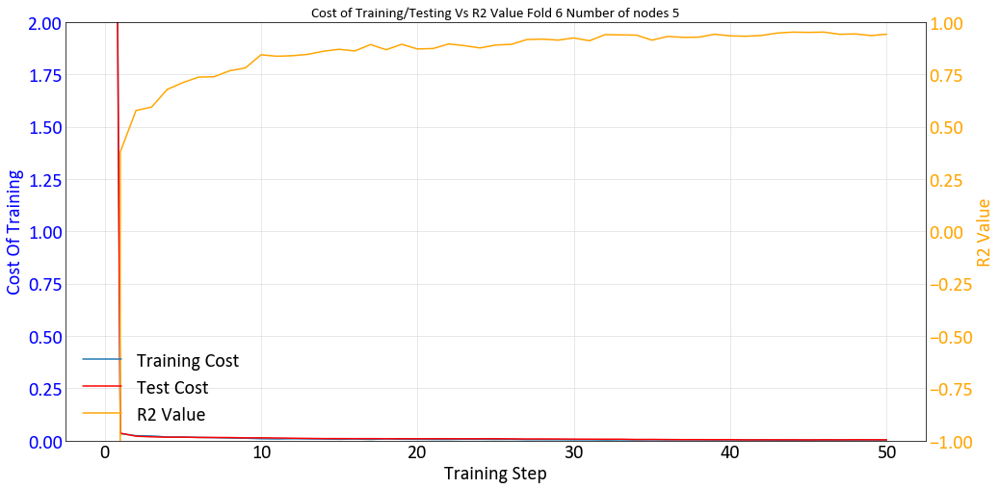

Working on Node 8 fold 6 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpgsuf05gr', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D1B5C3DD8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

Epoch: 1100/5000 err = 0.006763272685930133
Cost_test : 0.005753325
R^2:0.8660279810428619
Epoch: 1200/5000 err = 0.004724327474832535
Cost_test : 0.005266905
R^2:0.9080438613891602
Epoch: 1300/5000 err = 0.004435533657670021
Cost_test : 0.0049592503
R^2:0.9274716377258301
Epoch: 1400/5000 err = 0.003935814136639237
Cost_test : 0.0047344156
R^2:0.9227338433265686
Epoch: 1500/5000 err = 0.004598851082846522
Cost_test : 0.0045918166
R^2:0.9183168411254883
Epoch: 1600/5000 err = 0.0038212984800338745
Cost_test : 0.004707456
R^2:0.9287354052066803
Epoch: 1700/5000 err = 0.003586149890907109
Cost_test : 0.004705166
R^2:0.9335416257381439
Epoch: 1800/5000 err = 0.003232158487662673
Cost_test : 0.004689204
R^2:0.9443084001541138
Epoch: 1900/5000 err = 0.0035590350162237883
Cost_test : 0.0046375813
R^2:0.9371004700660706
Epoch: 2000/5000 err = 0.0032888101413846016
Cost_test : 0.0046254313
R^2:0.9414697289466858
Epoch: 2100/5000 err = 0.0028070727130398154
Cost_test : 0.0045240223
R^2:0.946982

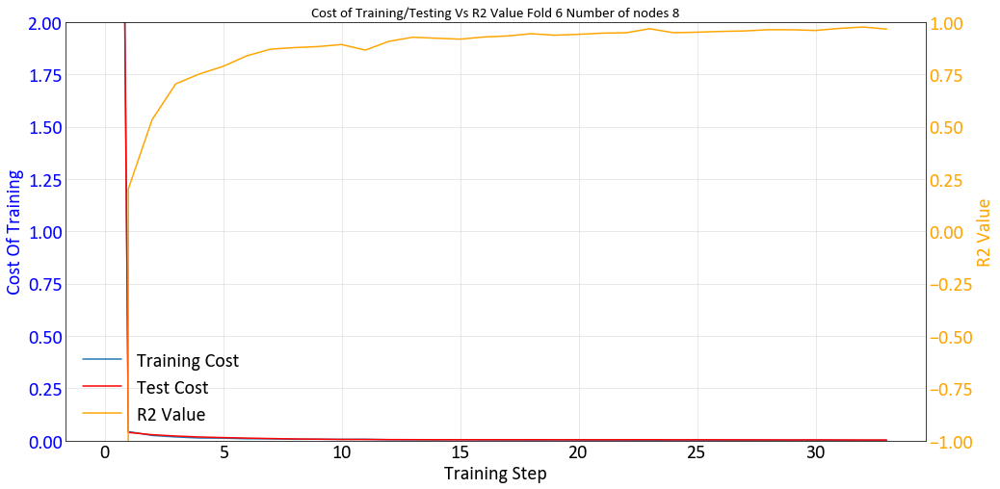

Working on Node 10 fold 6 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp16a6u5vw', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D8AFA8588>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0031955114100128412
Cost_test : 0.0049658134
R^2:0.9420892596244812
Epoch: 1200/5000 err = 0.0032535602804273367
Cost_test : 0.004154079
R^2:0.9363977313041687
Epoch: 1300/5000 err = 0.002859004307538271
Cost_test : 0.0040787403
R^2:0.9497050344944
Epoch: 1400/5000 err = 0.002677620970644057
Cost_test : 0.0038810004
R^2:0.9520629942417145
Epoch: 1500/5000 err = 0.002602612250484526
Cost_test : 0.0034342355
R^2:0.954990565776825
Epoch: 1600/5000 err = 0.0025192430475726724
Cost_test : 0.0034712062
R^2:0.9598395228385925
Epoch: 1700/5000 err = 0.0018278451170772314
Cost_test : 0.0032258122
R^2:0.9650010764598846
Epoch: 1800/5000 err = 0.00197912281146273
Cost_test : 0.0031606886
R^2:0.9642177522182465
Epoch: 1900/5000 err = 0.002189038903452456
Cost_test : 0.0030550712
R^2:0.9584718346595764
Epoch: 2000/5000 err = 0.0017303923959843814
Cost_test : 0.0028832597
R^2:0.9684898853302002
Epoch: 2100/5000 err = 0.0016457445453852415
Cost_test : 0.0028338134
R^2:0.97194

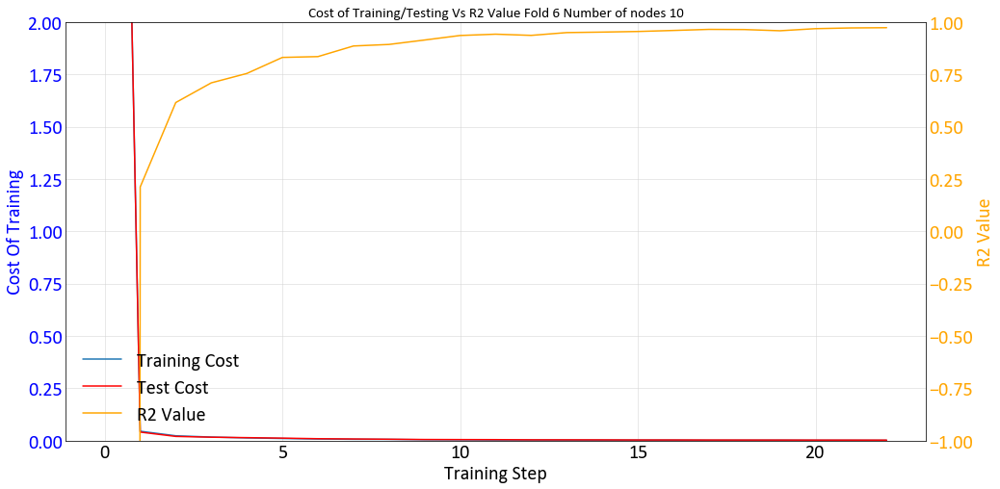

Working on Node 12 fold 6 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp0t6ycgsz', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D8AF90A90>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.006799077615141869
Cost_test : 0.0075023347
R^2:0.8745485842227936
Epoch: 1200/5000 err = 0.006336565827950835
Cost_test : 0.0071491576
R^2:0.8837319016456604
Epoch: 1300/5000 err = 0.006550571182742715
Cost_test : 0.006329258
R^2:0.8655173182487488
Epoch: 1400/5000 err = 0.006018670741468668
Cost_test : 0.0060612485
R^2:0.8842446208000183
Epoch: 1500/5000 err = 0.004661016399040818
Cost_test : 0.005542598
R^2:0.9110782444477081
Epoch: 1600/5000 err = 0.005114358151331544
Cost_test : 0.0051658396
R^2:0.9132646322250366
Epoch: 1700/5000 err = 0.005059123737737536
Cost_test : 0.004297893
R^2:0.9094150066375732
Epoch: 1800/5000 err = 0.004496258916333318
Cost_test : 0.003593269
R^2:0.9111223816871643
Epoch: 1900/5000 err = 0.003503356478177011
Cost_test : 0.003149313
R^2:0.931525319814682
Epoch: 2000/5000 err = 0.003352719941176474
Cost_test : 0.0028151
R^2:0.925704151391983
Epoch: 2100/5000 err = 0.0036257277242839336
Cost_test : 0.0026818784
R^2:0.93313547968864

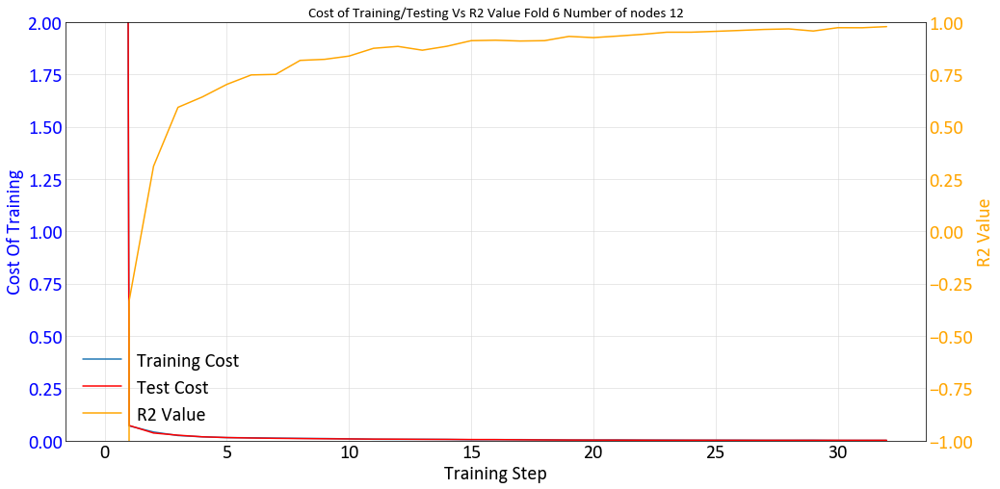

0.6287
1.8126
7
Working on Node 5 fold 7 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpigkwok3y', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D89C98278>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done callin

Epoch: 1100/5000 err = 0.00668849004432559
Cost_test : 0.011460311
R^2:0.8715653419494629
Epoch: 1200/5000 err = 0.007009189110249281
Cost_test : 0.011150171
R^2:0.8657942116260529
Epoch: 1300/5000 err = 0.008395049488171935
Cost_test : 0.011219688
R^2:0.835112452507019
Epoch: 1400/5000 err = 0.006968882866203785
Cost_test : 0.011256595
R^2:0.8638249933719635
Epoch: 1500/5000 err = 0.007595654111355543
Cost_test : 0.010687589
R^2:0.8654508888721466
Epoch: 1600/5000 err = 0.008181098382920027
Cost_test : 0.010553951
R^2:0.8303336203098297
Epoch: 1700/5000 err = 0.006449106615036726
Cost_test : 0.010581827
R^2:0.8782597780227661
Epoch: 1800/5000 err = 0.007734150858595967
Cost_test : 0.010068217
R^2:0.858240157365799
Epoch: 1900/5000 err = 0.006845393450930715
Cost_test : 0.009653791
R^2:0.8793482780456543
Epoch: 2000/5000 err = 0.005554205039516091
Cost_test : 0.009176407
R^2:0.8859333395957947
Epoch: 2100/5000 err = 0.006292587844654918
Cost_test : 0.009235622
R^2:0.8810071051120758
Ep

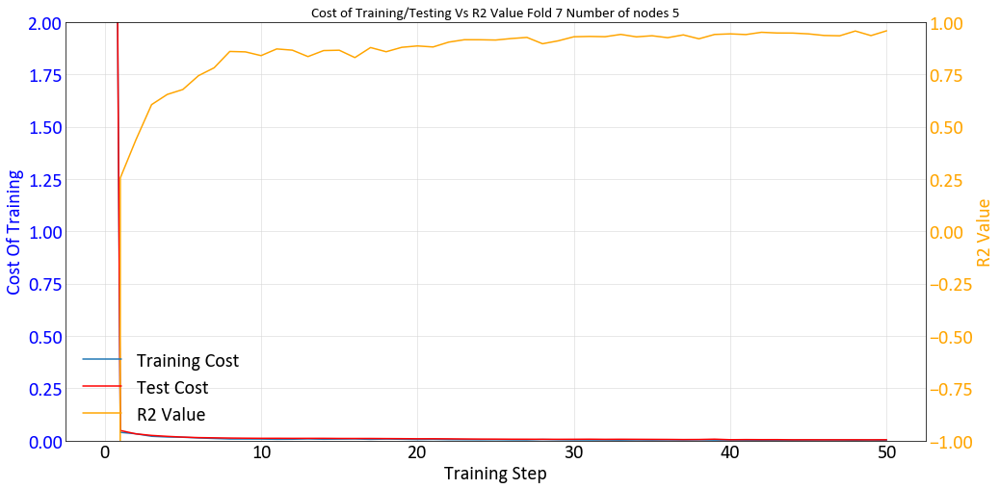

Working on Node 8 fold 7 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpzvb4_1um', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D8AF89240>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

Epoch: 1100/5000 err = 0.00787527859210968
Cost_test : 0.012640766
R^2:0.8529152274131775
Epoch: 1200/5000 err = 0.007479666266590357
Cost_test : 0.011705939
R^2:0.8645268678665161
Epoch: 1300/5000 err = 0.00656699133105576
Cost_test : 0.0109086055
R^2:0.8799082934856415
Epoch: 1400/5000 err = 0.00611538952216506
Cost_test : 0.010102446
R^2:0.8837157785892487
Epoch: 1500/5000 err = 0.005212225951254368
Cost_test : 0.009231188
R^2:0.896435409784317
Epoch: 1600/5000 err = 0.006690919864922762
Cost_test : 0.008620946
R^2:0.8741245865821838
Epoch: 1700/5000 err = 0.00500263855792582
Cost_test : 0.008102013
R^2:0.9084964394569397
Epoch: 1800/5000 err = 0.0047475534956902266
Cost_test : 0.007540969
R^2:0.9042540192604065
Epoch: 1900/5000 err = 0.005439408123493195
Cost_test : 0.007390843
R^2:0.8999791443347931
Epoch: 2000/5000 err = 0.004265861352905631
Cost_test : 0.006751675
R^2:0.9103131294250488
Epoch: 2100/5000 err = 0.00376207719091326
Cost_test : 0.006233543
R^2:0.9210148751735687
Epo

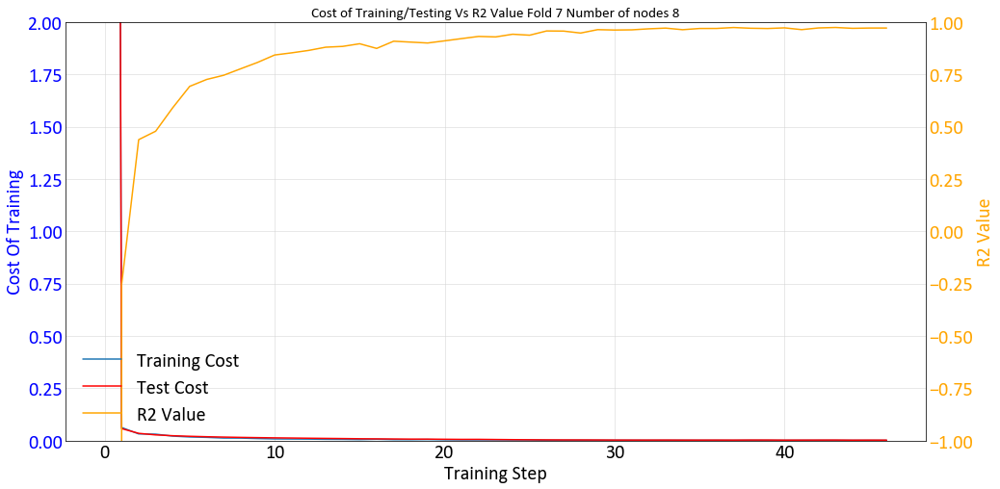

Working on Node 10 fold 7 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmprjexl2dg', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D8C9776A0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.007052644155919552
Cost_test : 0.011197913
R^2:0.8694551885128021
Epoch: 1200/5000 err = 0.006805001059547067
Cost_test : 0.009723179
R^2:0.872915655374527
Epoch: 1300/5000 err = 0.005243320018053055
Cost_test : 0.009280722
R^2:0.8911582827568054
Epoch: 1400/5000 err = 0.005892421817407012
Cost_test : 0.008450782
R^2:0.894062727689743
Epoch: 1500/5000 err = 0.005230366950854659
Cost_test : 0.0076487716
R^2:0.911042720079422
Epoch: 1600/5000 err = 0.004356534918770194
Cost_test : 0.006921787
R^2:0.919761598110199
Epoch: 1700/5000 err = 0.004325842950493097
Cost_test : 0.0062608295
R^2:0.9297920763492584
Epoch: 1800/5000 err = 0.004264205694198608
Cost_test : 0.0058067725
R^2:0.9138493537902832
Epoch: 1900/5000 err = 0.0036000143736600876
Cost_test : 0.005498064
R^2:0.9329946339130402
Epoch: 2000/5000 err = 0.003996430663391948
Cost_test : 0.005094462
R^2:0.9252091944217682
Epoch: 2100/5000 err = 0.003107203636318445
Cost_test : 0.0047385185
R^2:0.935797631740570

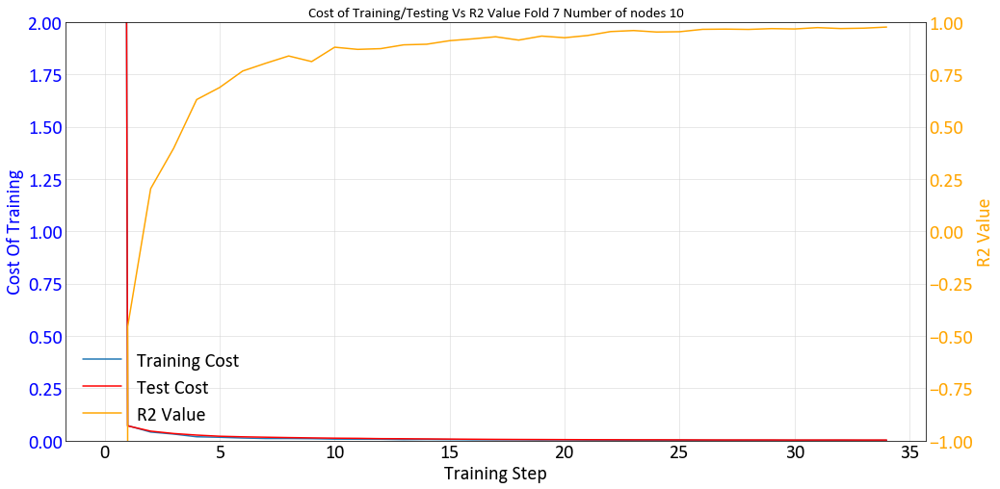

Working on Node 12 fold 7 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpnvlzfnd2', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D1DE50DA0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.004566544201225042
Cost_test : 0.0071253986
R^2:0.9147482514381409
Epoch: 1200/5000 err = 0.0038344213971868157
Cost_test : 0.006723911
R^2:0.9278720617294312
Epoch: 1300/5000 err = 0.004047564114443958
Cost_test : 0.006237826
R^2:0.9202344119548798
Epoch: 1400/5000 err = 0.0036247362149879336
Cost_test : 0.005819153
R^2:0.9312084913253784
Epoch: 1500/5000 err = 0.002985894330777228
Cost_test : 0.0057513514
R^2:0.933514416217804
Epoch: 1600/5000 err = 0.0026506431167945266
Cost_test : 0.0054867696
R^2:0.9504044950008392
Epoch: 1700/5000 err = 0.0030275420285761356
Cost_test : 0.005126177
R^2:0.9451482594013214
Epoch: 1800/5000 err = 0.002665499225258827
Cost_test : 0.004803986
R^2:0.9463653564453125
Epoch: 1900/5000 err = 0.002724572434090078
Cost_test : 0.004815944
R^2:0.9498289227485657
Epoch: 2000/5000 err = 0.0021221485221758485
Cost_test : 0.004525418
R^2:0.9621185958385468
Epoch: 2100/5000 err = 0.001837685820646584
Cost_test : 0.0044677276
R^2:0.96502470

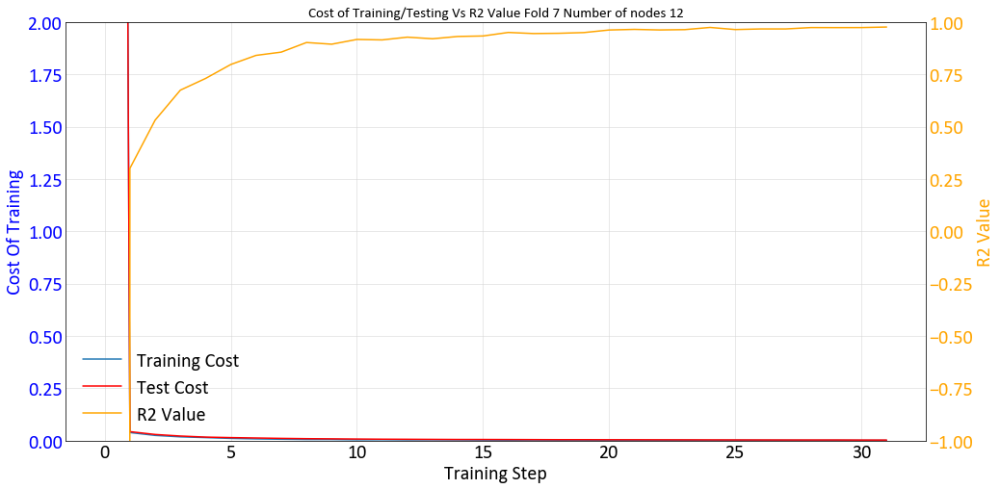

0.6359
1.7653
8
Working on Node 5 fold 8 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpxuo5j10f', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D821564E0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done callin

Epoch: 1100/5000 err = 0.0074156043119728565
Cost_test : 0.008939249
R^2:0.8793133497238159
Epoch: 1200/5000 err = 0.00736612593755126
Cost_test : 0.008608502
R^2:0.8660944402217865
Epoch: 1300/5000 err = 0.007204344030469656
Cost_test : 0.008473455
R^2:0.8718544244766235
Epoch: 1400/5000 err = 0.006765834987163544
Cost_test : 0.008282333
R^2:0.8816774785518646
Epoch: 1500/5000 err = 0.006440303521230817
Cost_test : 0.008403166
R^2:0.8823891282081604
Epoch: 1600/5000 err = 0.005413617705926299
Cost_test : 0.008567725
R^2:0.9074932038784027
Epoch: 1700/5000 err = 0.006316190119832754
Cost_test : 0.008099779
R^2:0.8819483816623688
Epoch: 1800/5000 err = 0.00545507250353694
Cost_test : 0.008690547
R^2:0.9027235209941864
Epoch: 1900/5000 err = 0.004701968282461166
Cost_test : 0.008555063
R^2:0.9105979204177856
Epoch: 2000/5000 err = 0.005222781095653772
Cost_test : 0.00870823
R^2:0.9126443266868591
Epoch: 2100/5000 err = 0.003934647422283888
Cost_test : 0.007857261
R^2:0.9346044957637787
E

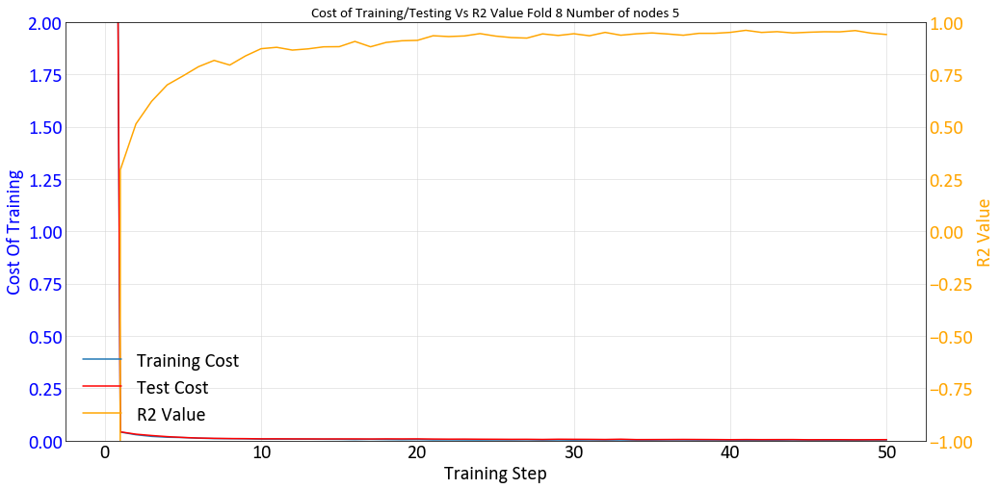

Working on Node 8 fold 8 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpk2btxg3u', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D81F02C88>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

Epoch: 1100/5000 err = 0.005834316834807396
Cost_test : 0.00975676
R^2:0.886433333158493
Epoch: 1200/5000 err = 0.00512828747741878
Cost_test : 0.009572694
R^2:0.9141178131103516
Epoch: 1300/5000 err = 0.005784241016954184
Cost_test : 0.009293344
R^2:0.8884109556674957
Epoch: 1400/5000 err = 0.0048097067046910524
Cost_test : 0.008899754
R^2:0.9130993187427521
Epoch: 1500/5000 err = 0.0054278913885355
Cost_test : 0.008664628
R^2:0.9108391404151917
Epoch: 1600/5000 err = 0.004147884203121066
Cost_test : 0.008251069
R^2:0.9251616597175598
Epoch: 1700/5000 err = 0.003404462826438248
Cost_test : 0.007852887
R^2:0.9428127408027649
Epoch: 1800/5000 err = 0.003383637056685984
Cost_test : 0.0070610517
R^2:0.9422253668308258
Epoch: 1900/5000 err = 0.0035505606792867184
Cost_test : 0.0065620705
R^2:0.9384570717811584
Epoch: 2000/5000 err = 0.0038152228808030486
Cost_test : 0.0058085714
R^2:0.9369080066680908
Epoch: 2100/5000 err = 0.0028118984773755074
Cost_test : 0.0054613897
R^2:0.9485599994659

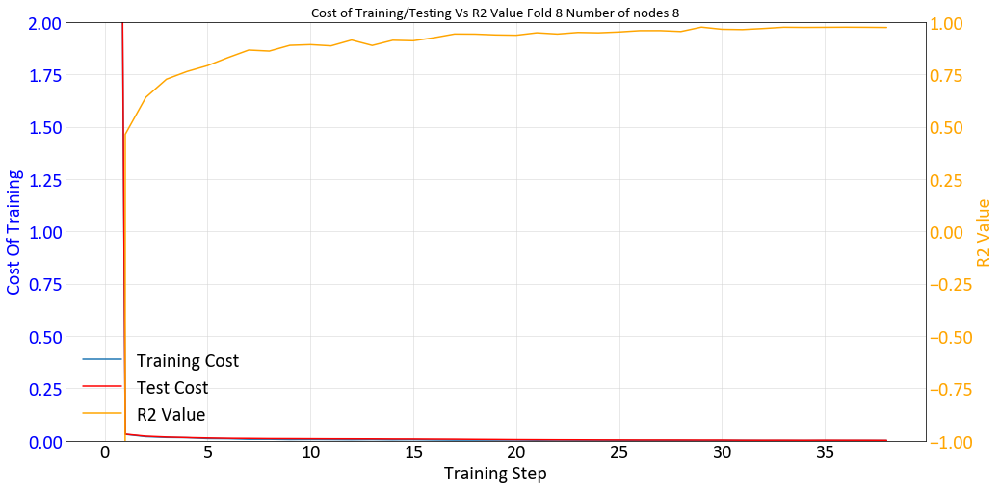

Working on Node 10 fold 8 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpovz2ik08', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D1DE50A90>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.007179440697655082
Cost_test : 0.011483812
R^2:0.8683702945709229
Epoch: 1200/5000 err = 0.005338579649105668
Cost_test : 0.011121786
R^2:0.8984538614749908
Epoch: 1300/5000 err = 0.004309484385885298
Cost_test : 0.010809991
R^2:0.9302507042884827
Epoch: 1400/5000 err = 0.005603573052212596
Cost_test : 0.010400823
R^2:0.9012479782104492
Epoch: 1500/5000 err = 0.005571585847064853
Cost_test : 0.009991542
R^2:0.9050365090370178
Epoch: 1600/5000 err = 0.0044584773713722825
Cost_test : 0.009365453
R^2:0.9187701940536499
Epoch: 1700/5000 err = 0.004076141398400068
Cost_test : 0.008588695
R^2:0.9320572912693024
Epoch: 1800/5000 err = 0.003362563904374838
Cost_test : 0.008239837
R^2:0.9382596611976624
Epoch: 1900/5000 err = 0.0030652942368760705
Cost_test : 0.0066869035
R^2:0.9437951445579529
Epoch: 2000/5000 err = 0.0030880445847287774
Cost_test : 0.0058671506
R^2:0.9469949007034302
Epoch: 2100/5000 err = 0.0028493080753833055
Cost_test : 0.0051078065
R^2:0.950137227

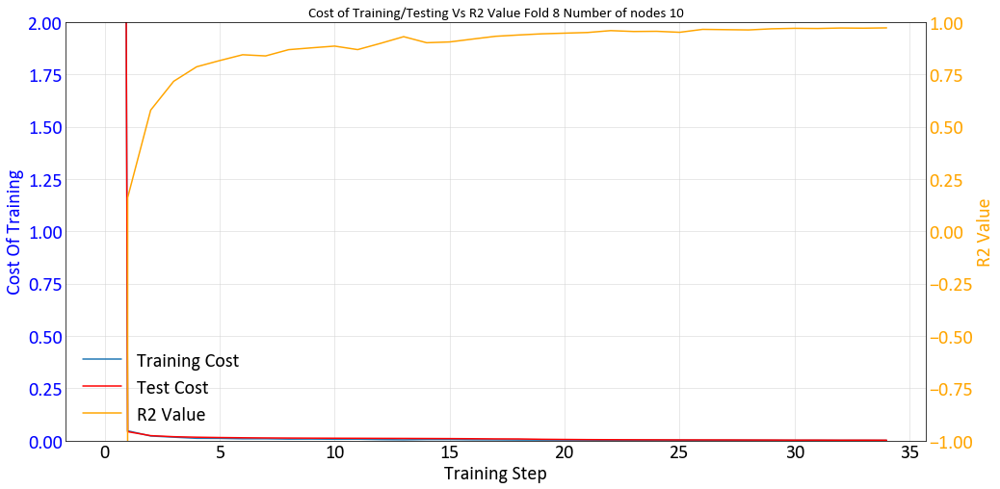

Working on Node 12 fold 8 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpjerh18h8', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D17316EB8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.006941288942471147
Cost_test : 0.01182148
R^2:0.874562680721283
Epoch: 1200/5000 err = 0.0063656463753432035
Cost_test : 0.011023254
R^2:0.8824437260627747
Epoch: 1300/5000 err = 0.0068669100292027
Cost_test : 0.010788338
R^2:0.9012857675552368
Epoch: 1400/5000 err = 0.00591123616322875
Cost_test : 0.010373045
R^2:0.8896790146827698
Epoch: 1500/5000 err = 0.005826134467497468
Cost_test : 0.009758369
R^2:0.9074606895446777
Epoch: 1600/5000 err = 0.005088777514174581
Cost_test : 0.009779715
R^2:0.9195362031459808
Epoch: 1700/5000 err = 0.0041311506647616625
Cost_test : 0.009542736
R^2:0.9234133362770081
Epoch: 1800/5000 err = 0.004465764854103327
Cost_test : 0.009023119
R^2:0.9220479726791382
Epoch: 1900/5000 err = 0.0037164929090067744
Cost_test : 0.009338633
R^2:0.9312550723552704
Epoch: 2000/5000 err = 0.003705763607285917
Cost_test : 0.008888182
R^2:0.9356010854244232
Epoch: 2100/5000 err = 0.0036338941426947713
Cost_test : 0.008859788
R^2:0.9367546141147614


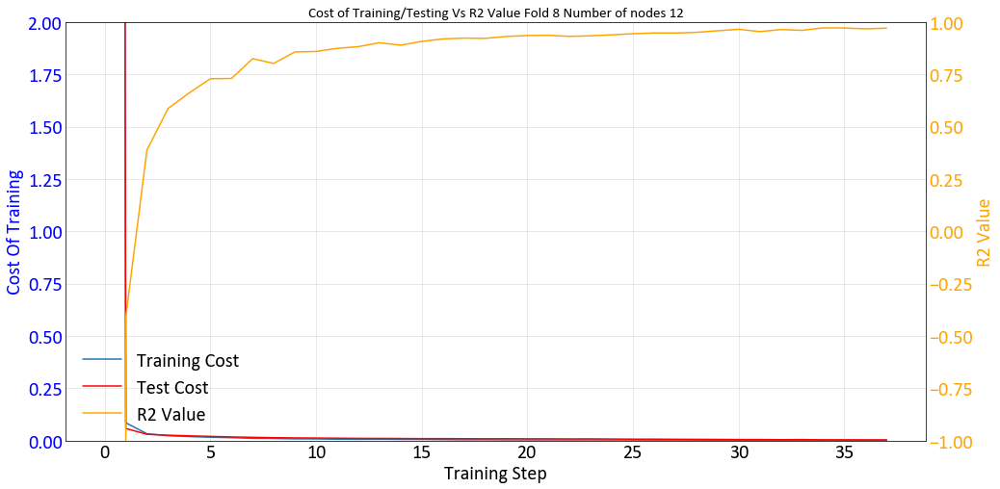

0.6413
1.6942
9
Working on Node 5 fold 9 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpioerk4dc', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D74890588>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done callin

Epoch: 1100/5000 err = 0.008847514167428017
Cost_test : 0.016104614
R^2:0.8353157639503479
Epoch: 1200/5000 err = 0.009850907139480114
Cost_test : 0.013744032
R^2:0.8368562757968903
Epoch: 1300/5000 err = 0.008309613447636366
Cost_test : 0.012585429
R^2:0.8389265835285187
Epoch: 1400/5000 err = 0.007330302614718676
Cost_test : 0.011493564
R^2:0.8586509227752686
Epoch: 1500/5000 err = 0.00706168613396585
Cost_test : 0.010793642
R^2:0.8529375493526459
Epoch: 1600/5000 err = 0.007513671647757292
Cost_test : 0.010090739
R^2:0.8591655194759369
Epoch: 1700/5000 err = 0.007520106853917241
Cost_test : 0.009587226
R^2:0.8712503612041473
Epoch: 1800/5000 err = 0.00620349426753819
Cost_test : 0.009007775
R^2:0.868619829416275
Epoch: 1900/5000 err = 0.005834611831232905
Cost_test : 0.008437513
R^2:0.8933767676353455
Epoch: 2000/5000 err = 0.005865471437573433
Cost_test : 0.008095964
R^2:0.8883196413516998
Epoch: 2100/5000 err = 0.005177562823519111
Cost_test : 0.0077092084
R^2:0.905060350894928
Ep

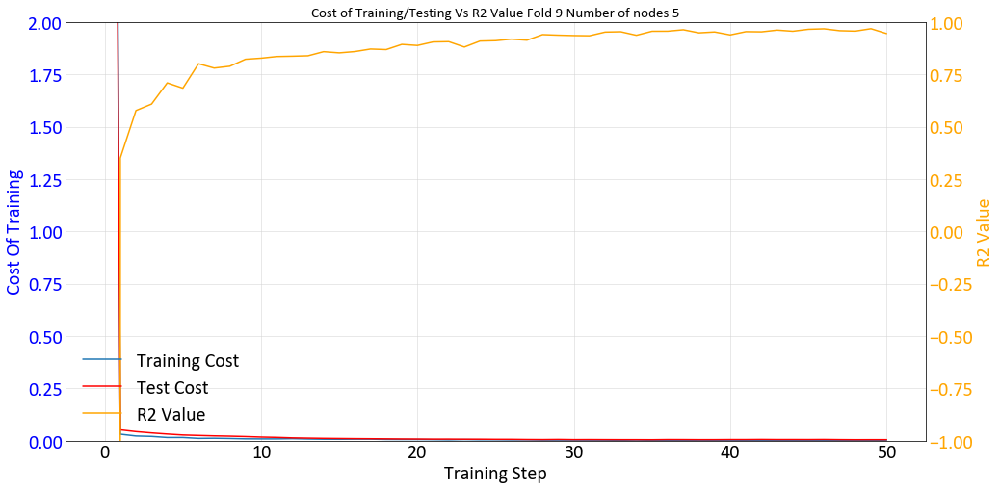

Working on Node 8 fold 9 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp_th0d26x', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D1AA87F28>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

Epoch: 1100/5000 err = 0.00620448705740273
Cost_test : 0.009391359
R^2:0.8711172938346863
Epoch: 1200/5000 err = 0.006344645982608199
Cost_test : 0.009053331
R^2:0.88551065325737
Epoch: 1300/5000 err = 0.004836097359657288
Cost_test : 0.008658961
R^2:0.9098043441772461
Epoch: 1400/5000 err = 0.005374916130676866
Cost_test : 0.008590371
R^2:0.8748598098754883
Epoch: 1500/5000 err = 0.005434864200651646
Cost_test : 0.008447158
R^2:0.8997463583946228
Epoch: 1600/5000 err = 0.004413988208398223
Cost_test : 0.008271049
R^2:0.9069830477237701
Epoch: 1700/5000 err = 0.0056859031319618225
Cost_test : 0.008093203
R^2:0.8902105689048767
Epoch: 1800/5000 err = 0.004383608000352979
Cost_test : 0.007898597
R^2:0.9189119040966034
Epoch: 1900/5000 err = 0.004936247365549207
Cost_test : 0.007543413
R^2:0.9018242061138153
Epoch: 2000/5000 err = 0.003806477878242731
Cost_test : 0.007495982
R^2:0.9250898361206055
Epoch: 2100/5000 err = 0.0038015261525288224
Cost_test : 0.0071750637
R^2:0.9202637672424316

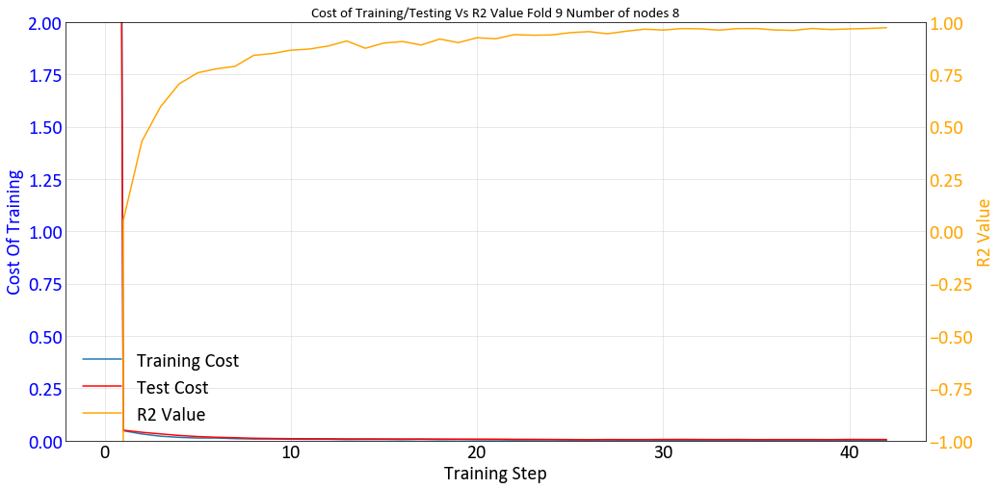

Working on Node 10 fold 9 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpmdeianp4', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D89B402B0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0065077501349151134
Cost_test : 0.009348537
R^2:0.8827210962772369
Epoch: 1200/5000 err = 0.005308210616931319
Cost_test : 0.008709292
R^2:0.9072067141532898
Epoch: 1300/5000 err = 0.00494014797732234
Cost_test : 0.008021091
R^2:0.8976380825042725
Epoch: 1400/5000 err = 0.005298705538734794
Cost_test : 0.0076087774
R^2:0.9104596078395844
Epoch: 1500/5000 err = 0.004360925173386931
Cost_test : 0.0072976863
R^2:0.917732834815979
Epoch: 1600/5000 err = 0.004002307076007128
Cost_test : 0.00707292
R^2:0.929932028055191
Epoch: 1700/5000 err = 0.0038825779920443892
Cost_test : 0.006608774
R^2:0.9280674755573273
Epoch: 1800/5000 err = 0.0045888302847743034
Cost_test : 0.0065135555
R^2:0.9206020534038544
Epoch: 1900/5000 err = 0.0032683571334928274
Cost_test : 0.00613135
R^2:0.9279073774814606
Epoch: 2000/5000 err = 0.0036004590801894665
Cost_test : 0.0057890126
R^2:0.9258047938346863
Epoch: 2100/5000 err = 0.004032419295981526
Cost_test : 0.005604642
R^2:0.927578240633

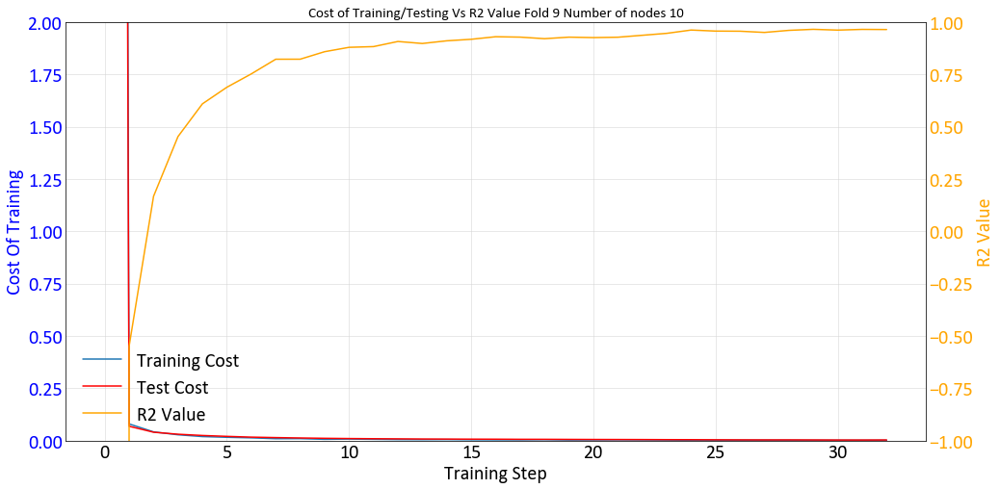

Working on Node 12 fold 9 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpuhwa0ato', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D1AA70F98>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.005616885144263506
Cost_test : 0.00893788
R^2:0.8980140388011932
Epoch: 1200/5000 err = 0.0049781647976487875
Cost_test : 0.009052784
R^2:0.903648167848587
Epoch: 1300/5000 err = 0.004637519363313913
Cost_test : 0.009364616
R^2:0.9121929109096527
Epoch: 1400/5000 err = 0.004629713948816061
Cost_test : 0.009877152
R^2:0.9170438349246979
Epoch: 1500/5000 err = 0.004169362829998136
Cost_test : 0.009997132
R^2:0.9165196418762207
Epoch: 1600/5000 err = 0.004062708467245102
Cost_test : 0.009307462
R^2:0.9250076413154602
Epoch: 1700/5000 err = 0.0031514669535681605
Cost_test : 0.009370671
R^2:0.9401279389858246
Epoch: 1800/5000 err = 0.0033775275805965066
Cost_test : 0.009034503
R^2:0.9394267499446869
Epoch: 1900/5000 err = 0.002919084159657359
Cost_test : 0.008635363
R^2:0.9455593824386597
Epoch: 2000/5000 err = 0.003519865684211254
Cost_test : 0.008453151
R^2:0.9328160285949707
Epoch: 2100/5000 err = 0.002885869238525629
Cost_test : 0.008163874
R^2:0.942662566900253

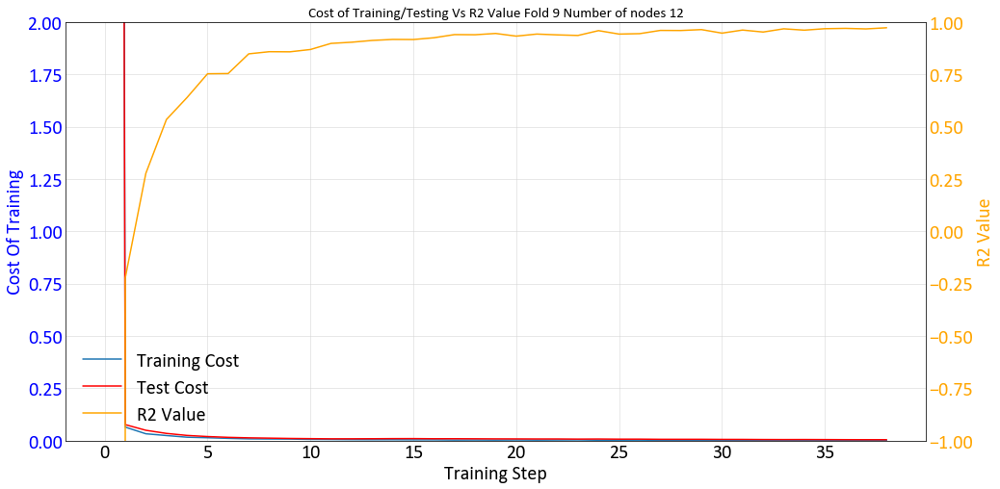

0.6455
1.6402
10
Working on Node 5 fold 10 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp6f9oppho', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D8CDF12B0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done call

Epoch: 1100/5000 err = 0.00747481407597661
Cost_test : 0.007400302
R^2:0.8678796291351318
Epoch: 1200/5000 err = 0.009323266334831715
Cost_test : 0.0072309272
R^2:0.8369899392127991
Epoch: 1300/5000 err = 0.008345941547304392
Cost_test : 0.00738666
R^2:0.8699057996273041
Epoch: 1400/5000 err = 0.008139830781146884
Cost_test : 0.006871428
R^2:0.8632745146751404
Epoch: 1500/5000 err = 0.008327366784214973
Cost_test : 0.006659524
R^2:0.849505752325058
Epoch: 1600/5000 err = 0.006784549681469798
Cost_test : 0.006362444
R^2:0.890757143497467
Epoch: 1700/5000 err = 0.006259250920265913
Cost_test : 0.005742449
R^2:0.8870377242565155
Epoch: 1800/5000 err = 0.004908147035166621
Cost_test : 0.0052593723
R^2:0.9261128306388855
Epoch: 1900/5000 err = 0.005497258855029941
Cost_test : 0.005204378
R^2:0.9115980863571167
Epoch: 2000/5000 err = 0.004953675903379917
Cost_test : 0.004536545
R^2:0.9258924126625061
Epoch: 2100/5000 err = 0.004437118303030729
Cost_test : 0.00407378
R^2:0.9187491238117218
Ep

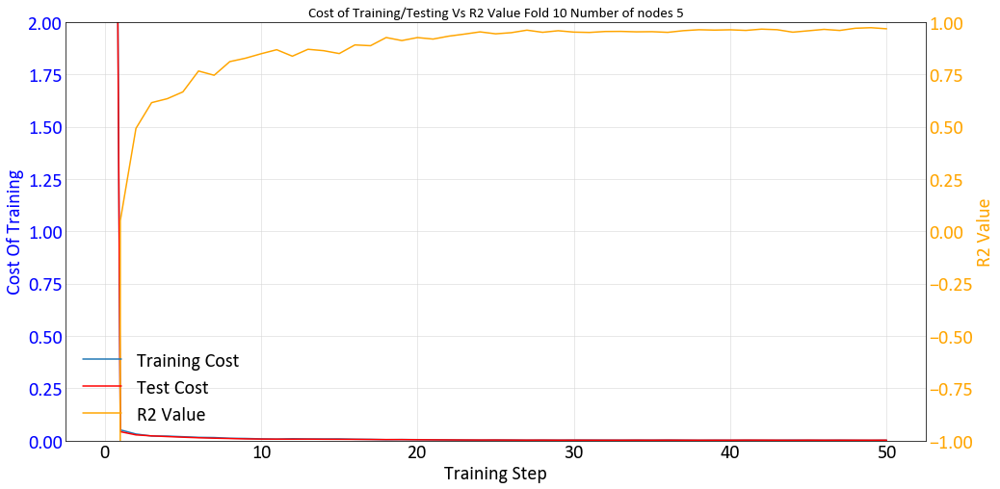

Working on Node 8 fold 10 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp8w3m407w', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D896BFFD0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.006699564168229699
Cost_test : 0.0069906977
R^2:0.8889589607715607
Epoch: 1200/5000 err = 0.006341566098853946
Cost_test : 0.006568243
R^2:0.8927866518497467
Epoch: 1300/5000 err = 0.007047599880024791
Cost_test : 0.006139354
R^2:0.8813654482364655
Epoch: 1400/5000 err = 0.005081585142761469
Cost_test : 0.0061458116
R^2:0.9162307977676392
Epoch: 1500/5000 err = 0.004711481276899576
Cost_test : 0.0057455176
R^2:0.9231315851211548
Epoch: 1600/5000 err = 0.005420969566330314
Cost_test : 0.0059943036
R^2:0.9043829143047333
Epoch: 1700/5000 err = 0.005245184525847435
Cost_test : 0.005647454
R^2:0.9121553897857666
Epoch: 1800/5000 err = 0.005145530682057142
Cost_test : 0.0053891
R^2:0.9125223159790039
Epoch: 1900/5000 err = 0.004156869719736278
Cost_test : 0.005118869
R^2:0.9259563386440277
Epoch: 2000/5000 err = 0.004284627735614777
Cost_test : 0.0053107496
R^2:0.9232213795185089
Epoch: 2100/5000 err = 0.003896691254340112
Cost_test : 0.0052730315
R^2:0.931344747543

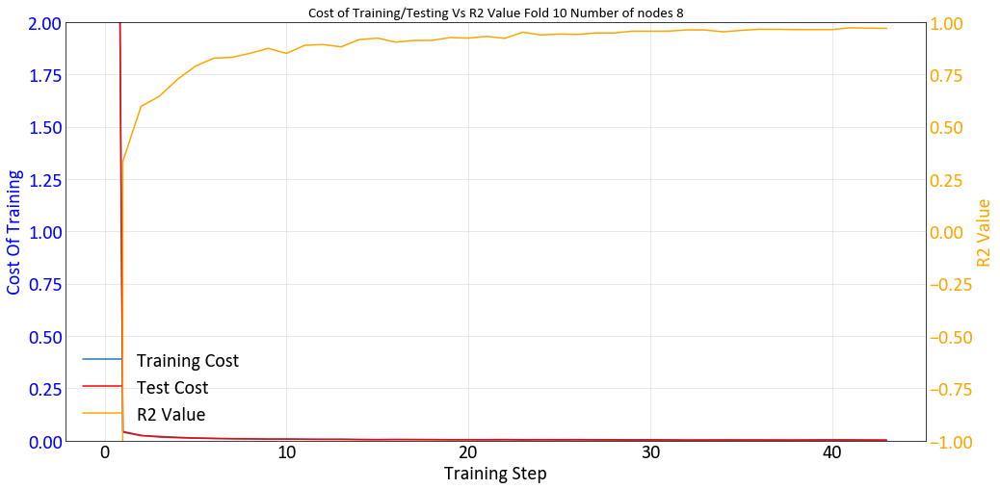

Working on Node 10 fold 10 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp6iuf23it', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D896BD048>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

Epoch: 1100/5000 err = 0.006054852157831192
Cost_test : 0.0076523507
R^2:0.8975309133529663
Epoch: 1200/5000 err = 0.005041992291808128
Cost_test : 0.0072604977
R^2:0.928349107503891
Epoch: 1300/5000 err = 0.0049916100688278675
Cost_test : 0.0070130313
R^2:0.928334504365921
Epoch: 1400/5000 err = 0.004002795671112835
Cost_test : 0.0066883075
R^2:0.9272570610046387
Epoch: 1500/5000 err = 0.004803330870345235
Cost_test : 0.0056015
R^2:0.923706591129303
Epoch: 1600/5000 err = 0.003969880752265453
Cost_test : 0.004948286
R^2:0.9390076398849487
Epoch: 1700/5000 err = 0.003729466116055846
Cost_test : 0.004471823
R^2:0.9340246021747589
Epoch: 1800/5000 err = 0.003172657103277743
Cost_test : 0.0043737055
R^2:0.9467945694923401
Epoch: 1900/5000 err = 0.0028644984122365713
Cost_test : 0.0040338817
R^2:0.9499579668045044
Epoch: 2000/5000 err = 0.0030654901638627052
Cost_test : 0.0037722453
R^2:0.946233481168747
Epoch: 2100/5000 err = 0.002684154431335628
Cost_test : 0.003681226
R^2:0.955837965011

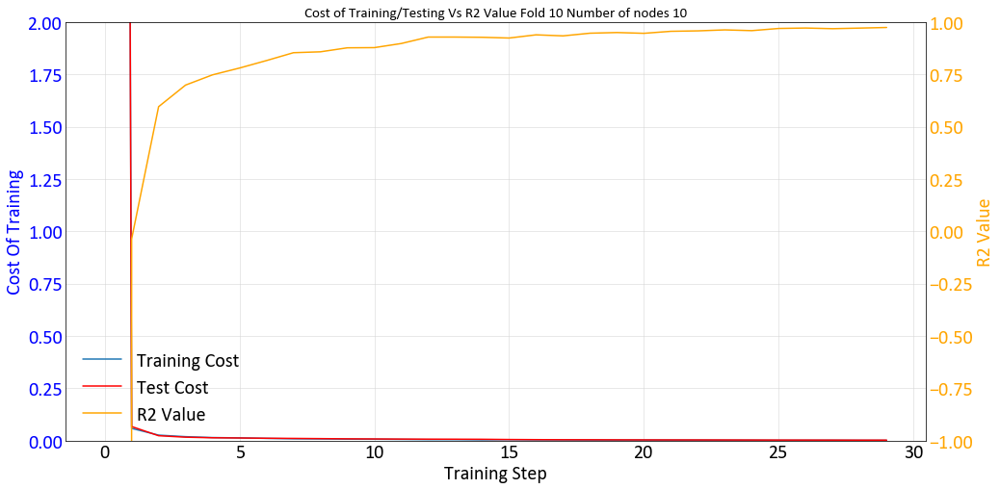

Working on Node 12 fold 10 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpsofs4my2', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000025D8AF3A048>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

Epoch: 1100/5000 err = 0.006697444478049874
Cost_test : 0.008211056
R^2:0.8896036744117737
Epoch: 1200/5000 err = 0.007227183552458882
Cost_test : 0.007943793
R^2:0.8699963092803955
Epoch: 1300/5000 err = 0.0068675498478114605
Cost_test : 0.00805796
R^2:0.8771766126155853
Epoch: 1400/5000 err = 0.006416482850909233
Cost_test : 0.007383622
R^2:0.8901934325695038
Epoch: 1500/5000 err = 0.006253099534660578
Cost_test : 0.007382194
R^2:0.902307391166687
Epoch: 1600/5000 err = 0.005165254697203636
Cost_test : 0.0071075745
R^2:0.9098573923110962
Epoch: 1700/5000 err = 0.004774578148499131
Cost_test : 0.006554914
R^2:0.9235707819461823
Epoch: 1800/5000 err = 0.004220624454319477
Cost_test : 0.0060113585
R^2:0.9229682087898254
Epoch: 1900/5000 err = 0.0033582764444872737
Cost_test : 0.00571836
R^2:0.9389591217041016
Epoch: 2000/5000 err = 0.0028695445507764816
Cost_test : 0.005258188
R^2:0.9504050612449646
Epoch: 2100/5000 err = 0.002321311621926725
Cost_test : 0.0045466083
R^2:0.9614670276641

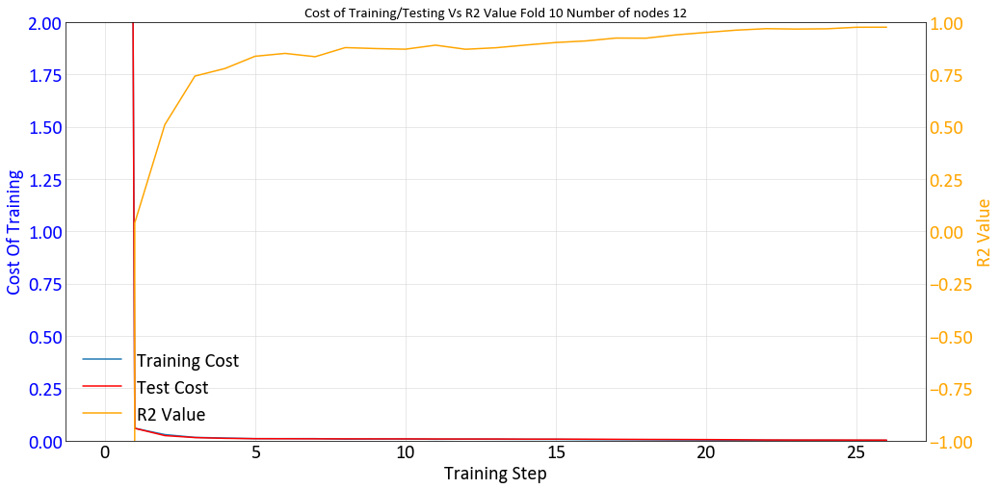

In [14]:
from sklearn.model_selection import KFold
fold_num= 0
for bs in range(1,11):
    fold_num += 1
    truth_vals = gs.DataFile('maketrend/trend_{}.out'.format(fold_num),griddef=griddef)
    datasamplefl = gs.DataFile('dhs_{}.out'.format(fold_num),griddef=griddef)
    datasamplefl = pd.DataFrame(datasamplefl.data, dtype = np.float32)
    del datasamplefl['Drill ID']
    del datasamplefl['MD']
    del datasamplefl['Block ID']
    datasamplefl['Z'] = datasamplefl['Z']
    #Prediction Grid
    x,y,z = griddef.gridcoord()
    #DH Sample Data
    datatest = np.asarray(datasamplefl)
    min_val = np.min(datatest[:,3])
    max_val = np.max(datatest[:,3])
    print(min_val)
    print(max_val)
    datatest[:,3] = (datatest[:,3]-min_val)/(max_val-min_val)
    data_x = np.hstack((x.reshape(len(x),1),y.reshape(len(y),1),z.reshape(len(z),1)))/100
    columns = ['X','Y','Z','value']
    n_batch = 2
    RFB_type = 'Gaussian'
    for fold in range(1,2):
        print(fold_num)
        #print("TRAIN:", train_index, "TEST:", test_index)
        data_train, data_test,target_train, target_test = train_test_split(datatest[:,0:3]/100,datatest[:,3:4],test_size=0.20)
        gs.write_gslib(pd.DataFrame(np.hstack((data_train*100,target_train*(max_val-min_val)+min_val)),columns=columns), './data/data_train_{}.dat'.format(fold_num))
        gs.write_gslib(pd.DataFrame(np.hstack((data_test*100,target_test*(max_val-min_val)+min_val)),columns=columns), './data/data_test_{}.dat'.format(fold_num))
        row = 0
        NN = 'ERBFN' # RBFN or GRNN or 'EBFN'
        data_type = 'Continuous' # Continuous or Categorical
        test_nodes = [5,8,10,12]
        pred_all = np.zeros((len(test_nodes)*data_x.shape[0],target_train.shape[1]))
        pred_all_row = np.zeros((data_x.shape[0],target_train.shape[1],len(test_nodes)))
        info_matrix = np.zeros((len(test_nodes),8))
        for nodes in test_nodes:
            c_t = []
            c_test = []
            c_r2 = []
            start_time = time.time()
            print("Working on Node {} fold {} ".format(nodes,fold_num))
            k = nodes
            data_trainpd = pd.DataFrame(data_train)
            data = data_trainpd

            with tf.device('/device:CPU:0'):
                #clustering
                def input_fn():
                  return tf.train.limit_epochs(
                      tf.convert_to_tensor(data_train, dtype=tf.float32), num_epochs=1)

                kmeans = tf.contrib.factorization.KMeansClustering(
                    num_clusters=nodes, use_mini_batch=False)


                # train
                num_iterations = 10
                previous_centers = None
                for _ in range(num_iterations):
                  kmeans.train(input_fn)
                  cluster_centers = kmeans.cluster_centers()
                  #if previous_centers is not None:
                    #print('delta:', cluster_centers - previous_centers)
                  previous_centers = cluster_centers
                  #print('score:', kmeans.score(input_fn))
                #print('cluster centers:', cluster_centers)


            with tf.device('/device:GPU:0'):
                from tensorflow.python.framework import ops
                ops.reset_default_graph()


                RANDOM_SEED = 42
                tf.set_random_seed(RANDOM_SEED)

                N_INSTANCES = np.shape(data_train)[0]
                N_INPUT = data_train.shape[0]
                N_FEATURE = data_train.shape[1]
                N_CLASSES = target_train.shape[1]
                TRAIN_SIZE = int(N_INSTANCES)
                batch_size = int(np.shape(data_train)[0]/n_batch)
                training_epochs = 5000
                if nodes >= 2:
                    training_epochs = 5000
                if nodes >= 25:
                    training_epochs = 5000
                if nodes >= 100:
                    training_epochs = 5000
                if nodes >= 1000:
                    training_epochs = 5000
                learning_rate = 0.01
                epsilon = 0.001
                display_step = 100
                hidden_size = nodes

                target_ = np.zeros((N_INSTANCES, N_CLASSES))
                extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)

                x_data = tf.placeholder(shape=[None, N_FEATURE], dtype=tf.float32, name = 'Features')
                y_target = tf.placeholder(shape=[None, N_CLASSES], dtype=tf.float32, name = 'Known_Values')


                dist = np.zeros((k,k))
                for i in range (0,k):
                    for j in range (0,k):
                        dist[i:j] = distance.euclidean(cluster_centers[i], cluster_centers[j])
                        maxdist = dist.max()
                sigma = maxdist/np.sqrt(2*k)
                if nodes == 1 :
                    beta = 0.2
                else:        
                    beta = 1/math.pow(2*sigma,2)

                #EBFN
                if NN == 'ERBFN':
                    def rbf_network(input_layer, cluster_centers ,weights):

                        exp_list= []
                        with tf.name_scope('Cluster_Centers'):
                            yy = weights['cluster_centers']

                        with tf.name_scope('Input_Layer'):
                            input_layer

                        for i in range(nodes):
                            with tf.name_scope('Covariance_Matrix'):
                                vv = weights['cov_mat'][:,:,i]
                                symA = 0.5 * tf.math.add(vv , tf.transpose(vv))

                            with tf.name_scope('Mahalanobis_Distance'):
                                cc_i = yy[i]

                                diff = tf.subtract(input_layer, cc_i , name = 'subtract')

                                dt = tf.transpose(diff,name = 'Transpose')

                                M1 = tf.matmul(diff,symA,name = 'M1')

                                M2 = tf.matmul(M1,dt,name = 'M2')

                                sqrt = tf.math.sqrt(tf.math.abs(M2),name = 'sqrt')

                                diag = tf.linalg.tensor_diag_part(sqrt,name = 'diag') 

                            with tf.name_scope('Gaussian_Activation_Layer'):
                                gauss_f = tf.math.exp((-tf.math.pow((weights['beta'][:,i]*diag), 2)))
                                exp_list.append(gauss_f)

                        with tf.name_scope('Output_Layer'):        
                            layer2_act = tf.stack(exp_list)   
                            output = tf.add(tf.matmul(layer2_act, weights['output'],transpose_a=True,name = 'mult_layer2_by_weights'), bias['output'], 
                                        name = 'add_bias_to_output')     
                        return output


                weights = {
                    'h1': tf.Variable(tf.ones([N_FEATURE, N_FEATURE,nodes]), name = 'layer1_dims'),
                    'output': tf.Variable(tf.ones([nodes, N_CLASSES]), name = 'layer2_output_Weights'),
                    'cov_mat': tf.Variable(tf.ones(shape = [N_FEATURE,N_FEATURE,nodes]), name = 'cov'),
                    'beta' : tf.Variable(tf.constant(beta,shape = [1,nodes]) ,name = 'beta'),            
                    'cluster_centers' : tf.Variable(tf.constant(np.asarray(cluster_centers).reshape(nodes,N_FEATURE),
                                        shape = [nodes,N_FEATURE]), name = 'cluster_center')
                }

                bias = {
                    'output' : tf.Variable([0],name='output_bias',dtype=tf.float32)  
                }


                pred = rbf_network(x_data, cluster_centers ,weights)

                if data_type == 'Continuous':
                    with tf.name_scope('cost'):
                        cost = tf.reduce_mean(tf.square(pred - y_target))
                        #cost = tf.math.reduce_sum(tf.square(pred - y_target)) 
                        my_opt = tf.train.AdamOptimizer(learning_rate,beta1=0.5).minimize(cost)  
                        tf.summary.scalar('cost', cost)

                    with tf.name_scope('accuracy'):
                        total_error = tf.reduce_sum(tf.square(tf.subtract(y_target, tf.reduce_mean(y_target))))
                        unexplained_error = tf.reduce_sum(tf.square(tf.subtract(y_target, pred)))
                        accuracy = tf.subtract(1.00, tf.divide(unexplained_error, total_error))

                if data_type == 'Categorical':
                    with tf.name_scope('cost'):
                        if N_CLASSES == 1:
                            cost = tf.reduce_mean(tf.square(tf.round(pred) - y_target)) 
                        else:
                            cost = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels = y_target, logits = pred))
                        my_opt = tf.train.AdamOptimizer(learning_rate).minimize(cost) 
                        tf.summary.scalar('cost', cost)

                    with tf.name_scope('accuracy'):
                        correct_prediction = tf.equal(tf.round(pred), y_target)
                        accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))


    #             tf.summary.histogram("cov_mat", weights['cov_mat'])
    #             tf.summary.histogram("Weights_Output_Layer", weights['output'])
    #             tf.summary.histogram("Bias_Output_Layer", bias['output'])




                init = tf.global_variables_initializer()
                sess = tf.InteractiveSession(config=tf.ConfigProto(log_device_placement=True))
                merged = tf.summary.merge_all()
                saver = tf.train.Saver()
                writer = tf.summary.FileWriter('./test',sess.graph)
                sess.run(init)
                tol = 0.00001
                epoch, err, acc=0, 1, 0
                # Training loop
                #saver.restore(sess,'./spatial/test_dataset_{}.ckpt'.format(nodes))
                while epoch <= training_epochs and err >= tol and acc <= 0.98:

                    avg_cost = 0.
                    acc = 0.
                    total_batch = int(data_train.shape[0] / batch_size)
                    for i in range(total_batch):
                        randidx = np.random.randint(int(TRAIN_SIZE), size=batch_size)
                        batch_xs = data_train[randidx , :]
                        batch_ys = target_train[randidx , :]
                        sess.run(my_opt, feed_dict={x_data: batch_xs, y_target: batch_ys})
                        avg_cost += sess.run(cost, feed_dict={x_data: batch_xs, y_target: batch_ys})/total_batch
                        acc += sess.run(accuracy, feed_dict={x_data: batch_xs, y_target: batch_ys})/total_batch
                    err = avg_cost
                    if epoch % 100 == 0:
                        #summary = sess.run([merged],feed_dict={x_data: batch_xs, y_target: batch_ys})
                        #writer.add_summary(summary,epoch)
                        print("Epoch: {}/{} err = {}".format(epoch, training_epochs, avg_cost))
                        print('Cost_test :',sess.run(cost, feed_dict={x_data:data_test,y_target:target_test}))
                        c_t.append(avg_cost)
                        c_test.append(sess.run(cost, feed_dict={x_data:data_test,y_target:target_test}))
                        c_r2.append(acc)
                        if data_type == 'Categorical': 
                            print("Accuracy:{}".format(acc))
                        else:
                            print("R^2:{}".format(acc))    

                    epoch +=1

                print ("End of learning process")
                print ("Final epoch = {}/{} ".format(epoch, training_epochs))
                print ("Final error = {}".format(err) )
                print ("Final R^2 = {}".format(acc) )
                saver.save(sess,'./spatial/test_dataset_{}_{}.ckpt'.format(nodes,fold_num))
                w = np.vsplit(data_x,500)[0].shape[0]
                pred1 = np.zeros((data_x.shape[0],N_CLASSES))
                for i in range(0,500):
                    pred1[i*w:(1+i)*w,0:N_CLASSES] = (sess.run(pred, feed_dict={x_data:np.vsplit(data_x,500)[i]}))*(max_val-min_val)+min_val
                    pred_all[i*w+(row*data_x.shape[0]):(1+i)*w+(row*data_x.shape[0]),0:N_CLASSES] = pred1[i*w:(1+i)*w,0:N_CLASSES]
                    pred_all_row[i*w:(1+i)*w,0:N_CLASSES,row] = pred1[i*w:(1+i)*w,0:N_CLASSES]

                writer = tf.summary.FileWriter("sess_graph", sess.graph)
                saver.save(sess,'test/test_dataset_{}_{}.ckpt'.format(nodes,fold_num))
                sess.close() 

                gs.write_gslib(pd.DataFrame(pred1), './predictions/real_{}_{}.dat'.format(nodes,fold_num))

                info_matrix[row,0] = k
                info_matrix[row,1] = beta
                info_matrix[row,2] = 0 #r2_score(truth_vals['variable 1'],pred1)
                info_matrix[row,3] = np.mean(pred1)
                info_matrix[row,4] = np.var(pred1)
                info_matrix[row,5] = 0 #mean_squared_error(truth_vals['variable 1'],pred1)
                info_matrix[row,6] = err
                info_matrix[row,7] = (time.time() - start_time) 
                row +=1
                tf.InteractiveSession.close(sess)
            print(info_matrix)
            SMALL_SIZE = 15
            plt.rc('font', size=SMALL_SIZE)
            plt.rc('axes', titlesize=SMALL_SIZE)
            f, (ax1) = plt.subplots(1, 1,figsize=(16, 8))
            ax1.set_ylim([0,2])
            ax1.plot(range(len(c_t)), c_t, label ='Training Cost')
            ax1.plot(range(len(c_t)), c_test, color="red",label ='Test Cost')
            ax1.set_xlabel('Training Step')
            ax1.grid(True)
            ax1.set_title('Cost of Training/Testing Vs R2 Value Fold {} Number of nodes {}'.format(fold_num,nodes))
            ax1.set_ylabel('Cost Of Training', color='blue')
            ax1.tick_params(axis='y', labelcolor='blue')
            ax2 = ax1.twinx()
            ax2.plot(range(len(c_t)), c_r2,'-',color="orange",label ='R2 Value')
            ax2.set_ylim([-1,1])
            ax2.set_ylabel('R2 Value', color='orange')
            ax2.tick_params(axis='y', labelcolor='orange')
            lines, labels = ax1.get_legend_handles_labels()
            lines2, labels2 = ax2.get_legend_handles_labels()
            ax2.legend(lines + lines2, labels + labels2, loc=3)
            plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Training_R2_ERBFN_{}_{}_{}.png'.format(nodes,fold_num,plt_extent))
            plt.show()


        ensemble = numpy.nanmean(pred_all_row, axis = 2)
        gs.write_gslib(pd.DataFrame(ensemble), './predictions/ensemble_{}.dat'.format(fold_num))
        gs.write_gslib(pd.DataFrame(pred_all), './predictions/all_real_{}.dat'.format(fold_num))

In [37]:
declusstr = """                  Parameters for DECLUS
                  *********************

START OF PARAMETERS:
{datafl}         -file with data
{xyzcol}   {varcol}               -  columns for X, Y, Z, and variable
-1.0e21     1.0e21          -  trimming limits
declus/declus_{fold}.sum                  -file for summary output
declus/declus_{fold}.out                  -file for output with data & weights
1.0   1.0                   -Y and Z cell anisotropy (Ysize=size*Yanis)
0                           -0=look for minimum declustered mean (1=max)
50  25  200.0               -number of cell sizes, min size, max size
100                           -number of origin offsets
"""
varcparstr = """                  Parameters for VARCALC
                  **********************
 
START OF PARAMETERS:
{datafl}                 -file with data
{xyzcol}                         -   columns for X, Y, Z coordinates
1   {varcol}                            -   number of variables,column numbers (position used for tail,head variables below)
-99.0    1.0e21                  -   trimming limits
3                                 -number of directions
90 15 200 0.0 22.5 200 0.0   -Dir 01: azm,azmtol,bandhorz,dip,dipt
 20  {ldist}  {ltol}                 -        number of lags,lag distanc
0  15 200 0.0 22.5 200 0.0   -Dir 01: azm,azmtol,bandhorz,dip,dipt
 20  {ldist}  {ltol}                 -        number of lags,lag distanc
0. 22.5 200 90.0 22.5 200 0.0   -Dir 03: azm,azmtol,bandhorz,dip,
 20  10  5                 -        number of lags,lag distanc
./vargs/varcalc_{fold}.out                       -file for experimental variogram points output.
0                                 -legacy output (0=no, 1=write out gamv2004 format)
1                                 -run checks for common errors
1                                 -standardize sills? (0=no, 1=yes)
1                                 -number of variogram types
1   1   1   ?                     -tail variable, head variable, variogram type (and cutoff/category), sill

"""
varmparstr = """                  Parameters for VARMODEL
                  ***********************
 
START OF PARAMETERS:
./vargs/varmodel_{fold}.out                 -file for modeled variogram points output
3                            -number of directions to model points along
    90.0  00.0  1000   0.5      -  azm, dip, npoints, point separation
    0.0  00.0  1000   0.5      -  azm, dip, npoints, point separation
    0.0  90.0  1000   0.5      -  azm, dip, npoints, point separation
1    0.001:0.01                   -nst, nugget effect
3    0.99    90   0.0   0.0    -it,cc,azm,dip,tilt (ang1,ang2,ang3)
        75:1000  100  75:300    -a_hmax, a_hmin, a_vert (ranges)
1   2000000                   -fit model (0=no, 1=yes), maximum iterations
1.0                          -  variogram sill (can be fit, but not recommended in most cases)
1                            -  number of experimental files to use
{varcalc}                  -    experimental output file 1
3   1  2  3                    -      # of variograms (<=0 for all), variogram #s
1   1   10                   -  # pairs weighting, inverse distance weighting, min pairs
0     10.0                   -  fix Hmax/Vert anis. (0=no, 1=yes)
0      1.0                   -  fix Hmin/Hmax anis. (0=no, 1=yes)
./vargs/varmodel_{fold}.var              -  file to save fit variogram model
"""
kt3dnparstr = """                 Parameters for KT3DN
                 ********************
START OF PARAMETERS:
{datafl}             -file with data
0  {xyzcol} {varcol}  0                 -  columns for DH,X,Y,Z,var,sec var
-998.0    1.0e21                 -  trimming limits
0                                -option: 0=grid, 1=cross, 2=jackknife
xvk.dat                          -file with jackknife data
1   2   0    3    0              -   columns for X,Y,Z,vr and sec var
kt3dn_dataspacing.out            -data spacing analysis output file (see note)
0    15.0                        -  number to search (0 for no dataspacing analysis, rec. 10 or 20) and composite length
0    100   0                     -debugging level: 0,3,5,10; max data for GSKV;output total weight of each data?(0=no,1=yes)
kt3dn.dbg-nkt3dn.sum             -file for debugging output (see note)
./predictions/kt3dn_{fold}.out                        -file for kriged output (see GSB note)
{griddef}
1    1      1                    -x,y and z block discretization
25    50    12    1               -min, max data for kriging,upper max for ASO,ASO incr
90      0                         -max per octant, max per drillhole (0-> not used)
500.0  500.0  250.0              -maximum search radii
90.0  0.0   0.0                 -angles for search ellipsoid
0                                -0=SK,1=OK,2=LVM(resid),3=LVM((1-w)*m(u))),4=colo,5=exdrift,6=ICCK
{mean} 0.6  0.8                  -  mean (if 0,4,5,6), corr. (if 4 or 6), var. reduction factor (if 4)
0 0 0 0 0 0 0 0 0                -drift: x,y,z,xx,yy,zz,xy,xz,zy
0                                -0, variable; 1, estimate trend
extdrift.out                     -gridded file with drift/mean
4                                -  column number in gridded file
keyout.out                       -gridded file with keyout (see note)
0    1                           -  column (0 if no keyout) and value to keep
{varg}
"""

In [38]:
varcalc = gs.Program('varcalc')
varmodel = gs.Program('varmodel')
kt3dn = gs.Program('kt3dn')
declus = gs.Program('declus') 
for fold in range(1,11):
    Traindat = gs.DataFile('dhs_{}.out'.format(fold),griddef=griddef)

    declus.run(declusstr.format(datafl = Traindat.flname,
                         xyzcol = Traindat.gscol(Traindat.xyz),
                         varcol = Traindat.gscol('variable 1'),
                         fold = fold))
    
    declus_mean = np.min(np.asarray(gs.DataFile('declus/declus_{}.sum'.format(fold)).data['Declustered Mean'][gs.DataFile('declus/declus_{}.sum'.format(fold)).data['Cell Size']>0.0]))

    
    
    varcalc.run(varcparstr.format(datafl = Traindat.flname,
                             xyzcol = Traindat.gscol(Traindat.xyz),
                             varcol = Traindat.gscol('variable 1'),
                             fold = fold,
                             ldist =125,
                             ltol = 70))

    varcalcfl = gs.DataFile('./vargs/varcalc_{}.out'.format(fold))

   
    varmodel.run(varmparstr.format(varcalc = varcalcfl.flname,
                                 fold = fold))

    varmodelfl = gs.DataFile('./vargs/varmodel_{}.out'.format(fold))

    f = open("./vargs/varmodel_{}.var".format(fold), "r")
    varg = f.readlines()
    f.close()
    varg = ''.join(varg)
    
    kt3dn.run(kt3dnparstr.format(datafl = Traindat.flname,
                             xyzcol = Traindat.gscol(Traindat.xyz),
                             varcol = Traindat.gscol('variable 1'),
                             griddef = griddef,
                             varg = varg,
                             fold = fold,
                             mean = declus_mean))

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = dhs_1.out                               
 columns =            2           3           4           7
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = declus/declus_1.sum                     
 output file = declus/declus_1.out                     
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           50       25.000000      110.000000
 offsets =          100


There are      384 data with:
  mean value            =      1.10047
  minimum and maximum   =      0.56690     1.93450
  size of data vol in X =    375.00000
  size of data vol in Y =    375.00000
  size of data vol in Z =    230.00000

  declustered mean      =      1.09119
  min and max weight    =      0.71091     2.03431
  equal weighting       =      1.00000


DECLUS Version: 3.000 Finished

Stop - Program terminated.
Calling:  ['varcalc', 'temp']

varcalc version:  1.400

  data file: dhs_1.out
  x,

 Final objective value =   2.846126091917151E-003
  Modeling points

varmodel completed successfully

Calling:  ['kt3dn', 'temp']

 KT3DN Version: 7.100

  data file = dhs_2.out                               
  columns =            0           2           3           4           7
           0
  trimming limits =   -998.000000000000       1.000000000000000E+021
  kriging option =            0
  jackknife data file = xvk.dat                                 
  columns =            1           2           0           3           0
  data spacing analysis output file = kt3dn_dataspacing.out                   
  debugging level =            0
  summary only file = kt3dn.sum                               
  debugging file = kt3dn.dbg                               
  GSLIB-style output file = ./predictions/kt3dn_2.out               
  nx, xmn, xsiz =           50   5.00000000000000        10.0000000000000     
  ny, ymn, ysiz =           50   5.00000000000000        10.0000000000000     
  nz

   currently on estimate      6250
   currently on estimate     12500
   currently on estimate     18750
   currently on estimate     25000
   currently on estimate     31250
   currently on estimate     37500
   currently on estimate     43750
   currently on estimate     50000
   currently on estimate     56250
   currently on estimate     62500

 KT3DN Version:    7.100 Finished

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = dhs_4.out                               
 columns =            2           3           4           7
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = declus/declus_4.sum                     
 output file = declus/declus_4.out                     
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           50       25.000000      110.000000
 offsets =          100


There are      384 data with:
  mean value            =      1.09004
  minimum and maximum   =      0.60610     1.90500
  siz

varmodel version: 1.1.1

  output points file: ./vargs/varmodel_5.out
  number of directions to model points along:            3
  azm, dip, npoints, pointsep:    90.0000000000000       0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:   0.000000000000000E+000  0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:   0.000000000000000E+000   90.0000000000000     
        1000  0.500000000000000     
  nst =           1
 c0 constrained to  1.000000000000000E-003  1.000000000000000E-002
  fit model?            1     2000000
  number of variogram files:            1
  variogram file: ./vargs/varcalc_5.out
  using variograms            1           2           3
  # pairs wt, inv dist wt, min pairs:            1           1          10
  fixhmaxvert,hmaxvert:            0   10.0000000000000     
  fixhminhmax,hminhmax:            0   1.00000000000000     
  variogram model output file: ./vargs/varmodel_5.var
 Readi

   currently on estimate      6250
   currently on estimate     12500
   currently on estimate     18750
   currently on estimate     25000
   currently on estimate     31250
   currently on estimate     37500
   currently on estimate     43750
   currently on estimate     50000
   currently on estimate     56250
   currently on estimate     62500

 KT3DN Version:    7.100 Finished

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = dhs_7.out                               
 columns =            2           3           4           7
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = declus/declus_7.sum                     
 output file = declus/declus_7.out                     
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           50       25.000000      110.000000
 offsets =          100


There are      384 data with:
  mean value            =      1.09782
  minimum and maximum   =      0.62870     1.81260
  siz

 Final objective value =   6.651474301950271E-003
  Modeling points

varmodel completed successfully

Calling:  ['kt3dn', 'temp']

 KT3DN Version: 7.100

  data file = dhs_8.out                               
  columns =            0           2           3           4           7
           0
  trimming limits =   -998.000000000000       1.000000000000000E+021
  kriging option =            0
  jackknife data file = xvk.dat                                 
  columns =            1           2           0           3           0
  data spacing analysis output file = kt3dn_dataspacing.out                   
  debugging level =            0
  summary only file = kt3dn.sum                               
  debugging file = kt3dn.dbg                               
  GSLIB-style output file = ./predictions/kt3dn_8.out               
  nx, xmn, xsiz =           50   5.00000000000000        10.0000000000000     
  ny, ymn, ysiz =           50   5.00000000000000        10.0000000000000     
  nz

 Working on the kriging 
   currently on estimate      6250
   currently on estimate     12500
   currently on estimate     18750
   currently on estimate     25000
   currently on estimate     31250
   currently on estimate     37500
   currently on estimate     43750
   currently on estimate     50000
   currently on estimate     56250
   currently on estimate     62500

 KT3DN Version:    7.100 Finished

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = dhs_10.out                              
 columns =            2           3           4           7
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = declus/declus_10.sum                    
 output file = declus/declus_10.out                    
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           50       25.000000      110.000000
 offsets =          100


There are      384 data with:
  mean value            =      1.09778
  minimum and maximum   =      

In [4]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import warnings
warnings.simplefilter('ignore')
from scipy.ndimage import gaussian_filter

In [5]:
declusstr = """                  Parameters for DECLUS
                  *********************

START OF PARAMETERS:
{datafl}         -file with data
{xyzcol}   {varcol}               -  columns for X, Y, Z, and variable
-1.0e21     1.0e21          -  trimming limits
./declus/declus_{fold}.sum                  -file for summary output
./declus/declus_{fold}.out                  -file for output with data & weights
1.0   1.0                   -Y and Z cell anisotropy (Ysize=size*Yanis)
0                           -0=look for minimum declustered mean (1=max)
99  10.0  110.0               -number of cell sizes, min size, max size
100                           -number of origin offsets
"""

varcparstr = """                  Parameters for VARCALC
                  **********************
 
START OF PARAMETERS:
{datafl}                 -file with data
{xyzcol}                         -   columns for X, Y, Z coordinates
1   {varcol}                            -   number of variables,column numbers (position used for tail,head variables below)
-99.0    1.0e21                  -   trimming limits
3                                 -number of directions
90 15 200 0.0 22.5 200 0.0   -Dir 01: azm,azmtol,bandhorz,dip,dipt
 20  {ldist}  {ltol}                 -        number of lags,lag distanc
0  15 200 0.0 22.5 200 0.0   -Dir 01: azm,azmtol,bandhorz,dip,dipt
 20  {ldist}  {ltol}                 -        number of lags,lag distanc
0. 22.5 200 90.0 22.5 200 0.0   -Dir 03: azm,azmtol,bandhorz,dip,
 20  10  5                 -        number of lags,lag distanc
./vargs/varcalc_{fold}.out                       -file for experimental variogram points output.
0                                 -legacy output (0=no, 1=write out gamv2004 format)
1                                 -run checks for common errors
1                                 -standardize sills? (0=no, 1=yes)
1                                 -number of variogram types
1   1   1   ?                     -tail variable, head variable, variogram type (and cutoff/category), sill

"""
varmparstr = """                  Parameters for VARMODEL
                  ***********************
 
START OF PARAMETERS:
./vargs/varmodel_{fold}.out                 -file for modeled variogram points output
3                            -number of directions to model points along
    90.0  00.0  1000   0.5      -  azm, dip, npoints, point separation
    0.0  00.0  1000   0.5      -  azm, dip, npoints, point separation
    0.0  90.0  1000   0.5      -  azm, dip, npoints, point separation
1    0.001:0.01                   -nst, nugget effect
3    0.99    90   0.0   0.0    -it,cc,azm,dip,tilt (ang1,ang2,ang3)
        75:1000  100  75:200    -a_hmax, a_hmin, a_vert (ranges)
1   200000                   -fit model (0=no, 1=yes), maximum iterations
1.0                          -  variogram sill (can be fit, but not recommended in most cases)
1                            -  number of experimental files to use
{varcalc}                  -    experimental output file 1
0                    -      # of variograms (<=0 for all), variogram #s
1   1   10                   -  # pairs weighting, inverse distance weighting, min pairs
0     10.0                   -  fix Hmax/Vert anis. (0=no, 1=yes)
0      1.0                   -  fix Hmin/Hmax anis. (0=no, 1=yes)
./vargs/varmodel_{fold}.var              -  file to save fit variogram model
"""
kt3dnparstr = """                 Parameters for KT3DN
                 ********************
START OF PARAMETERS:
{datafl}              -file with data
0  {xyzcol}  {varcol}  {seisnscol}                 -  columns for DH,X,Y,Z,var,sec var
-99    1.0e21                 -  trimming limits
0                                -option: 0=grid, 1=cross, 2=jackknife
xvk.dat                          -file with jackknife data
1   2   0    3    0              -   columns for X,Y,Z,vr and sec var
kt3dn_dataspacing.out            -data spacing analysis output file (see note)
0    15.0                        -  number to search (0 for no dataspacing analysis, rec. 10 or 20) and composite length
0    100   0                     -debugging level: 0,3,5,10; max data for GSKV;output total weight of each data?(0=no,1=yes)
kt3dn.dbg-nkt3dn.sum             -file for debugging output (see note)
./ML+ICCK/kt3dn_{fold}.out                        -file for kriged output (see GSB note)
{griddef}
1    1      1                    -x,y and z block discretization
10    50    12    1               -min, max data for kriging,upper max for ASO,ASO incr
0      0                         -max per octant, max per drillhole (0-> not used)
500  500  500              -maximum search radii
90   0   0.0                 -angles for search ellipsoid
7                                -0=SK,1=OK,2=LVM(resid),3=LVM((1-w)*m(u))),4=colo,5=exdrift,6=ICCK
0  {corr}  0.8                  -  mean (if 0,4,5,6), corr. (if 4 or 6), var. reduction factor (if 4)
0 0 0 0 0 0 0 0 0                -drift: x,y,z,xx,yy,zz,xy,xz,zy
0                                -0, variable; 1, estimate trend
{seisfl}                     -gridded file with drift/mean
{seiscol}                                -  column number in gridded file
keyout.out                       -gridded file with keyout (see note)
0    1                           -  column (0 if no keyout) and value to keep
{varg}
"""


In [6]:
varcalc = gs.Program('varcalc')
varmodel = gs.Program('varmodel')
kt3dn = gs.Program('kt3dn')
declus = gs.Program('declus')   

griddef2 = gs.GridDef(gridfl='griddef2.txt')

for fold in range(1,11):
    
    sesi_data = gs.DataFile('predictions\ensemble_{}.dat'.format(fold))
    
    sesi_data = gaussian_filter((sesi_data.data['0']),sigma = 0)
    
    gs.write_gslib(pd.DataFrame(sesi_data),'predictions\smooth_ensemble_{}.dat'.format(fold))
    
    sesi_data = gs.DataFile('predictions\smooth_ensemble_{}.dat'.format(fold))
    
    Traindat = gs.DataFile('./data/data_train_{}.dat'.format(fold))
    
    declus.run(declusstr.format(datafl = Traindat.flname,
                         xyzcol = Traindat.gscol(Traindat.xyz),
                         varcol = Traindat.gscol('value'),
                         fold = fold))
    
    Testdat = gs.DataFile('declus/declus_{}.out'.format(fold),griddef=griddef)
    
    idx,ingrid = griddef.coord_to_index1d(x=Testdat.data['X'],y=Testdat.data['Y'],z=Testdat.data['Z'])
    
    Testdat['sesi_data'] = sesi_data.data['0'][idx].values
    
    gs.write_gslib(Testdat,'./data/data_test_NS_{}.dat'.format(fold))
    
    Testdat = gs.DataFile('./data/data_test_NS_{}.dat'.format(fold))   
    
    
    idx,ingrid = griddef.coord_to_index1d(x=Traindat.data['X'],y=Traindat.data['Y'],z=Traindat.data['Z']) 
    
    Traindat['sesi_data'] = sesi_data.data['0'][idx].values
    
    gs.write_gslib(Traindat,'./data/data_train_NS_{}.dat'.format(fold))
    
    Traindat = gs.DataFile('./data/data_train_NS_{}.dat'.format(fold))
    

    
#     Traindat = gs.DataFile('declus.out',griddef=griddef)  
        
#     for i in range(len(Traindat['value'])):
#         if Traindat['sesi_data'].isna()[i] == True:
#             Traindat['sesi_data'][i] = Traindat['value'][i]
            
    gs.write_gslib(Traindat,'./nscore/runfl_{}.out'.format(fold))      

    Traindat = gs.DataFile('nscore/runfl_{}.out'.format(fold),griddef=griddef)
    
    varcalc.run(varcparstr.format(datafl = Traindat.flname,
                             xyzcol = Traindat.gscol(Traindat.xyz),
                             varcol = Traindat.gscol('value'),
                             fold = fold,
                             ldist = 100,
                             ltol = 50))

    varcalcfl = gs.DataFile('./vargs/varcalc_{}.out'.format(fold))

   
    varmodel.run(varmparstr.format(varcalc = varcalcfl.flname,
                                 fold = fold))


    varmodelfl = gs.DataFile('./vargs/varmodel_{}.out'.format(fold))

    f = open('./vargs/varmodel_{}.var'.format(fold), "r")
    varg = f.readlines()
    f.close()
    varg = ''.join(varg)
    
    declus_mean = np.min(np.asarray(gs.DataFile('./declus/declus_{}.sum'.format(fold)).data['Declustered Mean'][gs.DataFile('declus/declus_{}.sum'.format(fold)).data['Cell Size']>0.0]))
    
    kt3dn.run(kt3dnparstr.format(datafl = Traindat.flname,
                                 seisfl = sesi_data.flname,
                             xyzcol = Traindat.gscol(Traindat.xyz),
                             varcol = Traindat.gscol('value'),
                             seiscol = sesi_data.gscol('0'),
                             griddef = griddef2,
                             varg = varg,
                             mean = declus_mean,
                             seisnscol = Traindat.gscol('sesi_data'),
                             corr = np.corrcoef(Traindat.data.dropna()['value'],Traindat.data.dropna()['sesi_data'])[0,1],
                             fold = fold))
    
    
    kt3dnfl = gs.DataFile('./ML+ICCK/kt3dn_{}.out'.format(fold))
    
    kt3dnfl.data['Back Transform'] = kt3dnfl.data['Estimate']
    
    gs.write_gslib(kt3dnfl,'./backtr/backtr_UDDH_{}.out'.format(fold))
    

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = ./data/data_train_1.dat                 
 columns =            1           2           3           4
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = ./declus/declus_1.sum                   
 output file = ./declus/declus_1.out                   
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           99       10.000000      110.000000
 offsets =          100


There are      307 data with:
  mean value            =      1.11088
  minimum and maximum   =      0.56690     1.93450
  size of data vol in X =    375.00000
  size of data vol in Y =    375.00000
  size of data vol in Z =    230.00000

  declustered mean      =      1.09269
  min and max weight    =      0.60748     2.99308
  equal weighting       =      1.00000


DECLUS Version: 3.000 Finished

Stop - Program terminated.
Calling:  ['varcalc', 'temp']

varcalc version:  1.400

  data file: nscore/runfl_1

  working on direction            1
  working on direction            2
  working on direction            3
Calling:  ['varmodel', 'temp']

varmodel version: 1.1.1

  output points file: ./vargs/varmodel_2.out
  number of directions to model points along:            3
  azm, dip, npoints, pointsep:    90.0000000000000       0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:   0.000000000000000E+000  0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:   0.000000000000000E+000   90.0000000000000     
        1000  0.500000000000000     
  nst =           1
 c0 constrained to  1.000000000000000E-003  1.000000000000000E-002
  fit model?            1      200000
  number of variogram files:            1
  variogram file: ./vargs/varcalc_2.out
  using all experimental variograms in this file
  # pairs wt, inv dist wt, min pairs:            1           1          10
  fixhmaxvert,hmaxvert:            0   10.0000000

 Final objective value =   3.225436263340889E-003
  Modeling points

varmodel completed successfully

Calling:  ['kt3dn', 'temp']

 KT3DN Version: 7.4.7

  data file = nscore/runfl_3.out                      
  columns =            0           1           2           3           4
           5
  trimming limits =   -99.0000000000000       1.000000000000000E+021
  kriging option =            0
  jackknife data file = xvk.dat                                 
  columns =            1           2           0           3           0
  data spacing analysis output file = kt3dn_dataspacing.out                   
  debugging level =            0
  summary only file = kt3dn.sum                               
  debugging file = kt3dn.dbg                               
  GSLIB-style output file = ./ML+ICCK/kt3dn_3.out                   
  nx, xmn, xsiz =           50   5.01000000000000        10.0000000000000     
  ny, ymn, ysiz =           50   5.00000000000000        10.0000000000000     
  nz

   currently on estimate      6250
   currently on estimate     12500
   currently on estimate     18750
   currently on estimate     25000
   currently on estimate     31250
   currently on estimate     37500
   currently on estimate     43750
   currently on estimate     50000
   currently on estimate     56250
   currently on estimate     62500

 KT3DN Version:    7.4.7 Finished

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = ./data/data_train_5.dat                 
 columns =            1           2           3           4
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = ./declus/declus_5.sum                   
 output file = ./declus/declus_5.out                   
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           99       10.000000      110.000000
 offsets =          100


There are      307 data with:
  mean value            =      1.08533
  minimum and maximum   =      0.61300     1.87920
  siz


  declustered mean      =      1.08555
  min and max weight    =      0.62630     3.43983
  equal weighting       =      1.00000


DECLUS Version: 3.000 Finished

Stop - Program terminated.
Calling:  ['varcalc', 'temp']

varcalc version:  1.400

  data file: nscore/runfl_6.out
  x,y,z columns:            1           2           3
  number of variables:            1
  Variable columns:            4
  tmin,tmax:   -99.0000000000000       1.000000000000000E+021
  number of directions:            3
  direction parameters:
 azm,azmtol,bandhorz   90.0000000000000        15.0000000000000     
   200.000000000000     
 dip,diptol,bandvert  0.000000000000000E+000   22.5000000000000     
   200.000000000000     
 tilt  0.000000000000000E+000
 nlags,lagdist,lagtol          20   100.000000000000     
   50.0000000000000     
 azm,azmtol,bandhorz  0.000000000000000E+000   15.0000000000000     
   200.000000000000     
 dip,diptol,bandvert  0.000000000000000E+000   22.5000000000000     
   200.0000

 Setting up final parameters for variogram calculation
 Calculated variogram sill for ivario=           1 sill =
  7.585621199057857E-002
 Calculating variograms...
  working on direction            1
  working on direction            2
  working on direction            3
Calling:  ['varmodel', 'temp']

varmodel version: 1.1.1

  output points file: ./vargs/varmodel_7.out
  number of directions to model points along:            3
  azm, dip, npoints, pointsep:    90.0000000000000       0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:   0.000000000000000E+000  0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:   0.000000000000000E+000   90.0000000000000     
        1000  0.500000000000000     
  nst =           1
 c0 constrained to  1.000000000000000E-003  1.000000000000000E-002
  fit model?            1      200000
  number of variogram files:            1
  variogram file: ./vargs/varcalc_7.out
  using 

 Final objective value =   5.193802126336800E-003
  Modeling points

varmodel completed successfully

Calling:  ['kt3dn', 'temp']

 KT3DN Version: 7.4.7

  data file = nscore/runfl_8.out                      
  columns =            0           1           2           3           4
           5
  trimming limits =   -99.0000000000000       1.000000000000000E+021
  kriging option =            0
  jackknife data file = xvk.dat                                 
  columns =            1           2           0           3           0
  data spacing analysis output file = kt3dn_dataspacing.out                   
  debugging level =            0
  summary only file = kt3dn.sum                               
  debugging file = kt3dn.dbg                               
  GSLIB-style output file = ./ML+ICCK/kt3dn_8.out                   
  nx, xmn, xsiz =           50   5.01000000000000        10.0000000000000     
  ny, ymn, ysiz =           50   5.00000000000000        10.0000000000000     
  nz

   currently on estimate      6250
   currently on estimate     12500
   currently on estimate     18750
   currently on estimate     25000
   currently on estimate     31250
   currently on estimate     37500
   currently on estimate     43750
   currently on estimate     50000
   currently on estimate     56250
   currently on estimate     62500

 KT3DN Version:    7.4.7 Finished

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = ./data/data_train_10.dat                
 columns =            1           2           3           4
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = ./declus/declus_10.sum                  
 output file = ./declus/declus_10.out                  
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           99       10.000000      110.000000
 offsets =          100


There are      307 data with:
  mean value            =      1.09528
  minimum and maximum   =      0.64550     1.64020
  siz

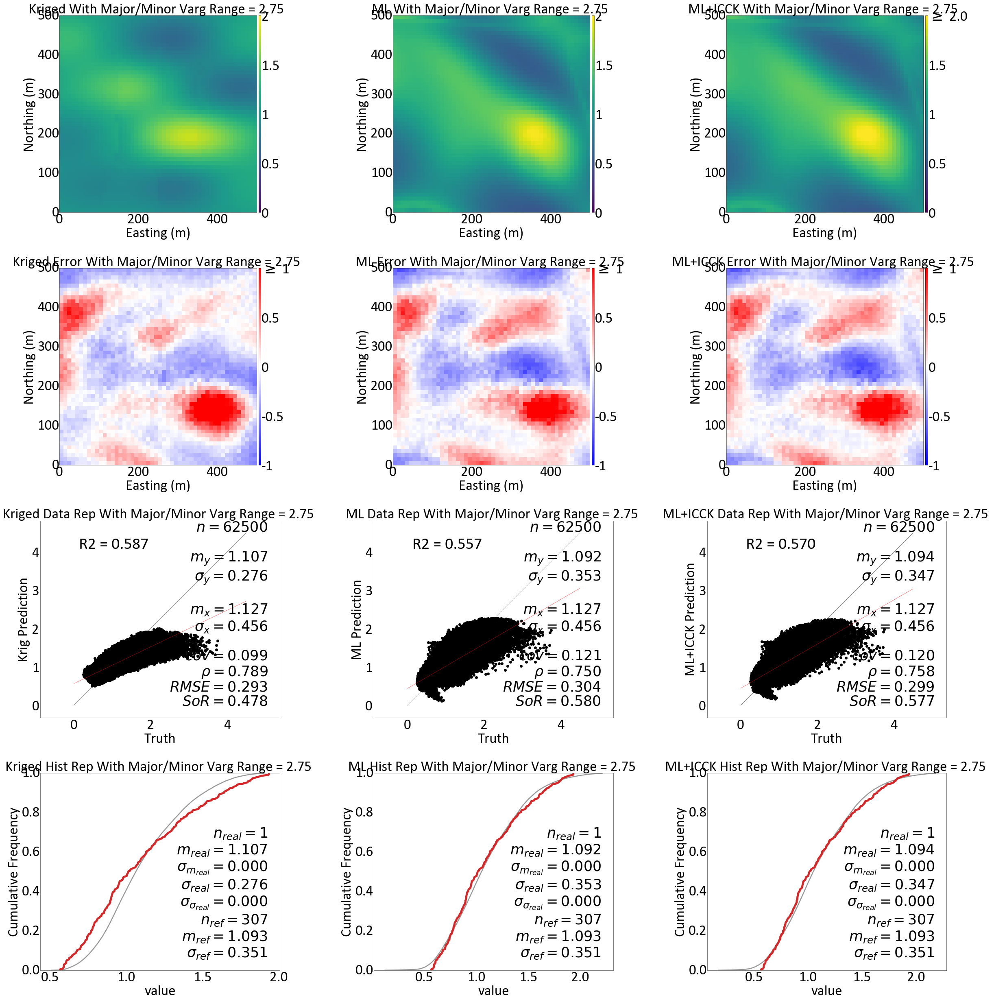

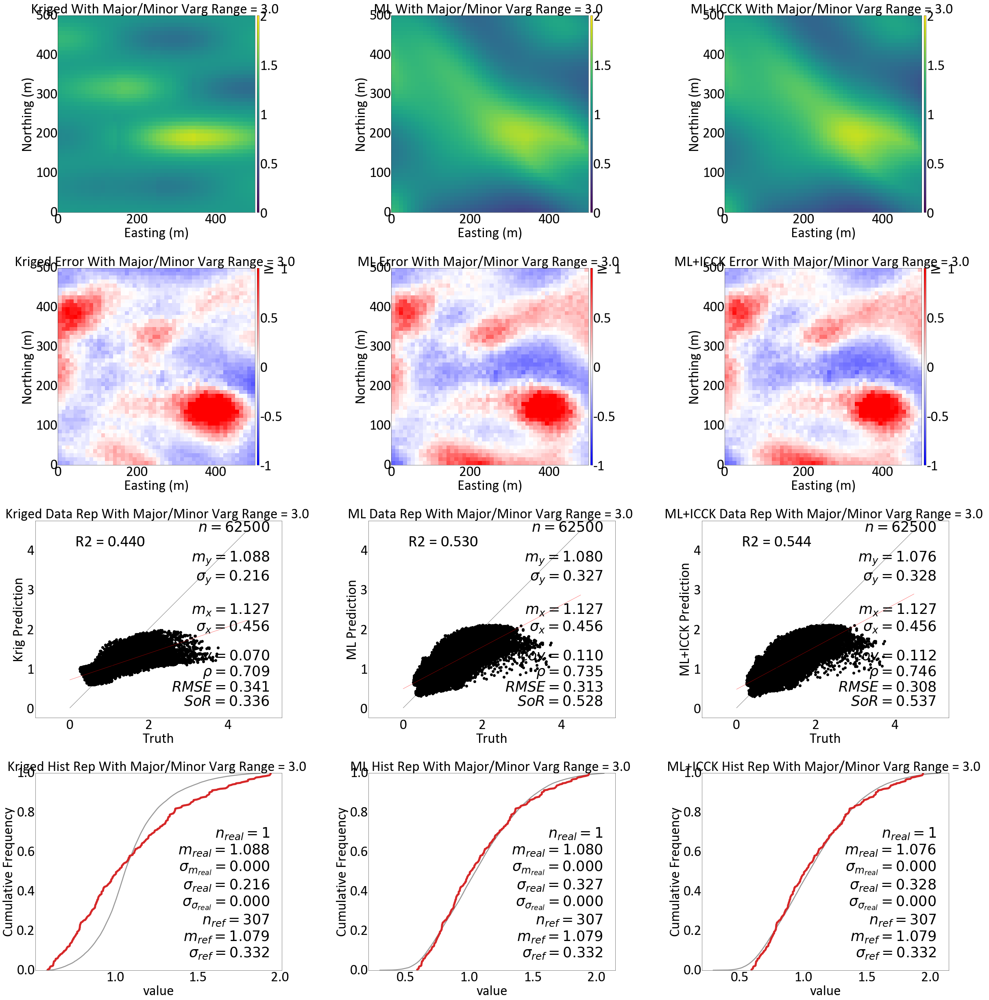

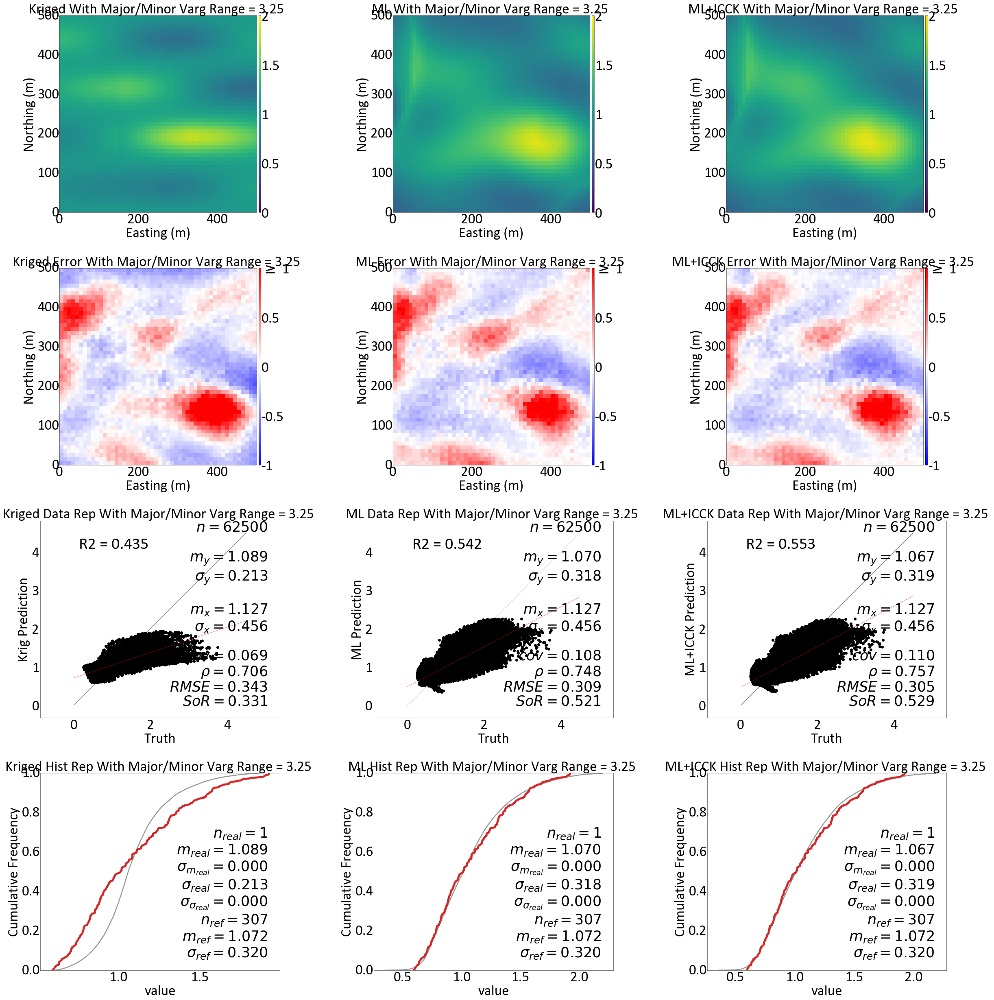

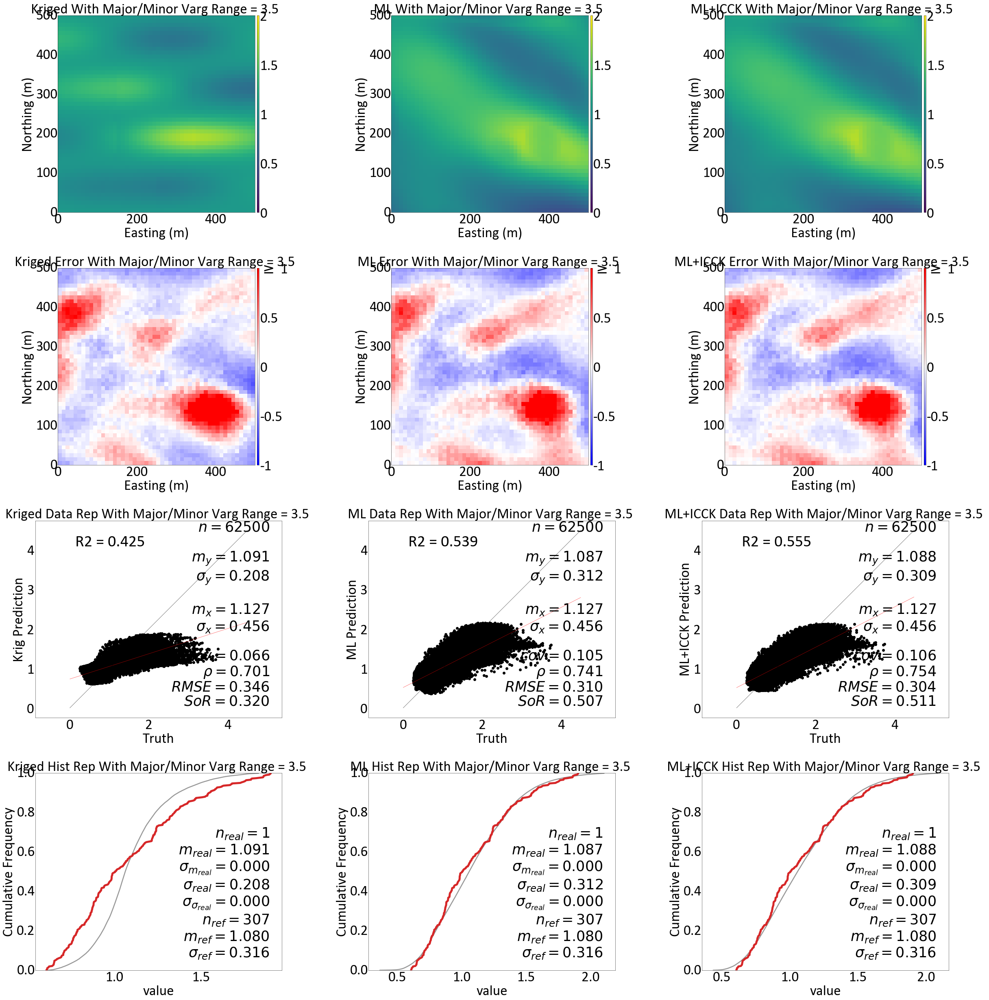

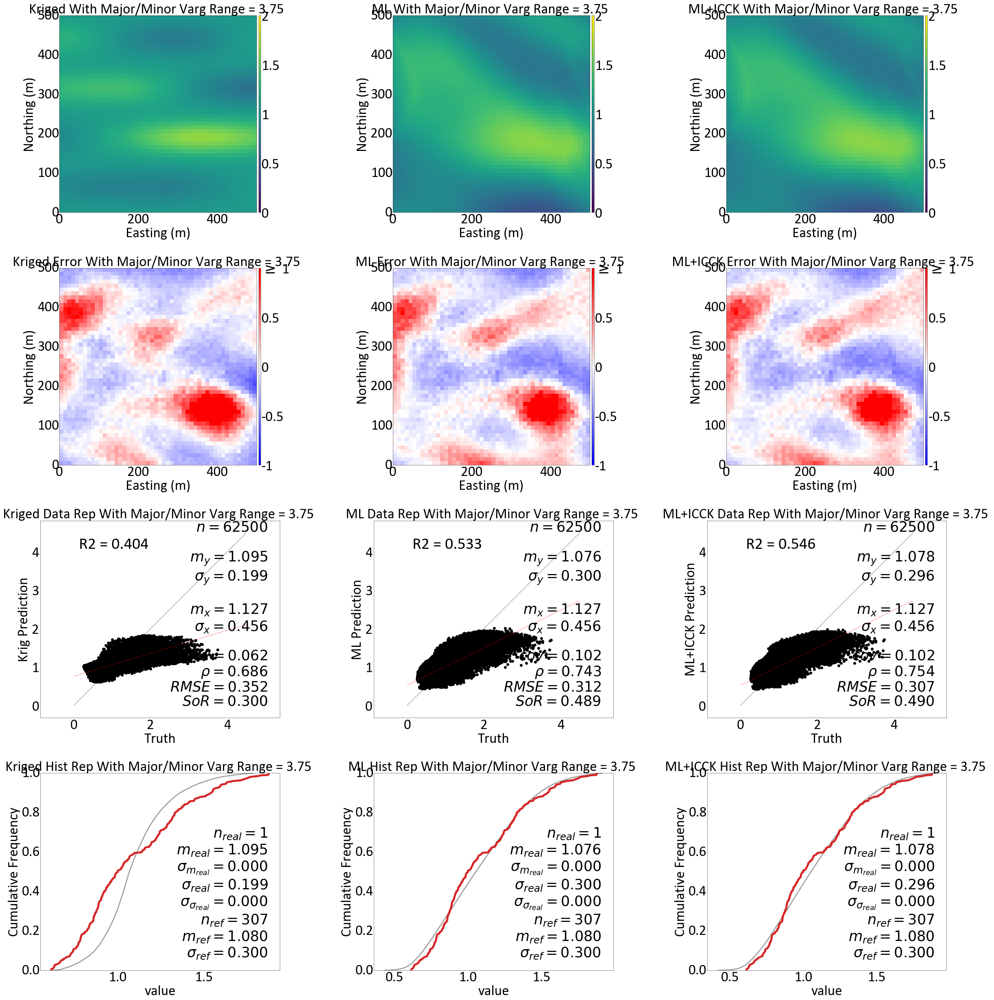

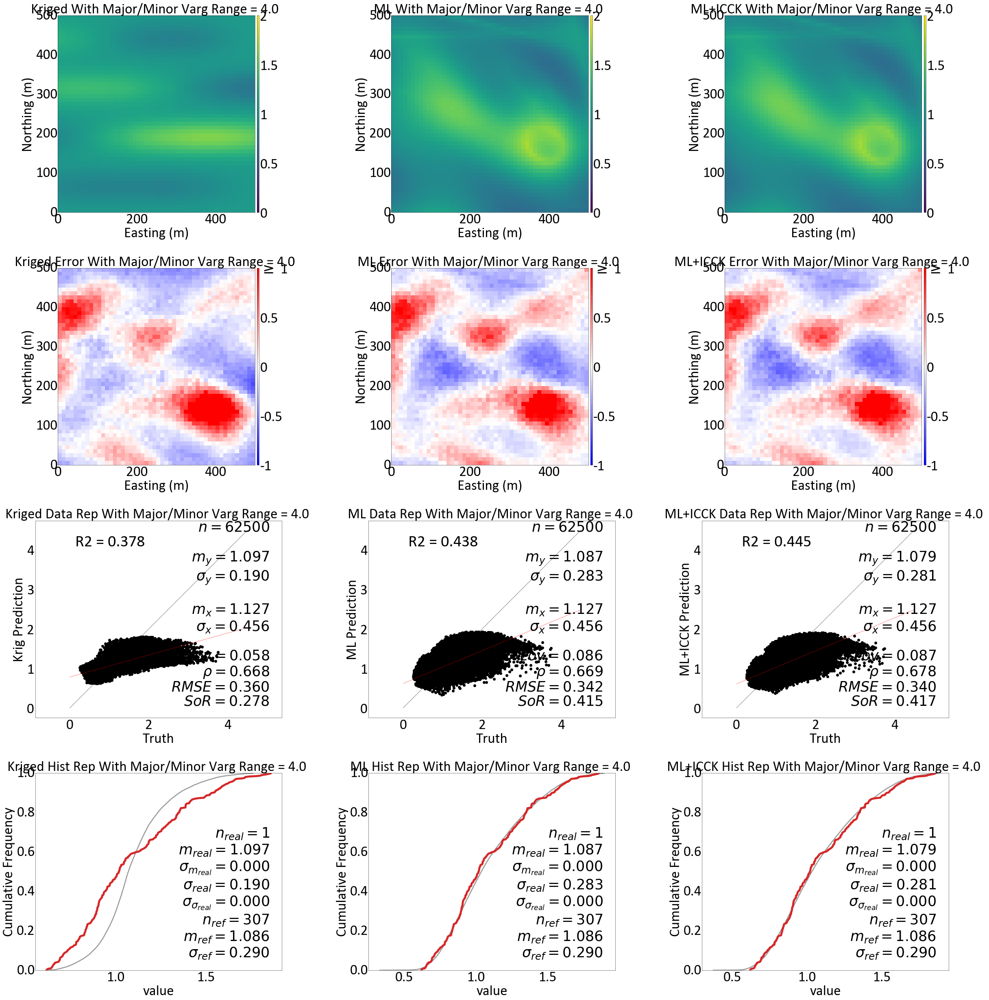

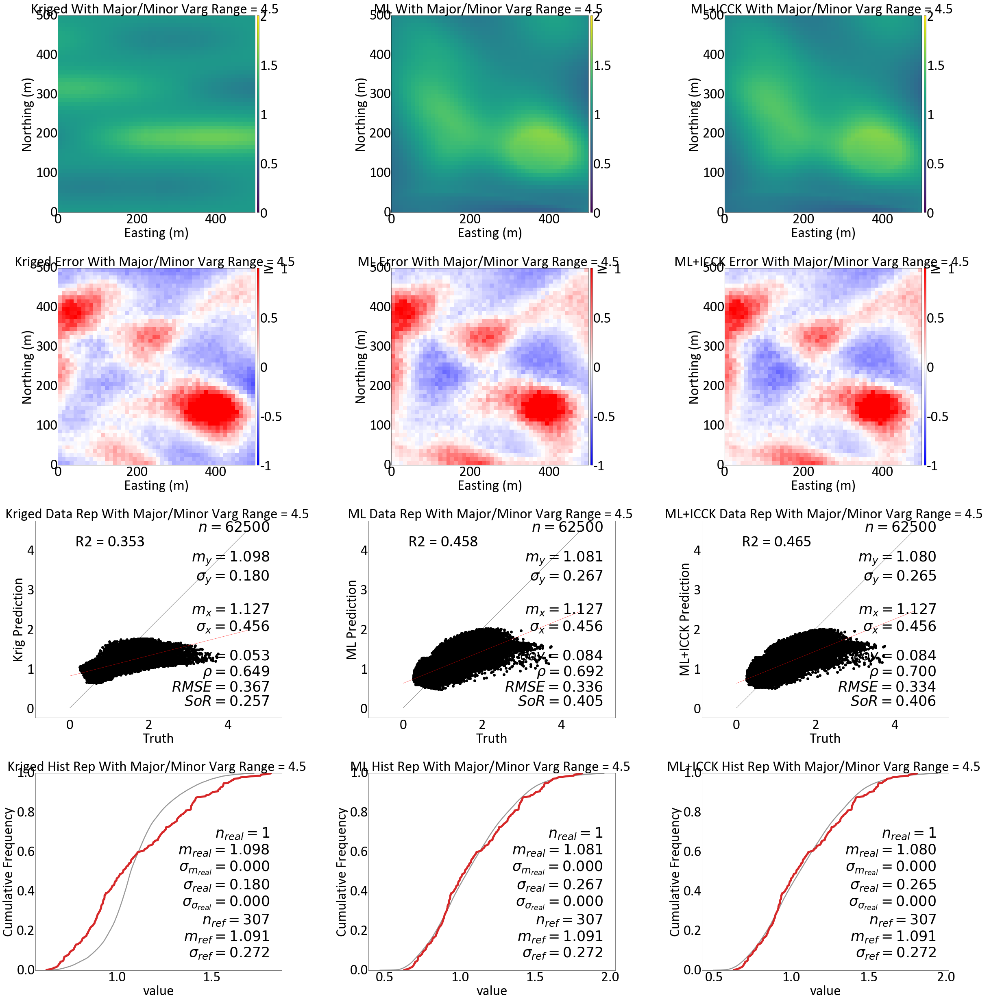

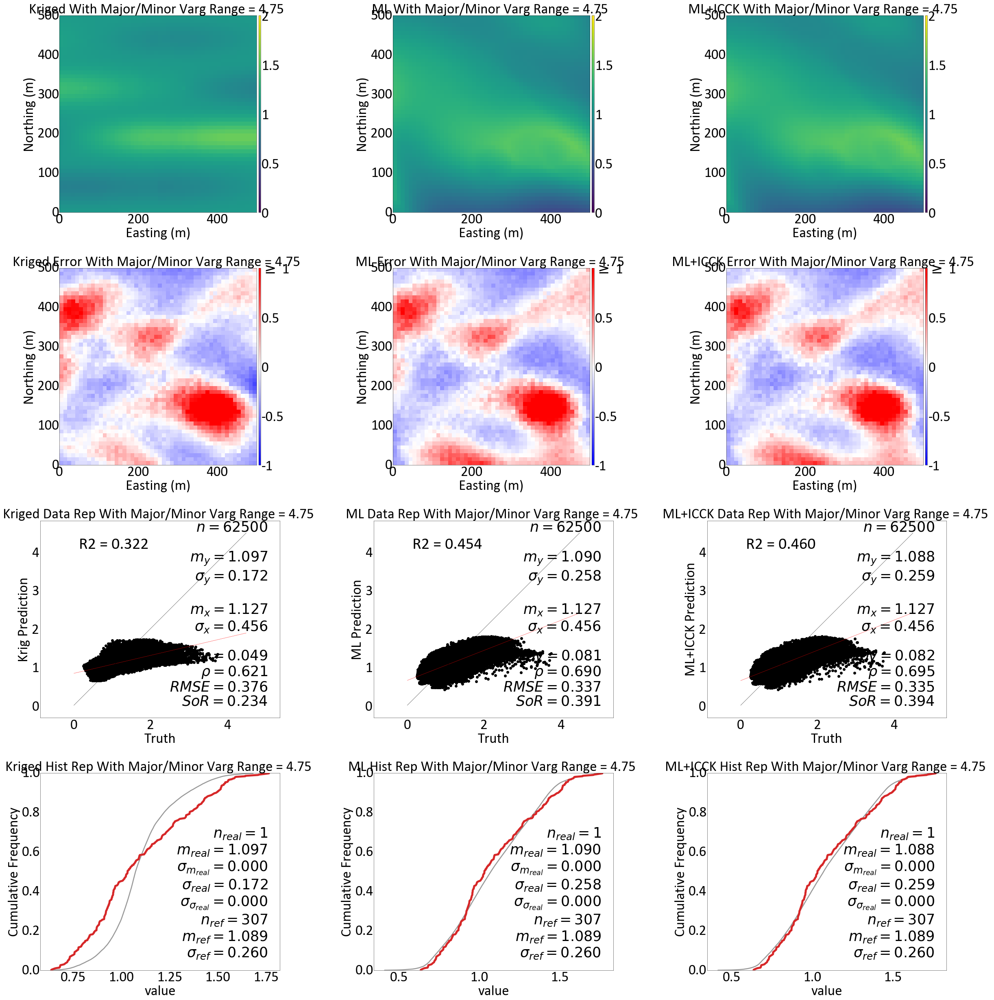

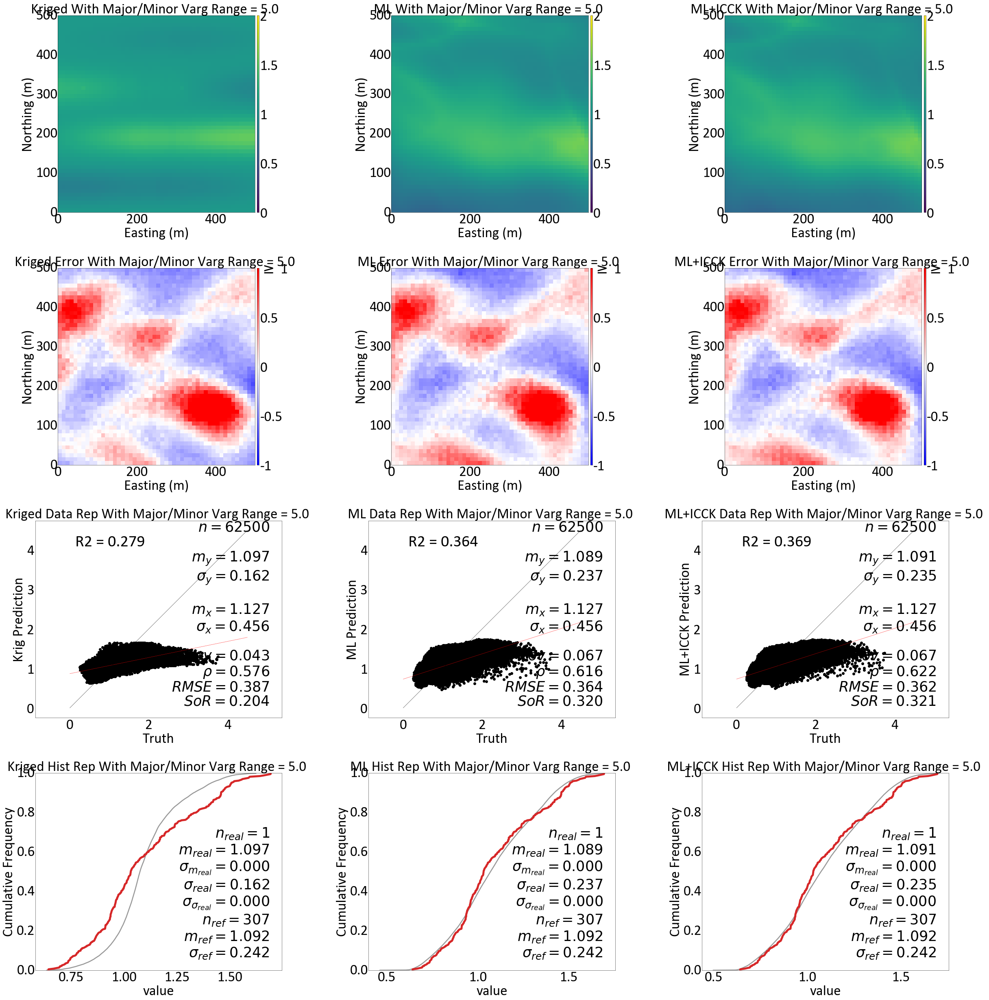

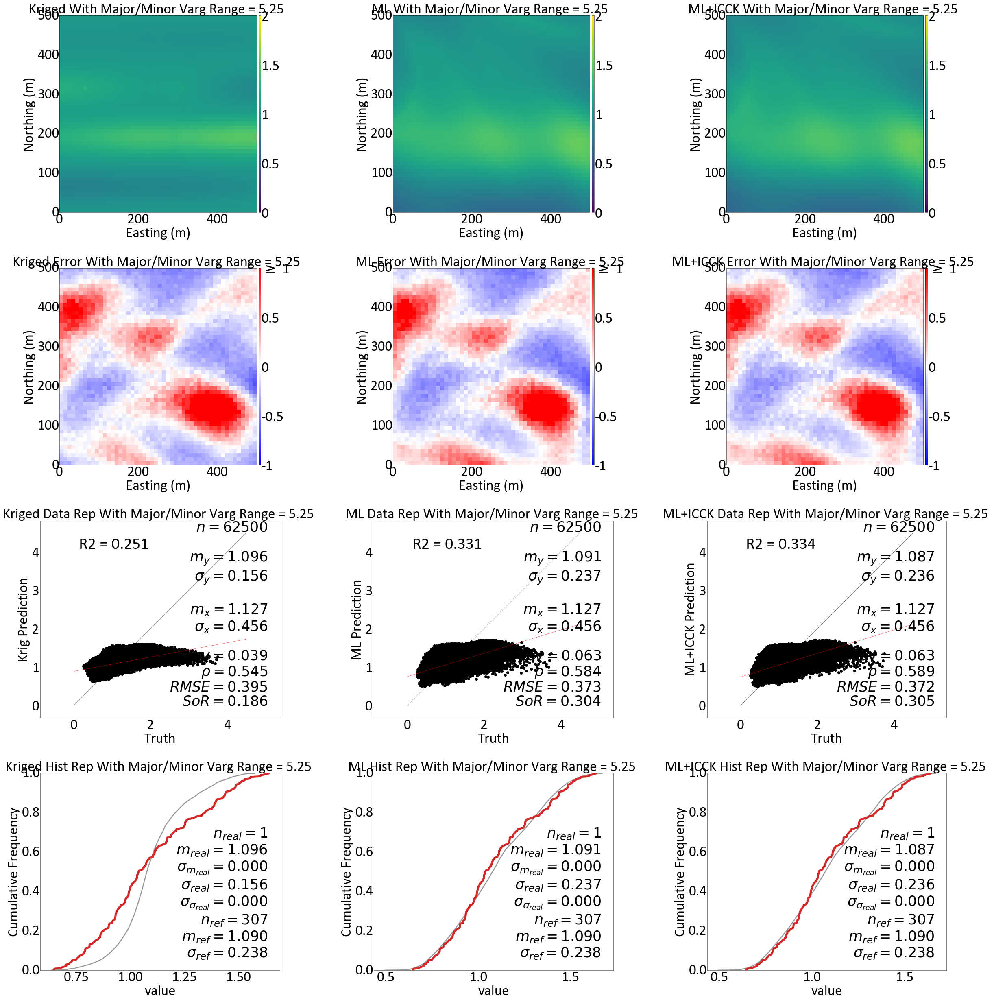

In [15]:
r2_krg_full = []
r2_ML_full = []
r2_ML_icck_full = []
rmse_krg_full = []
rmse_ML_full = []
rmse_ML_icck_full = []
mean_krig = [] 
mean_ML = []
mean_ML_icck = []
sigma_krig= []
sigma_ML= []
sigma_ML_icck= []
mean_real = []
sigma_real = []
sliceno = 20
vlim = (0,2.0)
elim = (-1,1)

gs.set_style('pt35')
for fold in range(1,11):
    sim_krig = gs.DataFile('./predictions/kt3dn_{}.out'.format(fold))
    sim_ml = gs.DataFile('./predictions/ensemble_{}.dat'.format(fold))
    sim_ml_icck = gs.DataFile('./backtr/backtr_UDDH_{}.out'.format(fold))
    truth = gs.DataFile('logn/logn_{}.out'.format(fold),griddef=griddef)
    f, axes = plt.subplots(4, 3, figsize=(35, 35)) 
    
    dataflpoints = gs.DataFile(flname='./declus/declus_{}.out'.format(fold), x='X',y='Y',z='Z', griddef = griddef,
                           readfl=True)  
    
    t_max_val = np.max(truth.data['value'].values)
    t_max_val = t_max_val+t_max_val*.2
    
    if fold <= 6:
        std = 2.50+(fold)*.25
    else:
        std = 2.50+(fold)*.25+.25
    std = float("{0:.2f}".format(std))
    gs.pixelplt(sim_krig.data['Estimate'],griddef=griddef,ax=axes[0,0] ,sliceno = sliceno,
                title = 'Kriged With Major/Minor Varg Range = {} '.format(std),vlim=vlim)
    gs.pixelplt(sim_ml.data['0'],griddef=griddef,ax=axes[0,1] ,sliceno = sliceno,
                title = 'ML With Major/Minor Varg Range = {} '.format(std),vlim=vlim)
    gs.pixelplt(sim_ml_icck.data['Back Transform'],griddef=griddef,ax=axes[0,2] ,sliceno = sliceno,
                title = 'ML+ICCK With Major/Minor Varg Range = {} '.format(std),vlim=vlim)
    gs.pixelplt((truth.data['value']-sim_krig.data['Estimate']),griddef=griddef,ax=axes[1,0] ,sliceno = sliceno,
                title = 'Kriged Error With Major/Minor Varg Range = {} '.format(std),vlim=elim,cmap = 'bwr')
    gs.pixelplt((truth.data['value']-sim_ml.data['0']),griddef=griddef,ax=axes[1,1] ,sliceno = sliceno,
                title = 'ML Error With Major/Minor Varg Range = {} '.format(std),vlim=elim,cmap = 'bwr')
    gs.pixelplt((truth.data['value']-sim_ml_icck.data['Back Transform']),griddef=griddef,ax=axes[1,2] ,sliceno = sliceno,
                title = 'ML+ICCK Error With Major/Minor Varg Range = {} '.format(std),vlim=elim,cmap = 'bwr')
    gs.scatxval(truth.data['value'],sim_krig.data['Estimate'],griddef=griddef,ax=axes[2,0] ,
                title = 'Kriged Data Rep With Major/Minor Varg Range = {} '.format(std),vlim=(0,t_max_val),
               xlabel = 'Truth', ylabel='Krig Prediction')
    axes[2,0].text(t_max_val-t_max_val*.97,t_max_val-t_max_val*0.09,'R2 = {0:.3f}'.format(r2_score(truth.data['value'],sim_krig.data['Estimate'].fillna(value = 2.7))),size=40)
    gs.scatxval(truth.data['value'],sim_ml.data['0'],griddef=griddef,ax=axes[2,1] ,
                title = 'ML Data Rep With Major/Minor Varg Range = {} '.format(std),vlim=(0,t_max_val),
               xlabel = 'Truth', ylabel='ML Prediction')
    axes[2,1].text(t_max_val-t_max_val*.97,t_max_val-t_max_val*0.09,'R2 = {0:.3f}'.format(r2_score(truth.data['value'],sim_ml.data['0'])),size=40)
    gs.scatxval(truth.data['value'],sim_ml_icck.data['Back Transform'],griddef=griddef,ax=axes[2,2] ,
                title = 'ML+ICCK Data Rep With Major/Minor Varg Range = {} '.format(std),vlim=(0,t_max_val),
               xlabel = 'Truth', ylabel='ML+ICCK Prediction')
    axes[2,2].text(t_max_val-t_max_val*.97,t_max_val-t_max_val*0.09,'R2 = {0:.3f}'.format(r2_score(truth.data['value'],sim_ml_icck.data['Back Transform'])),size=40)
    gs.histpltsim(sim_krig.data['Estimate'],dataflpoints.data['value'],refwt = dataflpoints.data['Declustering Weight']
                  ,griddef=griddef,ax=axes[3,0] ,lw=5,
                title = 'Kriged Hist Rep With Major/Minor Varg Range = {} '.format(std), nreal = 1 , )
    gs.histpltsim(sim_ml.data['0'],dataflpoints.data['value'],refwt = dataflpoints.data['Declustering Weight']
                  ,griddef=griddef,ax=axes[3,1] ,lw=5,
                title = 'ML Hist Rep With Major/Minor Varg Range = {} '.format(std), nreal = 1)
    gs.histpltsim(sim_ml_icck.data['Back Transform'],dataflpoints.data['value'],refwt = dataflpoints.data['Declustering Weight']
                  ,griddef=griddef,ax=axes[3,2] ,lw=5,
                title = 'ML+ICCK Hist Rep With Major/Minor Varg Range = {} '.format(std), nreal = 1)
    
    r2_krg_full.append(r2_score(truth.data['value'],sim_krig.data['Estimate']))
    r2_ML_full.append(r2_score(truth.data['value'],sim_ml.data['0']))
    r2_ML_icck_full.append(r2_score(truth.data['value'],sim_ml_icck.data['Back Transform']))
    rmse_krg_full.append(np.sqrt(mean_squared_error(truth.data['value'],sim_krig.data['Estimate'])))
    rmse_ML_full.append(np.sqrt(mean_squared_error(truth.data['value'],sim_ml.data['0'])))
    rmse_ML_icck_full.append(np.sqrt(mean_squared_error(truth.data['value'],sim_ml_icck.data['Back Transform'])))
    mean_krig.append(np.mean(sim_krig.data['Estimate']))
    mean_ML.append(np.mean(sim_ml.data['0']))
    mean_ML_icck.append(np.mean(sim_ml_icck.data['Back Transform']))
    sigma_krig.append(np.std(sim_krig.data['Estimate']))
    sigma_ML.append(np.std(sim_ml.data['0']))
    sigma_ML_icck.append(np.std(sim_ml_icck.data['Back Transform']))
    mean_real.append(gs.weightedmean(dataflpoints.data['value'], dataflpoints.data['Declustering Weight']))
    sigma_real.append(gs.weightedvar(dataflpoints.data['value'], dataflpoints.data['Declustering Weight']))
    
    plt.tight_layout()  
    plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Data_Number_{}_{}.png'.format(fold,plt_extent))

In [16]:
gs.weightedmean(dataflpoints.data['value'], dataflpoints.data['Declustering Weight'])

1.0896590091032554

In [17]:
num_dhs = np.zeros(shape=(10))
k = 0
for i in range(1,11):
    if fold <= 6:
        num_dhs[k] = 2.50+(i)*.25
    else:
        num_dhs[k] = 2.50+(i)*.25+.25
    k += 1
ML_Stats = np.vstack((num_dhs,sigma_real,mean_real,rmse_ML_full,r2_ML_full,sigma_ML,mean_ML)).T
ML_icck_Stats = np.vstack((num_dhs,sigma_real,mean_real,rmse_ML_icck_full,r2_ML_icck_full,sigma_ML_icck,mean_ML_icck)).T
Krig_Stats = np.vstack((num_dhs,sigma_real,mean_real,rmse_krg_full,r2_krg_full,sigma_krig,mean_krig)).T


In [18]:
num_dhs

array([3.  , 3.25, 3.5 , 3.75, 4.  , 4.25, 4.5 , 4.75, 5.  , 5.25])

In [19]:
print(r2_ML_icck_full)
print(rmse_ML_icck_full)

[0.5700261202727804, 0.5442081746779865, 0.55294859674539, 0.5549820225922478, 0.5456905226463383, 0.4451601307611398, 0.46508268221395244, 0.4598665182418853, 0.36919096749250235, 0.3342222810670442]
[0.29906212601784404, 0.30790989487019105, 0.3049433105153083, 0.3042489984904855, 0.3074087874654951, 0.3397224206220945, 0.33356748359617555, 0.3351899040081801, 0.36223409973949466, 0.3721388472232433]


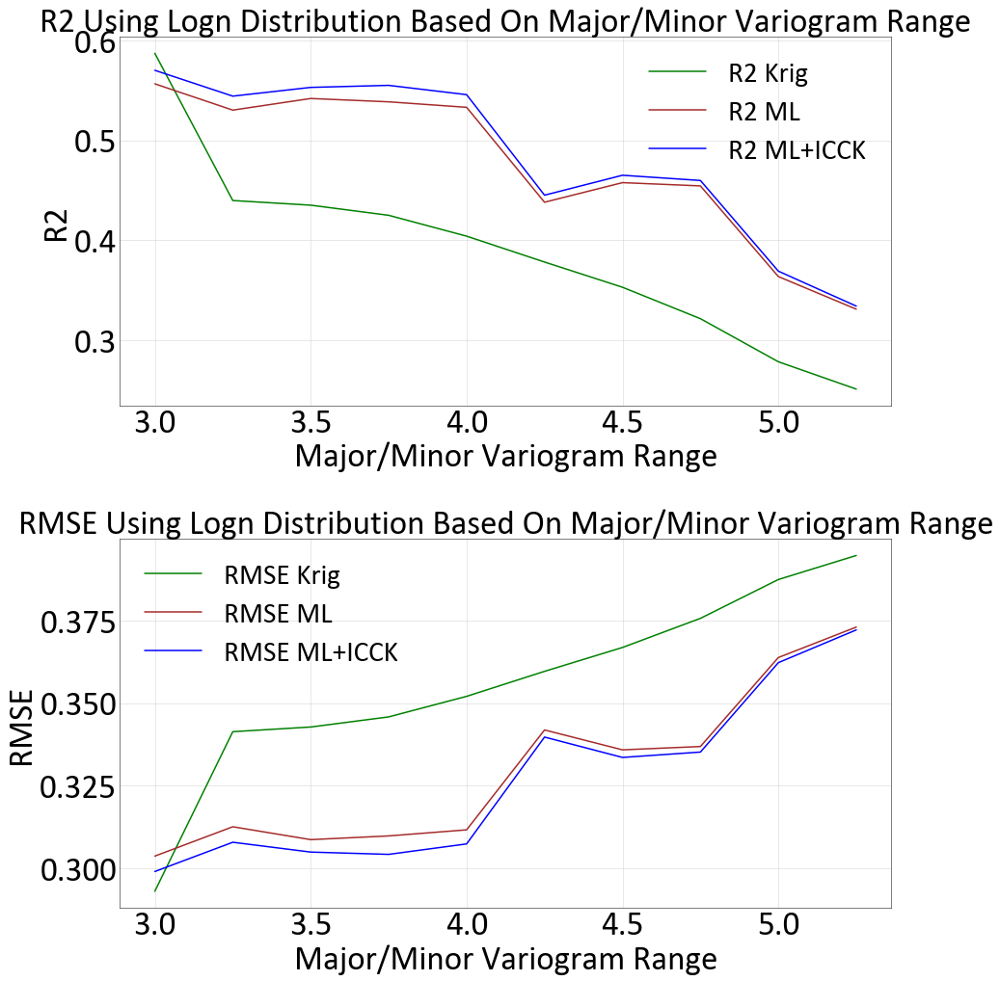

In [20]:
f, (ax1,ax2) = plt.subplots(2, 1,figsize=(15, 15))
ax1.plot(num_dhs, np.asarray(r2_krg_full),color="green", label ='R2 Krig')
ax1.plot(num_dhs, np.asarray(r2_ML_full),color="brown", label ='R2 ML')
ax1.plot(num_dhs, np.asarray(r2_ML_icck_full),color="blue", label ='R2 ML+ICCK')
ax1.set_xlabel('Major/Minor Variogram Range')
ax1.grid(True)
ax1.set_title('R2 Using Logn Distribution Based On Major/Minor Variogram Range')
ax1.set_ylabel('R2', color='Black')
ax1.tick_params(axis='y', labelcolor='Black')
ax1.legend(loc='best',fontsize = 'small')
#ax1.invert_xaxis()
#ax1.set_ylim([0.4,1])

ax2.plot(num_dhs, np.asarray(rmse_krg_full),'-',color="green",label ='RMSE Krig')
ax2.plot(num_dhs, np.asarray(rmse_ML_full),'-',color="brown",label ='RMSE ML')
ax2.plot(num_dhs, np.asarray(rmse_ML_icck_full),'-',color="blue",label ='RMSE ML+ICCK')
ax2.set_title('RMSE Using Logn Distribution Based On Major/Minor Variogram Range')
ax2.grid(True)
ax2.set_xlabel('Major/Minor Variogram Range')
ax2.set_ylabel('RMSE', color='Black')
ax2.tick_params(axis='y', labelcolor='Black')
ax2.legend(loc='best',fontsize = 'small')
#ax2.invert_xaxis()
#ax2.set_ylim([0,0.8])
plt.tight_layout()  
plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Sum_graph_{}.png'.format(plt_extent))

In [21]:
ml_sim = np.asarray(ML_Stats).flatten().reshape(len(np.asarray(ML_Stats).flatten()),1)
icck_ml_sim = np.asarray(ML_icck_Stats).flatten().reshape(len(np.asarray(ML_icck_Stats).flatten()),1)
krig_sim = np.asarray(Krig_Stats).flatten().reshape(len(np.asarray(Krig_Stats).flatten()),1)

In [22]:
np.savetxt('ML_stats.csv', ML_Stats, delimiter = ',')
np.savetxt('Krig_stats.csv', Krig_Stats, delimiter = ',')
np.savetxt('ML_icck_stats.csv', ML_icck_Stats, delimiter = ',')

In [ ]:
# samplefl = gs.DataFile('datasamplefl.out')
# gs.set_style('pt25')
# xlim=(-0.05,2)
# f, axes = plt.subplots(3, 1, figsize=(25, 20))
# gs.histpltsim(krig_sim,samplefl.data['value'],griddef=griddef,nreal=20,ax = axes[0],
#               title = 'CDF Sensitivity Study Krig ', xlim=xlim)
# gs.histpltsim(ml_sim,samplefl.data['value'],griddef=griddef,nreal=20,ax = axes[1],
#               title = 'CDF Sensitivity Study ML ', xlim=xlim)
# gs.histpltsim(icck_ml_sim,samplefl.data['value'],griddef=griddef,nreal=20,ax = axes[2],
#               title = 'CDF Sensitivity Study ML+OICCK ', xlim=xlim)
# plt.tight_layout()    
# plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Dist_study_{}.png'.format(plt_extent))

In [ ]:
# gs.set_style('pt25')
# ylim = (-.2,1.2)
# f, axes = plt.subplots(3, 2, figsize=(25, 20))
# for fold in range(1,2):
#     varmodelfl = gs.DataFile('./vargs/varmodel_{}.out'.format(fold))
#     varcalcfl = gs.DataFile('./vargs/varcalc_{}.out'.format(fold))
#     for p_type in list(['Krig','ML','OICCK+ML']):
#         if p_type == 'Krig':
#             predfile = gs.DataFile('./predictions/kt3dn_{}.out'.format(fold),griddef=griddef)
#             col = 1
#         if p_type == 'OICCK+ML':
#             predfile = gs.DataFile('./backtr/backtr_UDDH_{}.out'.format(fold),griddef=griddef)
#             col = 3
#         else:
#             predfile = gs.DataFile('./predictions/ensemble_{}.dat'.format(fold),griddef=griddef)
#             col = 1
            
#         varsim.run(varsimparstr.format(datafl = predfile,
#                                        p_type = p_type,
#                                        fold = fold,
#                                        col = col,
#                                        griddef = griddef),quiet=True,liveoutput=False)
#         varsimfl =  gs.DataFile('./vargs/varsim_reals_{}_{}.out'.format(p_type,fold))
    

#         if p_type == 'Krig':
#             ax = gs.varplt(varsimfl,experimental=False,color ='C0' ,index = 1,ax =axes[0,0],ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             ax = gs.varplt(varcalcfl.data,index = 1,ax =ax,color ='C1' ,ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold),label= 'Experimental',ylim=ylim)
#             ax = gs.varplt(varmodelfl,experimental=False,color ='C1' ,index = 1,ax =ax, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold),label= 'Model',ylim=ylim)
#             ax.legend(loc=7,prop={'size': 20})
#             ax.set_xlim(0, 400)
            
#             ax2 = gs.varplt(varsimfl,experimental=False,color ='C0' ,ms = 10,index = 2,ax =axes[0,1], title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             ax2 = gs.varplt(varcalcfl.data,index = 2,ax =ax2,color ='C1' ,ms = 10, title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold),label= 'Experimental',ylim=ylim)
#             ax2 = gs.varplt(varmodelfl,experimental=False,color ='C1' ,ms = 10,index = 2,ax =ax2, title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold),label= 'Model',ylim=ylim)
#             ax2.legend(loc=7,prop={'size': 20})
#             ax2.set_xlim(0, 400)
            
#         if p_type == 'ML':
#             ax4 = gs.varplt(varsimfl,experimental=False,color ='C0' ,index = 1,ax = axes[1,0],ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             ax4.legend(loc=7,prop={'size': 20})
#             ax4.set_xlim(0, 400)
#             ax5 = gs.varplt(varsimfl,experimental=False,color ='C0' ,ms = 10,index = 2,ax = axes[1,1], title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             ax5.set_xlim(0, 400)

#         if p_type == 'OICCK+ML':
#             ax6 = gs.varplt(varsimfl,experimental=False,color ='C0' ,index = 1,ax = axes[2,0],ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             #ax = gs.varplt(varcalcfl.data,index = 1,ax =ax,color ='C1' ,ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold),label= 'Experimental')
#             #ax = gs.varplt(varmodelfl,experimental=False,color ='C1' ,index = 1,ax =ax, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold),label= 'Model')
#             ax6.legend(loc=7,prop={'size': 20})
#             ax6.set_xlim(0, 400)
#             ax7 = gs.varplt(varsimfl,experimental=False,color ='C0' ,ms = 10,index = 2,ax = axes[2,1], title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             #ax2 = gs.varplt(varcalcfl.data,index = 2,ax =ax2,color ='C1' ,ms = 10, title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold),label= 'Experimental')
#             #ax2 = gs.varplt(varmodelfl,experimental=False,color ='C1' ,ms = 10,index = 2,ax =ax2, title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold),label= 'Model')
#             ax7.legend(loc=7,prop={'size': 20})
#             ax7.set_xlim(0, 400)


#     plt.tight_layout()    
#     plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/varg_rep_ERBFN_{}_{}.png'.format(plt_extent,fold))
#     plt.show()
